In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install tensorflow
!pip install tensorflow_addons
!pip install symspellpy
!pip install Levenshtein
!pip install pillow
!pip install path

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.5/98.5 kB 10.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for editdistpy: filename=editdistpy-0.1.4-cp310-cp310-linux_x86_64.whl size=187489 sha256=911260e28fd8b4e07f77067b785a2107e37d4258a84beb4cbe0440a14d831462
  Stored in directory: /root/.cache/pip/wheels/4c/0f/10/c20d67cd765ee5b3666d759a307241bba0663135d6ee1c0072
Successfully built editdistpy
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.4/177.4 kB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 18.8 MB/s eta 0:00:00


In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
import scipy.stats as stats
from typing import List
from PIL import Image as im
import matplotlib.pyplot as plt
from path import Path
from collections import defaultdict
from dataclasses import dataclass
from sklearn.cluster import DBSCAN
import argparse
import tensorflow as tf
from tensorflow import keras
import re
import pickle

In [ ]:
def load_images_from_folder(folder):
    images=[]
    for filename in os.listdir(folder):
        img=cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

In [ ]:
def enhance_res(image, scale_factor=2):
    width=int(image.shape[1] * scale_factor)
    height=int(image.shape[0] * scale_factor)
    dim=(width, height)
    high_res_image=cv2.resize(image, dim, interpolation=cv2.INTER_CUBIC)
    return high_res_image

# Preprocessing functions
def color_corr(image):
    lab=cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b=cv2.split(lab)
    clahe=cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl=clahe.apply(l)
    limg=cv2.merge((cl, a, b))
    final=cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return final

def fix_bright_cont(image, brightness=0, contrast=30):
    beta=brightness
    alpha=contrast/127.0+1.0
    new_image=cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return new_image

def edge_enhance(image):
    gray=cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges=cv2.Canny(gray, 250, 450)
    edges=cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
    enhanced_image=cv2.addWeighted(image, 0.85, edges, 0.15, 0)
    return enhanced_image

def fix_shadows(image):
    rgb_planes=cv2.split(image)
    result_planes=[]
    for plane in rgb_planes:
        dilated_img=cv2.dilate(plane, np.ones((7, 7), np.uint8))
        bg_img=cv2.medianBlur(dilated_img, 21)
        diff_img=255-cv2.absdiff(plane, bg_img)
        result_planes.append(diff_img)
    result=cv2.merge(result_planes)
    return result

def fix_sharp(image):
    kernel=np.array([[0, -1, 0],
                    [-1, 5, -1],
                    [0, -1, 0]])
    sharpened=cv2.filter2D(image, -1, kernel)
    return sharpened

def enhance_img(image: np.ndarray)->np.ndarray:
    image=color_corr(image)
    image=fix_bright_cont(image)
    image=edge_enhance(image)
    image=fix_shadows(image)
    image=fix_sharp(image)
    return image

def preprocess_img(source: str, final: str):
    images=load_images_from_folder(source)
    preprocessed_images=[enhance_img(image) for image in images]
    save_images_to_folder(preprocessed_images, final, dpi=300)

def load_images_from_folder(folder: str) -> List[np.ndarray]:
    images=[]
    for filename in os.listdir(folder):
        img=cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

def save_images_to_folder(images: List[np.ndarray], final: str, dpi=300):
    if not os.path.exists(final):
        os.makedirs(final)
    for i, image in enumerate(images):
        pil_image=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pil_image=im.fromarray(pil_image)
        pil_image.save(os.path.join(final, f"preprocessed_{i}.png"), dpi=(dpi, dpi))

source = '/content/drive/MyDrive/HTR_Data/Original'
final = '/content/drive/MyDrive/HTR_Data/Preprocess'
preprocess_img(source, final)

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_0.png
1090 189 66 56
['line0_word0.jpg']
1458 196 57 48
['line0_word0.jpg', 'line0_word1.jpg']
87 385 63 56
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg']
98 313 64 75
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg']
58 289 222 171
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg']
183 417 54 40
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg']
319 441 64 49
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg']
278 478 205 103
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg', 'line1_word5.jpg']
293 279 335 148
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'li

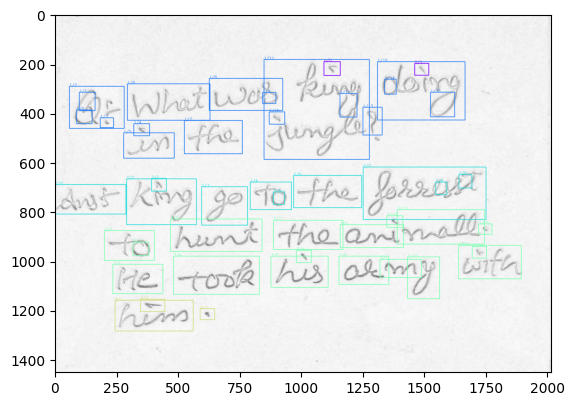

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_1.png
183 86 51 54
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg', 'line1_word5.jpg', 'line1_word6.jpg', 'line1_word7.jpg', 'line1_word8.jpg', 'line1_word9.jpg', 'line1_word10.jpg', 'line1_word11.jpg', 'line1_word12.jpg', 'line1_word13.jpg', 'line1_word14.jpg', 'line1_word15.jpg', 'line1_word16.jpg', 'line2_word0.jpg', 'line2_word1.jpg', 'line2_word2.jpg', 'line2_word3.jpg', 'line2_word4.jpg', 'line2_word5.jpg', 'line2_word6.jpg', 'line2_word7.jpg', 'line2_word8.jpg', 'line2_word9.jpg', 'line3_word0.jpg', 'line3_word1.jpg', 'line3_word2.jpg', 'line3_word3.jpg', 'line3_word4.jpg', 'line3_word5.jpg', 'line3_word6.jpg', 'line3_word7.jpg', 'line3_word8.jpg', 'line3_word9.jpg', 'line3_word10.jpg', 'line3_word11.jpg', 'line3_word12.jpg', 'line3_word13.jpg', 'line3_word14.jpg', 'line3_word15.jpg', 'line3_word16.jpg', 'line4_word0.jpg', '

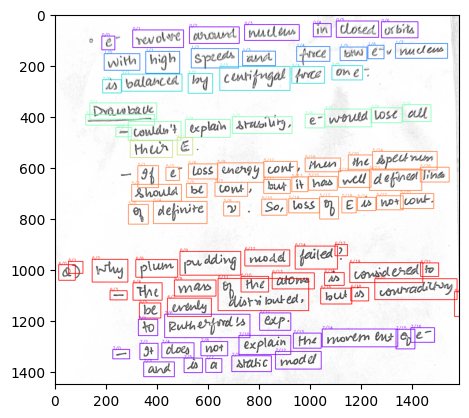

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_2.png
44 76 57 65
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg', 'line1_word5.jpg', 'line1_word6.jpg', 'line1_word7.jpg', 'line1_word8.jpg', 'line1_word9.jpg', 'line1_word10.jpg', 'line1_word11.jpg', 'line1_word12.jpg', 'line1_word13.jpg', 'line1_word14.jpg', 'line1_word15.jpg', 'line1_word16.jpg', 'line2_word0.jpg', 'line2_word1.jpg', 'line2_word2.jpg', 'line2_word3.jpg', 'line2_word4.jpg', 'line2_word5.jpg', 'line2_word6.jpg', 'line2_word7.jpg', 'line2_word8.jpg', 'line2_word9.jpg', 'line3_word0.jpg', 'line3_word1.jpg', 'line3_word2.jpg', 'line3_word3.jpg', 'line3_word4.jpg', 'line3_word5.jpg', 'line3_word6.jpg', 'line3_word7.jpg', 'line3_word8.jpg', 'line3_word9.jpg', 'line3_word10.jpg', 'line3_word11.jpg', 'line3_word12.jpg', 'line3_word13.jpg', 'line3_word14.jpg', 'line3_word15.jpg', 'line3_word16.jpg', 'line4_word0.jpg', 'l

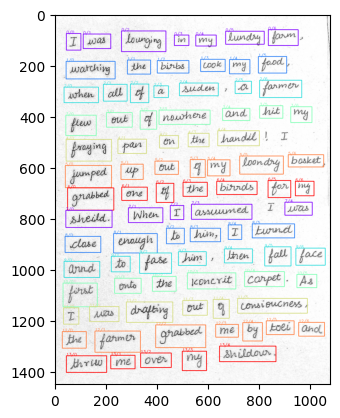

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_3.png
29 124 95 65
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg', 'line1_word5.jpg', 'line1_word6.jpg', 'line1_word7.jpg', 'line1_word8.jpg', 'line1_word9.jpg', 'line1_word10.jpg', 'line1_word11.jpg', 'line1_word12.jpg', 'line1_word13.jpg', 'line1_word14.jpg', 'line1_word15.jpg', 'line1_word16.jpg', 'line2_word0.jpg', 'line2_word1.jpg', 'line2_word2.jpg', 'line2_word3.jpg', 'line2_word4.jpg', 'line2_word5.jpg', 'line2_word6.jpg', 'line2_word7.jpg', 'line2_word8.jpg', 'line2_word9.jpg', 'line3_word0.jpg', 'line3_word1.jpg', 'line3_word2.jpg', 'line3_word3.jpg', 'line3_word4.jpg', 'line3_word5.jpg', 'line3_word6.jpg', 'line3_word7.jpg', 'line3_word8.jpg', 'line3_word9.jpg', 'line3_word10.jpg', 'line3_word11.jpg', 'line3_word12.jpg', 'line3_word13.jpg', 'line3_word14.jpg', 'line3_word15.jpg', 'line3_word16.jpg', 'line4_word0.jpg', '

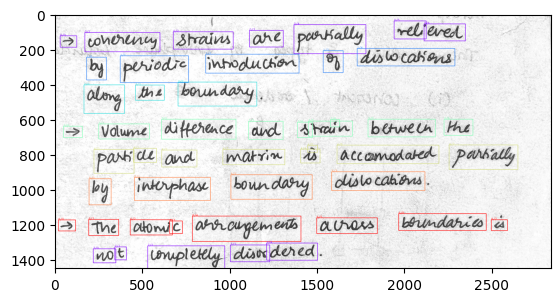

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_4.png
107 100 116 73
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg', 'line1_word5.jpg', 'line1_word6.jpg', 'line1_word7.jpg', 'line1_word8.jpg', 'line1_word9.jpg', 'line1_word10.jpg', 'line1_word11.jpg', 'line1_word12.jpg', 'line1_word13.jpg', 'line1_word14.jpg', 'line1_word15.jpg', 'line1_word16.jpg', 'line2_word0.jpg', 'line2_word1.jpg', 'line2_word2.jpg', 'line2_word3.jpg', 'line2_word4.jpg', 'line2_word5.jpg', 'line2_word6.jpg', 'line2_word7.jpg', 'line2_word8.jpg', 'line2_word9.jpg', 'line3_word0.jpg', 'line3_word1.jpg', 'line3_word2.jpg', 'line3_word3.jpg', 'line3_word4.jpg', 'line3_word5.jpg', 'line3_word6.jpg', 'line3_word7.jpg', 'line3_word8.jpg', 'line3_word9.jpg', 'line3_word10.jpg', 'line3_word11.jpg', 'line3_word12.jpg', 'line3_word13.jpg', 'line3_word14.jpg', 'line3_word15.jpg', 'line3_word16.jpg', 'line4_word0.jpg',

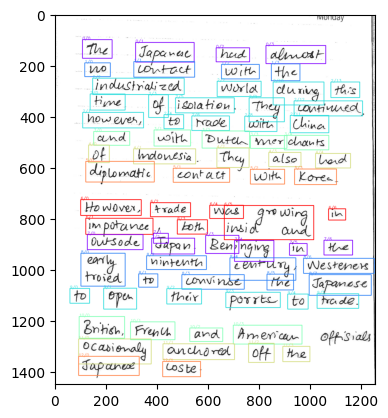

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_5.png
136 68 64 50
['line0_word0.jpg', 'line0_word1.jpg', 'line1_word0.jpg', 'line1_word1.jpg', 'line1_word2.jpg', 'line1_word3.jpg', 'line1_word4.jpg', 'line1_word5.jpg', 'line1_word6.jpg', 'line1_word7.jpg', 'line1_word8.jpg', 'line1_word9.jpg', 'line1_word10.jpg', 'line1_word11.jpg', 'line1_word12.jpg', 'line1_word13.jpg', 'line1_word14.jpg', 'line1_word15.jpg', 'line1_word16.jpg', 'line2_word0.jpg', 'line2_word1.jpg', 'line2_word2.jpg', 'line2_word3.jpg', 'line2_word4.jpg', 'line2_word5.jpg', 'line2_word6.jpg', 'line2_word7.jpg', 'line2_word8.jpg', 'line2_word9.jpg', 'line3_word0.jpg', 'line3_word1.jpg', 'line3_word2.jpg', 'line3_word3.jpg', 'line3_word4.jpg', 'line3_word5.jpg', 'line3_word6.jpg', 'line3_word7.jpg', 'line3_word8.jpg', 'line3_word9.jpg', 'line3_word10.jpg', 'line3_word11.jpg', 'line3_word12.jpg', 'line3_word13.jpg', 'line3_word14.jpg', 'line3_word15.jpg', 'line3_word16.jpg', 'line4_word0.jpg', '

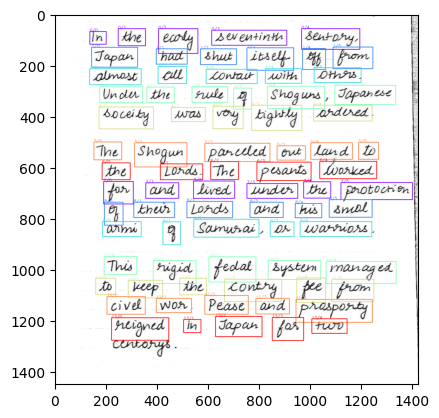

In [ ]:
@dataclass
class BBox:
    x: int
    y: int
    w: int
    h: int

@dataclass
class DetectorRes:
    img: np.ndarray
    bbox: BBox

def detect(img: np.ndarray, kernel_size: int, sigma: float, theta: float, min_area: int) -> List[DetectorRes]:
    assert img.ndim == 2
    assert img.dtype == np.uint8
    kernel = _compute_kernel(kernel_size, sigma, theta)
    img_filtered = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE).astype(np.uint8)
    img_thres = 255 - cv2.threshold(img_filtered, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    res = []
    components = cv2.findContours(img_thres, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    for c in components:
        if cv2.contourArea(c) < min_area:
            continue
        x, y, w, h = cv2.boundingRect(c)
        padding = 11
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = w + 2 * padding
        h = h + 2 * padding
        crop = img[y:y + h, x:x + w]
        res.append(DetectorRes(crop, BBox(x, y, w, h)))
    return res

def _compute_kernel(kernel_size: int, sigma: float, theta: float) -> np.ndarray:
    """Computing anisotropic filter kernel."""
    assert kernel_size % 2
    half_size = kernel_size // 2
    xs = ys = np.linspace(-half_size, half_size, kernel_size)
    x, y = np.meshgrid(xs, ys)
    sigma_y = sigma
    sigma_x = sigma_y * theta
    exp_term = np.exp(-x ** 2 / (2 * sigma_x) - y ** 2 / (2 * sigma_y))
    x_term = (x ** 2 - sigma_x ** 2) / (2 * np.math.pi * sigma_x ** 5 * sigma_y)
    y_term = (y ** 2 - sigma_y ** 2) / (2 * np.math.pi * sigma_y ** 5 * sigma_x)
    kernel = (x_term + y_term) * exp_term
    kernel = kernel / np.sum(kernel)
    return kernel

def prepare_img(img: np.ndarray, height: int) -> np.ndarray:
    """Converting image to grayscale image (if needed) and resize to given height."""
    assert img.ndim in (2, 3)
    assert height > 0
    assert img.dtype == np.uint8
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h = img.shape[0]
    factor = height / h
    return cv2.resize(img, dsize=None, fx=factor, fy=factor)

def _cluster_lines(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    num_bboxes = len(detections)
    dist_mat = np.ones((num_bboxes, num_bboxes))
    for i in range(num_bboxes):
        for j in range(i, num_bboxes):
            a = detections[i].bbox
            b = detections[j].bbox
            if a.y > b.y + b.h or b.y > a.y + a.h:
                continue
            intersection = min(a.y + a.h, b.y + b.h) - max(a.y, b.y)
            union = a.h + b.h - intersection
            iou = np.clip(intersection / union if union > 0 else 0, 0, 1)
            dist_mat[i, j] = dist_mat[j, i] = 1 - iou  # Jaccard distance defined as 1 - iou
    dbscan = DBSCAN(eps = max_dist, min_samples = min_words_per_line, metric = 'precomputed').fit(dist_mat)

    clustered = defaultdict(list)
    for i, cluster_id in enumerate(dbscan.labels_):
        if cluster_id == -1:
            continue
        clustered[cluster_id].append(detections[i])
    res = sorted(clustered.values(), key = lambda line: [det.bbox.y + det.bbox.h / 2 for det in line])
    return res

def sort_multiline(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    lines = _cluster_lines(detections, max_dist, min_words_per_line)
    res = []
    for line in lines:
        res += sort_line(line)
    return res

def sort_line(detections: List[DetectorRes]) -> List[List[DetectorRes]]:
    """Sort the list of detections according to x-coordinates of word centers."""
    return [sorted(detections, key = lambda det: det.bbox.x + det.bbox.w / 2)]

list_img_names_serial = []

def get_img_files(data_dir: Path) -> List[Path]:
    """Return all image files contained in a folder."""
    res = []
    for ext in ['*.png', '*.jpg', '*.jpeg']:
        res += list(data_dir.glob(ext))
    return res

def save_image_names_to_text_files(data_dir: Path, kernel_size: int, sigma: float, theta: float, min_area: int, img_height: int):
    for fn_img in get_img_files(data_dir):
        print(f'Processing file {fn_img}')
        img = prepare_img(cv2.imread(str(fn_img)), img_height)
        detections = detect(img, kernel_size = kernel_size, sigma = sigma, theta = theta, min_area = min_area)
        lines = sort_multiline(detections)
        annotated_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        num_colors = 7
        colors = plt.cm.get_cmap('rainbow', num_colors)
        for line_idx, line in enumerate(lines):
            for word_idx, det in enumerate(line):
                xs = [det.bbox.x, det.bbox.x, det.bbox.x + det.bbox.w, det.bbox.x + det.bbox.w, det.bbox.x]
                ys = [det.bbox.y, det.bbox.y + det.bbox.h, det.bbox.y + det.bbox.h, det.bbox.y, det.bbox.y]
                color = tuple(int(255 * c) for c in colors(line_idx % num_colors)[:3])
                cv2.polylines(annotated_img, [np.array(list(zip(xs, ys)), dtype = np.int32)], isClosed = True, color = color, thickness = 2)
                cv2.putText(annotated_img, f'{line_idx}/{word_idx}', (det.bbox.x, det.bbox.y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
                print(det.bbox.x, det.bbox.y, det.bbox.w, det.bbox.h)
                crop_img = img[det.bbox.y:det.bbox.y + det.bbox.h, det.bbox.x:det.bbox.x + det.bbox.w]
                path = '/content/drive/MyDrive/HTR_Data/cropped'
                if not os.path.exists(path):
                    os.mkdir(path)
                    print("Directory Created")
                pil_crop_img = cv2.cvtColor(crop_img, cv2.COLOR_GRAY2RGB)
                pil_crop_img = im.fromarray(pil_crop_img)
                pil_crop_img.save(f"{path}/line{line_idx}_word{word_idx}.jpg", dpi = (500, 500))
                full_img_path = f"line{line_idx}_word{word_idx}.jpg"
                list_img_names_serial.append(full_img_path)
                print(list_img_names_serial)
                with open("/content/drive/MyDrive/HTR_Data/cropped/img_names_sequence.txt", "w") as textfile:
                    for element in list_img_names_serial:
                        textfile.write(element + "\n")
        # Saving annotated image
        annotated_path = '/content/drive/MyDrive/HTR_Data/Annotated'
        if not os.path.exists(annotated_path):
            os.mkdir(annotated_path)
            print("Annotated Directory Created")
        annotated_img_name = os.path.join(annotated_path, os.path.basename(fn_img))
        cv2.imwrite(annotated_img_name, annotated_img)
        plt.imshow(annotated_img)
        plt.show()

data_dir = Path('/content/drive/MyDrive/HTR_Data/Preprocess')
# parameters
kernel_size = 33
sigma = 28
theta = 10
min_area = 420
img_height = 1450

save_image_names_to_text_files(data_dir, kernel_size, sigma, theta, min_area, img_height)

In [ ]:
from google.colab import files
import zipfile

files.upload()

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d nibinv23/iam-handwriting-word-database

with zipfile.ZipFile('iam-handwriting-word-database.zip', 'r') as zip_ref:
    zip_ref.extractall('/content/drive/MyDrive/HTR_Data/Dataset')

print("Download and extraction complete.")

**Model Training**

In [ ]:
from keras import layers
from keras.layers import StringLookup
from keras import layers, models
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import os
import re
import pickle

#constants
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 64
image_width = 128
image_height = 32
max_len = 21

#paths
base_path = "/content/drive/MyDrive/HTR_Data"
base_image_path = os.path.join(base_path, "cropped")
characters_path = "/content/drive/MyDrive/HTR_Data/characters.pkl"
preprocessed_path = os.path.join(base_path, "preprocessed")  # Folder to save preprocessed images

if not os.path.exists(base_image_path):
    raise FileNotFoundError(f"Base image path {base_image_path} does not exist.")
if not os.path.exists(preprocessed_path):
    os.makedirs(preprocessed_path)

t_images = []
supported_formats = {".jpg", ".jpeg", ".png", ".gif", ".bmp"}

for f in os.listdir(base_image_path):
    t_images_path = os.path.join(base_image_path, f)
    if os.path.isfile(t_images_path) and os.path.splitext(f)[1].lower() in supported_formats:
        t_images.append(t_images_path)
    else:
        print(f"Skipping unsupported or non-file item: {t_images_path}")

if not t_images:
    raise ValueError("No test images found. Please check the directory.")

# Sort images
def atoi(text):
    return int(text) if text.isdigit() else text
def natural_keys(text):
    return [atoi(c) for c in re.split(r'(\d+)', text)]

t_images.sort(key=natural_keys)

characters = ['L', 'E', '"', '0', '2', 's', 'l', 'w', 'p', 'P', 'H', '/', 'O', 'V', 'f', '!', 'X', 'v', 'M', ':', 'N', '4', '3', "'", 'F', 'J', '(', 'K', '+', 'o', '#', 'I', 'r', '9', ',', '&', '8', 'B', '*', 'Q', 'g', '.', 'W', 'j', 'q', 'm', 'c', '5', ';', '7', 'U', 'h', 'u', 'a', ')', 'R', 'i', 'C', 'z', 'n', '-', 'Y', 'D', 'x', 'd', 'S', 'y', 'Z', 'e', 'k', 'G', '?', 'T', 'A', '6', 't', '1', 'b']

#ff = list(characters)

# Ensure the characters file exists
#if not os.path.exists(os.path.dirname(characters_path)):
    #os.makedirs(os.path.dirname(characters_path))

# Pickling: Save the characters to a file
#with open(characters_path, "wb") as fp:
    #pickle.dump(ff, fp)

with open(characters_path, "rb") as fp:
    b = pickle.load(fp)
    print(b)

if not b:
    raise ValueError("Vocabulary is empty. Please check the file content.")

# Map characters to integers
char_to_num = StringLookup(vocabulary=b, mask_token=None)
num_to_chars = StringLookup(vocabulary=char_to_num.get_vocabulary(), mask_token=None, invert=True)

# Preprocess image function
def resize_and_pad(image, target_height, target_width):
    original_shape = tf.shape(image)
    original_height = tf.cast(original_shape[0], tf.float32)
    original_width = tf.cast(original_shape[1], tf.float32)
    if original_height == 0 or original_width == 0:
        print(f"Error: Invalid image size {original_shape}")
        return None
    scale = tf.minimum(target_height / original_height, target_width / original_width)
    new_height = tf.cast(original_height * scale, tf.int32)
    new_width = tf.cast(original_width * scale, tf.int32)
    resized_image = tf.image.resize(image, [new_height, new_width])
    pad_height = target_height - new_height
    pad_width = target_width - new_width
    if pad_height < 0 or pad_width < 0:
        print(f"Error: Image size {original_shape} too large to be resized to {target_height}x{target_width}")
        return None
    padded_image=tf.image.pad_to_bounding_box(resized_image,offset_height=pad_height//2,offset_width=pad_width//2,target_height=target_height,target_width=target_width)
    padded_image.set_shape([target_height, target_width, 1])
    return padded_image

def preprocess_image(image_path, img_size=(image_width, image_height)):
    try:
        image = tf.io.read_file(image_path)
        image = tf.image.decode_image(image, channels=1, expand_animations=False)
        image = resize_and_pad(image, img_size[1], img_size[0])
        if image is None:
            raise ValueError(f"Failed to resize and pad image: {image_path}")
        image = tf.cast(image, tf.float32) / 255.0
        if image.shape != (img_size[1], img_size[0], 1):
            raise ValueError(f"Processed image shape {image.shape} does not match expected shape {(img_size[1], img_size[0], 1)}")
        save_path = os.path.join(preprocessed_path, os.path.basename(image_path))
        tf.io.write_file(save_path, tf.io.encode_png(tf.image.convert_image_dtype(image, tf.uint8)))
        return image
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

def process_images_2(image_path):
    image_path = image_path.numpy().decode("utf-8")
    image = preprocess_image(image_path)
    if image is None:
        raise ValueError(f"Failed to preprocess image: {image_path}")
    return image

def process_images_2_wrapper(image_path):
    image = tf.py_function(process_images_2, [image_path], tf.float32)
    image.set_shape([image_height, image_width, 1])
    return image

def prepare_test_images(image_paths):
    if not image_paths:
        raise ValueError("No image paths provided for processing.")
    dataset=tf.data.Dataset.from_tensor_slices(image_paths).map(process_images_2_wrapper, num_parallel_calls=AUTOTUNE)
    return dataset.batch(batch_size).cache().prefetch(AUTOTUNE)

print("Image paths to be processed:")
print(t_images[:10])

inf_images = prepare_test_images(t_images)
for batch in inf_images:
    if batch is None or tf.size(batch) == 0:
        raise ValueError("No images in the dataset. Please check the image paths and preprocessing steps.")
    print("Batch shape:", batch.shape)
    plt.figure(figsize=(10, 10))
    for i in range(min(9, batch.shape[0])):
        plt.subplot(3, 3, i + 1)
        plt.imshow(batch[i].numpy().squeeze(), cmap="gray")
        plt.title(f"Image {i+1}")
        plt.axis("off")
    plt.show()
    break

print("Dataset prepared successfully.")


In [ ]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt

#constants
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 64
preprocessed_path = "/content/drive/MyDrive/HTR_Data/preprocessed"
supported_formats = {".jpg", ".jpeg", ".png", ".gif", ".bmp"}

def load_preprocessed_images(preprocessed_path):
    preprocessed_images = []
    for f in os.listdir(preprocessed_path):
        preprocessed_image_path = os.path.join(preprocessed_path, f)
        if os.path.isfile(preprocessed_image_path) and os.path.splitext(f)[1].lower() in supported_formats:
            image = tf.io.read_file(preprocessed_image_path)
            image = tf.image.decode_png(image, channels=1)
            image = tf.cast(image, tf.float32) / 255.0
            preprocessed_images.append(image)
        else:
            print(f"Skipping unsupported or non-file item: {preprocessed_image_path}")
    return preprocessed_images

preprocessed_images = load_preprocessed_images(preprocessed_path)
preprocessed_dataset = tf.data.Dataset.from_tensor_slices(preprocessed_images).batch(batch_size).cache().prefetch(AUTOTUNE)

for batch in preprocessed_dataset:
    if batch is None or tf.size(batch) == 0:
        raise ValueError("No images in the dataset. Please check the preprocessed images.")
    print("Batch shape:", batch.shape)
    plt.figure(figsize=(10, 10))
    for i in range(min(9, batch.shape[0])):
        plt.subplot(3, 3, i + 1)
        plt.imshow(batch[i].numpy().squeeze(), cmap="gray")
        plt.title(f"Image {i+1}")
        plt.axis("off")
    plt.show()
    break

print("Preprocessed images loaded successfully.")

In [ ]:
def load_dataset():
    data_path = '/content/drive/MyDrive/HTR_Data/Dataset/iam_words/words'
    words = []
    with open('/content/drive/MyDrive/HTR_Data/Dataset/words_new.txt', 'r') as f:
        for line in f:
            if line.startswith("#"):
                continue
            parts = line.strip().split()
            if len(parts) < 9 or parts[1] == 'err':
                continue
            word_id = parts[0]
            transcription = parts[8]
            subfolder_1 = word_id[:3]
            subfolder_2 = word_id.split('-')[0] + '-' + word_id.split('-')[1]
            word_path = os.path.join(data_path, subfolder_1, subfolder_2, f"{word_id}.png")
            if not os.path.exists(word_path):
                print(f"Warning: {word_path} does not exist.")
                continue
            words.append((word_path, transcription))
    return words

words = load_dataset()

if not words:
    print("No words loaded. Check the dataset and paths.")
else:
    print(f"Loaded {len(words)} words.")

def preprocess_iam_data(words):
    images = []
    labels = []
    for word_path, word in words:
        img = preprocess_image(word_path)
        if img is not None:
            images.append(img)
            labels.append(word)
    return images, labels
images, labels = preprocess_iam_data(words)

if not images or not labels:
    print("No images or labels processed. Check the preprocessing steps.")
else:
    print(f"Processed {len(images)} images and {len(labels)} labels.")

characters = set(char for label in labels for char in label)
characters = sorted(characters)
char_to_num = StringLookup(vocabulary=list(characters), mask_token=None)
num_to_char = StringLookup(vocabulary=char_to_num.get_vocabulary(), mask_token=None, invert=True)

def vectorize_label(label):
    label = char_to_num(tf.strings.unicode_split(label, input_encoding="UTF-8"))
    label = label.numpy()
    label = tf.keras.preprocessing.sequence.pad_sequences([label], maxlen=max_len, padding='post')
    return tf.convert_to_tensor(label[0], dtype=tf.int64)

def process_images_labels(image, label):
    image = tf.expand_dims(image, -1)
    label = tf.py_function(func=vectorize_label, inp=[label], Tout=tf.int64)
    return {"image": image, "label": label}

def prepare_dataset(images, labels):
    dataset = tf.data.Dataset.from_tensor_slices((images, labels))
    dataset = dataset.map(process_images_labels, num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(batch_size).cache().prefetch(buffer_size=AUTOTUNE)
    return dataset

train_dataset = prepare_dataset(images, labels)

if not train_dataset:
    print("Training dataset not prepared correctly.")
else:
    print("Training dataset is ready.")

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras.models import Model
import keras.backend as K

class CTCLayer(tf.keras.layers.Layer):
    def __init__(self, name=None, **kwargs):
        super().__init__(name=name, **kwargs)
        self.loss_fn = tf.keras.backend.ctc_batch_cost

    def call(self, y_true, y_pred):
        batch_len = tf.cast(tf.shape(y_true)[0], dtype="int64")
        input_length = tf.cast(tf.shape(y_pred)[1], dtype="int64")
        label_length = tf.cast(tf.shape(y_true)[1], dtype="int64")
        input_length = input_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        label_length = label_length * tf.ones(shape=(batch_len, 1), dtype="int64")
        loss = self.loss_fn(y_true, y_pred, input_length, label_length)
        self.add_loss(loss)
        return y_pred

def ctc_lambda_func(args):
    y_pred, labels, input_length, label_length = args
    y_pred = y_pred[:, 2:, :]
    return tf.keras.backend.ctc_batch_cost(labels, y_pred, input_length, label_length)

# Defining model layers and architecture
input_data = layers.Input(name='the_input', shape=(128, 64, 1), dtype='float32')

iam_layers = layers.Conv2D(64, (3, 3), padding='same', name='conv1', kernel_initializer='he_normal')(input_data)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)
iam_layers = layers.MaxPooling2D(pool_size=(2, 2), name='max1')(iam_layers)

iam_layers = layers.Conv2D(128, (3, 3), padding='same', name='conv2', kernel_initializer='he_normal')(iam_layers)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)
iam_layers = layers.MaxPooling2D(pool_size=(2, 2), name='max2')(iam_layers)

iam_layers = layers.Conv2D(256, (3, 3), padding='same', name='conv3', kernel_initializer='he_normal')(iam_layers)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)
iam_layers = layers.Conv2D(256, (3, 3), padding='same', name='conv4', kernel_initializer='he_normal')(iam_layers)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)
iam_layers = layers.MaxPooling2D(pool_size=(1, 2), name='max3')(iam_layers)

iam_layers = layers.Conv2D(512, (3, 3), padding='same', name='conv5', kernel_initializer='he_normal')(iam_layers)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)
iam_layers = layers.Conv2D(512, (3, 3), padding='same', name='conv6', kernel_initializer='he_normal')(iam_layers)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)
iam_layers = layers.MaxPooling2D(pool_size=(1, 2), name='max4')(iam_layers)

iam_layers = layers.Conv2D(512, (2, 2), padding='same', kernel_initializer='he_normal', name='conv7')(iam_layers)
iam_layers = layers.BatchNormalization()(iam_layers)
iam_layers = layers.Activation('relu')(iam_layers)

# CNN to RNN
iam_layers = layers.Reshape(target_shape=((32, 2048)), name='reshape')(iam_layers)
iam_layers = layers.Dense(64, activation='relu', kernel_initializer='he_normal', name='dense1')(iam_layers)

# RNN layer
gru_1 = layers.GRU(256, return_sequences=True, kernel_initializer='he_normal', name='gru1')(iam_layers)
gru_1b = layers.GRU(256, return_sequences=True, go_backwards=True, kernel_initializer='he_normal', name='gru1_b')(iam_layers)
reversed_gru_1b = layers.Lambda(lambda inputTensor: K.reverse(inputTensor, axes=1))(gru_1b)

gru1_merged = layers.add([gru_1, reversed_gru_1b])
gru1_merged = layers.BatchNormalization()(gru1_merged)

gru_2 = layers.GRU(256, return_sequences=True, kernel_initializer='he_normal', name='gru2')(gru1_merged)
gru_2b = layers.GRU(256, return_sequences=True, go_backwards=True, kernel_initializer='he_normal', name='gru2_b')(gru1_merged)
reversed_gru_2b = layers.Lambda(lambda inputTensor: K.reverse(inputTensor, axes=1))(gru_2b)

gru2_merged = layers.concatenate([gru_2, reversed_gru_2b])
gru2_merged = layers.BatchNormalization()(gru2_merged)

#RNN output to character activations:
iam_layers = layers.Dense(80, kernel_initializer='he_normal', name='dense2')(gru2_merged)
iam_outputs = layers.Activation('softmax', name='softmax')(iam_layers)

labels = layers.Input(name='the_labels', shape=[16], dtype='float32')
input_length = layers.Input(name='input_length', shape=[1], dtype='int64')
label_length = layers.Input(name='label_length', shape=[1], dtype='int64')

# Loss function
loss_out = layers.Lambda(ctc_lambda_func, output_shape=(1,), name='ctc')([iam_outputs, labels, input_length, label_length])

model = Model(inputs=[input_data, labels, input_length, label_length], outputs=loss_out)
model.compile(optimizer='adam')
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 the_input (InputLayer)      [(None, 128, 64, 1)]         0         []                            
                                                                                                  
 conv1 (Conv2D)              (None, 128, 64, 64)          640       ['the_input[0][0]']           
                                                                                                  
 batch_normalization (Batch  (None, 128, 64, 64)          256       ['conv1[0][0]']               
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 128, 64, 64)          0         ['batch_normalization[0][0

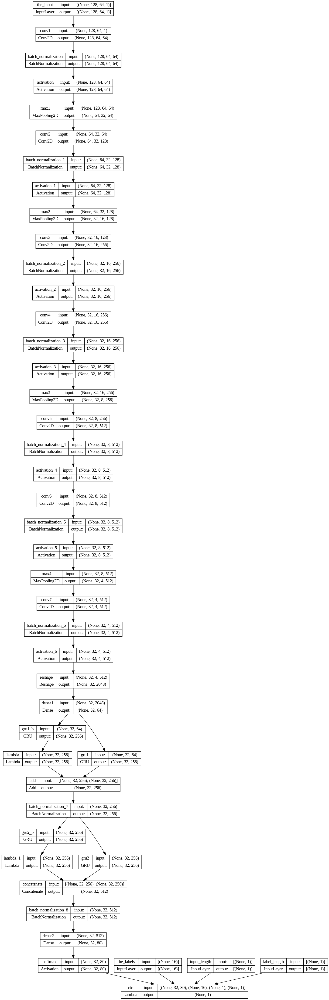

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

# **Text Recognition**

In [ ]:
!pip install pillow
!pip install path



In [ ]:
!pip install paddleocr

In [ ]:
!pip install paddlepaddle

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.9/125.9 MB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 6.9 MB/s eta 0:00:00


download https://paddleocr.bj.bcebos.com/PP-OCRv3/english/en_PP-OCRv3_det_infer.tar to /root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer/en_PP-OCRv3_det_infer.tar


100%|██████████| 4.00M/4.00M [00:08<00:00, 462kiB/s] 


download https://paddleocr.bj.bcebos.com/PP-OCRv4/english/en_PP-OCRv4_rec_infer.tar to /root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer/en_PP-OCRv4_rec_infer.tar


100%|██████████| 10.2M/10.2M [00:17<00:00, 587kiB/s] 


download https://paddleocr.bj.bcebos.com/dygraph_v2.0/ch/ch_ppocr_mobile_v2.0_cls_infer.tar to /root/.paddleocr/whl/cls/ch_ppocr_mobile_v2.0_cls_infer/ch_ppocr_mobile_v2.0_cls_infer.tar


100%|██████████| 2.19M/2.19M [00:14<00:00, 150kiB/s]

[2024/05/17 18:58:14] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=3.0, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

[2024/05/17 18:58:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.05802178382873535
[2024/05/17 18:58:16] ppocr DEBUG: cls num  : 1, elapsed : 0.03161334991455078
[2024/05/17 18:58:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.12775564193725586
Recognized text: ocasiovaly, Probability: 0.8858312368392944


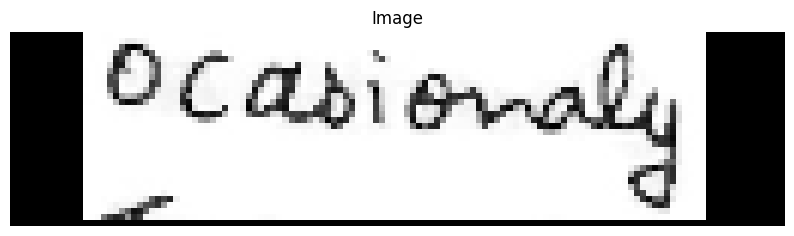

[2024/05/17 18:58:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018656492233276367
[2024/05/17 18:58:16] ppocr DEBUG: cls num  : 1, elapsed : 0.009747505187988281
[2024/05/17 18:58:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05148053169250488
Recognized text: off, Probability: 0.581295371055603


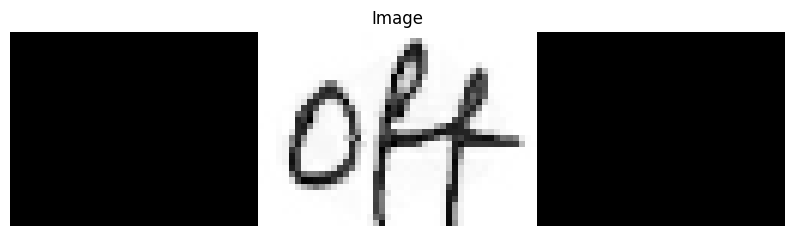

[2024/05/17 18:58:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01607680320739746
[2024/05/17 18:58:16] ppocr DEBUG: cls num  : 1, elapsed : 0.009485006332397461
[2024/05/17 18:58:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05517411231994629
Recognized text: JQpuo, Probability: 0.48689764738082886


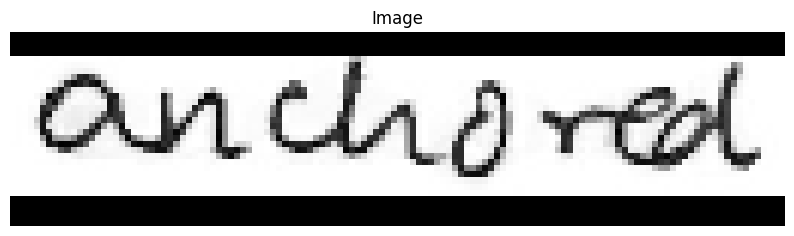

[2024/05/17 18:58:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027973651885986328
[2024/05/17 18:58:17] ppocr DEBUG: cls num  : 1, elapsed : 0.010957717895507812
[2024/05/17 18:58:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0544283390045166
Recognized text: avmIo, Probability: 0.42104530334472656


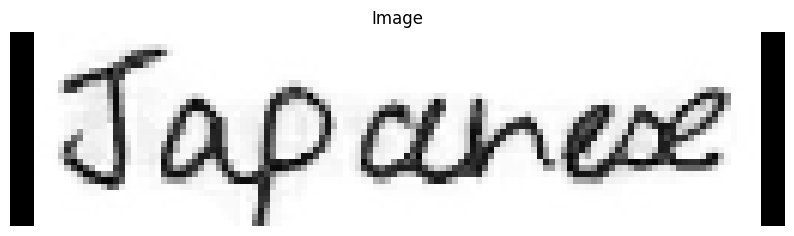

[2024/05/17 18:58:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02644634246826172
[2024/05/17 18:58:17] ppocr DEBUG: cls num  : 1, elapsed : 0.009233951568603516
[2024/05/17 18:58:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05519986152648926
Recognized text: Coste, Probability: 0.9317626953125


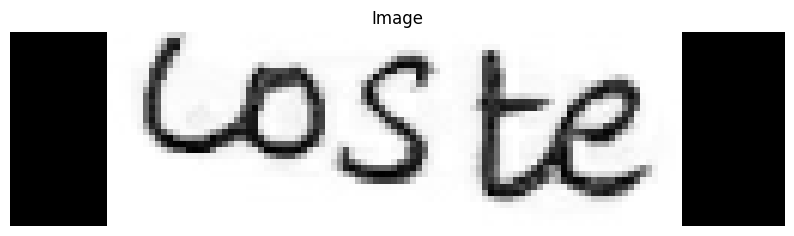

[2024/05/17 18:58:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0210111141204834
[2024/05/17 18:58:17] ppocr DEBUG: cls num  : 1, elapsed : 0.010201215744018555
[2024/05/17 18:58:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05981731414794922
Recognized text: te, Probability: 0.9102734327316284


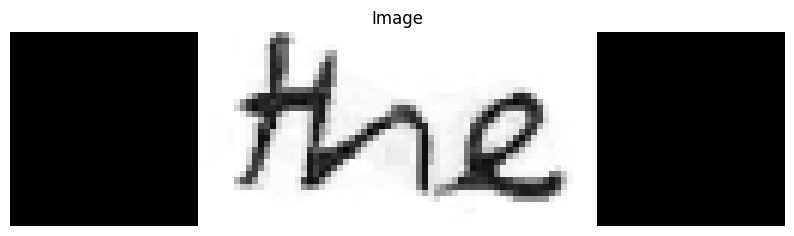

[2024/05/17 18:58:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026712656021118164
[2024/05/17 18:58:17] ppocr DEBUG: cls num  : 1, elapsed : 0.00977325439453125
[2024/05/17 18:58:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05396437644958496
Recognized text: rom, Probability: 0.8034533858299255


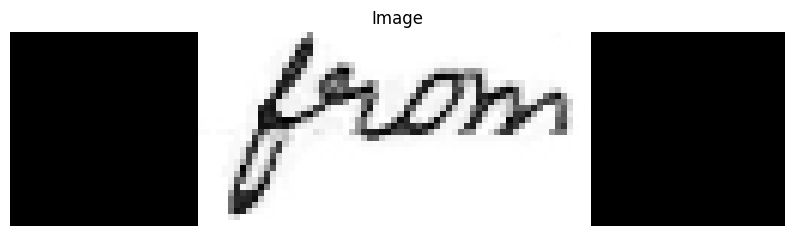

[2024/05/17 18:58:18] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028516769409179688
[2024/05/17 18:58:18] ppocr DEBUG: cls num  : 1, elapsed : 0.014754295349121094
[2024/05/17 18:58:18] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09775328636169434
Recognized text: fall, Probability: 0.9665813446044922


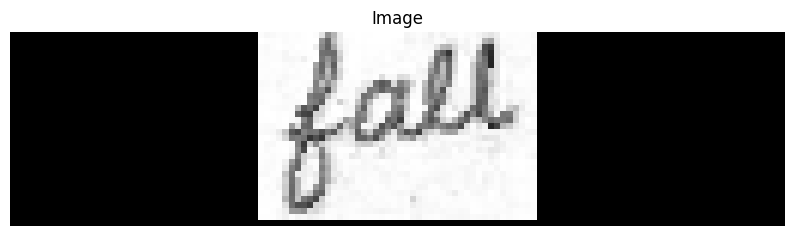

[2024/05/17 18:58:18] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01775217056274414
[2024/05/17 18:58:18] ppocr DEBUG: cls num  : 1, elapsed : 0.013731241226196289
[2024/05/17 18:58:18] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08518171310424805
Recognized text: onto, Probability: 0.8981579542160034


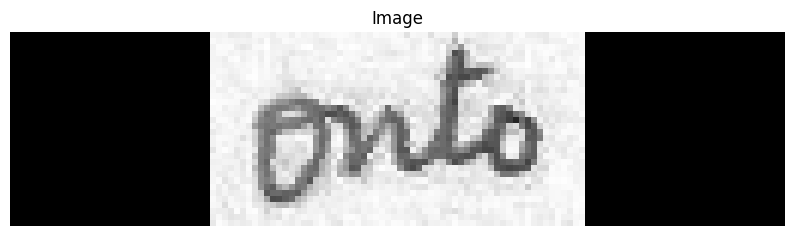

[2024/05/17 18:58:18] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023205280303955078
[2024/05/17 18:58:18] ppocr DEBUG: cls num  : 1, elapsed : 0.0168304443359375
[2024/05/17 18:58:18] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08326196670532227
Recognized text: face, Probability: 0.9830626249313354


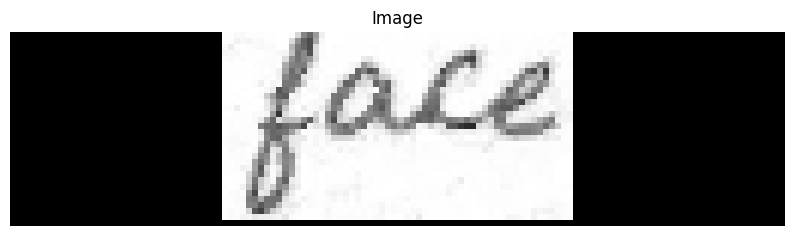

[2024/05/17 18:58:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02369832992553711
[2024/05/17 18:58:19] ppocr DEBUG: cls num  : 1, elapsed : 0.017105579376220703
[2024/05/17 18:58:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08575868606567383
Recognized text: the, Probability: 0.9945582747459412


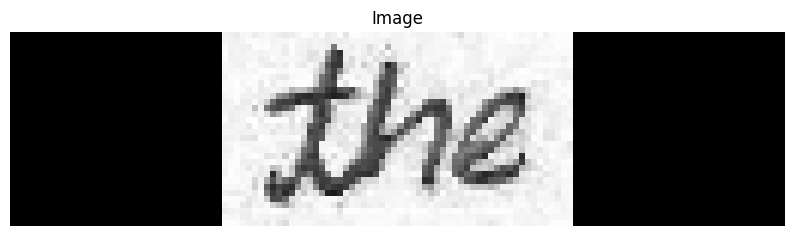

[2024/05/17 18:58:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01741957664489746
[2024/05/17 18:58:19] ppocr DEBUG: cls num  : 1, elapsed : 0.016030311584472656
[2024/05/17 18:58:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07490372657775879
Recognized text: Koncrit, Probability: 0.8430498838424683


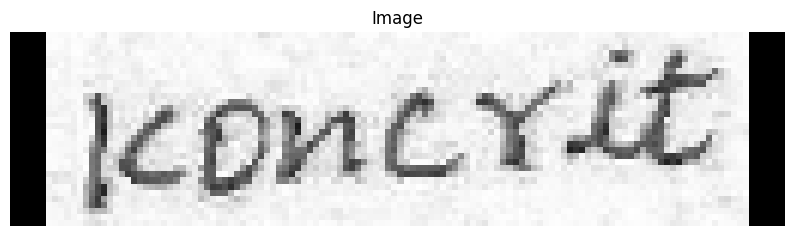

[2024/05/17 18:58:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018908977508544922
[2024/05/17 18:58:19] ppocr DEBUG: cls num  : 1, elapsed : 0.015233993530273438
[2024/05/17 18:58:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07880520820617676
Recognized text: I, Probability: 0.946185827255249


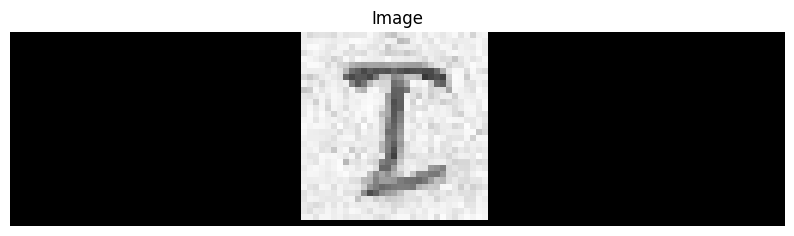

[2024/05/17 18:58:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027619123458862305
[2024/05/17 18:58:20] ppocr DEBUG: cls num  : 1, elapsed : 0.019070863723754883
[2024/05/17 18:58:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07984757423400879
Recognized text: carpet, Probability: 0.9106285572052002


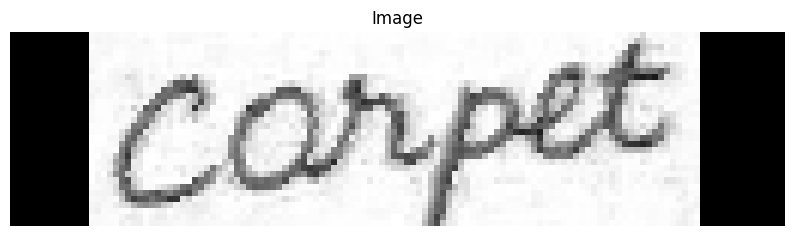

[2024/05/17 18:58:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03266263008117676
[2024/05/17 18:58:20] ppocr DEBUG: cls num  : 1, elapsed : 0.015942096710205078
[2024/05/17 18:58:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08410811424255371


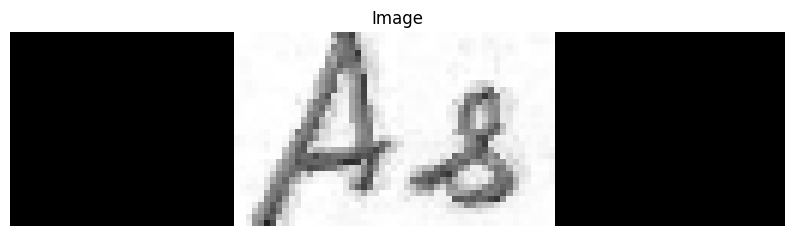

[2024/05/17 18:58:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021641969680786133
[2024/05/17 18:58:20] ppocr DEBUG: cls num  : 1, elapsed : 0.014082670211791992
[2024/05/17 18:58:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07935953140258789
Recognized text: me, Probability: 0.9973081946372986


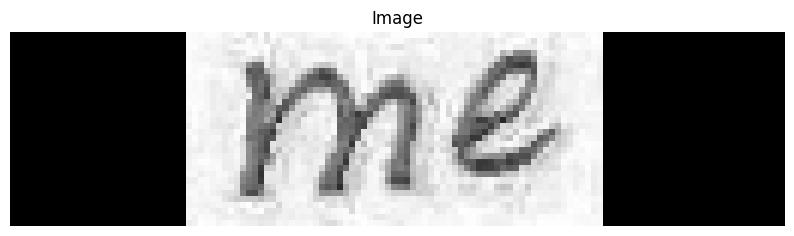

[2024/05/17 18:58:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020864009857177734
[2024/05/17 18:58:20] ppocr DEBUG: cls num  : 1, elapsed : 0.013141155242919922
[2024/05/17 18:58:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0784769058227539
Recognized text: nas, Probability: 0.4562428891658783


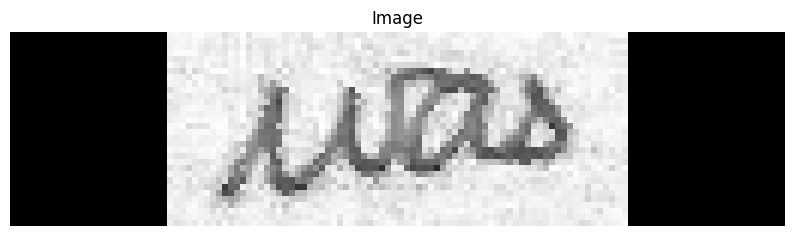

[2024/05/17 18:58:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029873371124267578
[2024/05/17 18:58:21] ppocr DEBUG: cls num  : 1, elapsed : 0.015564441680908203
[2024/05/17 18:58:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09532427787780762
Recognized text: consisucners, Probability: 0.9167425036430359


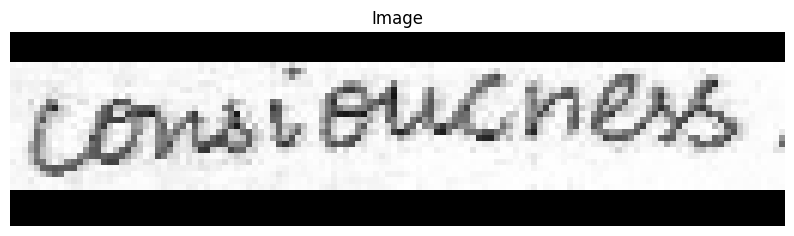

[2024/05/17 18:58:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02092909812927246
[2024/05/17 18:58:21] ppocr DEBUG: cls num  : 1, elapsed : 0.015725374221801758
[2024/05/17 18:58:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08077096939086914
Recognized text: the, Probability: 0.9931278228759766


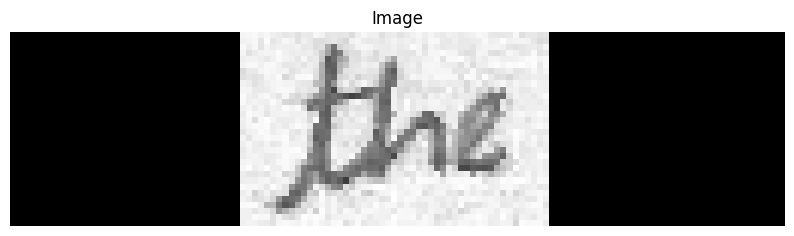

[2024/05/17 18:58:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023992300033569336
[2024/05/17 18:58:21] ppocr DEBUG: cls num  : 1, elapsed : 0.014535188674926758
[2024/05/17 18:58:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08719444274902344
Recognized text: gratbed, Probability: 0.8321202993392944


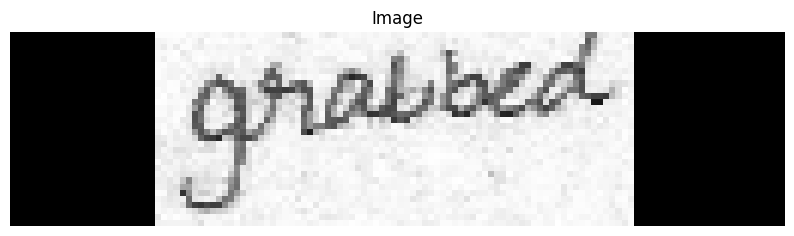

[2024/05/17 18:58:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027723073959350586
[2024/05/17 18:58:22] ppocr DEBUG: cls num  : 1, elapsed : 0.01913595199584961
[2024/05/17 18:58:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08200621604919434
Recognized text: farmer, Probability: 0.9147288799285889


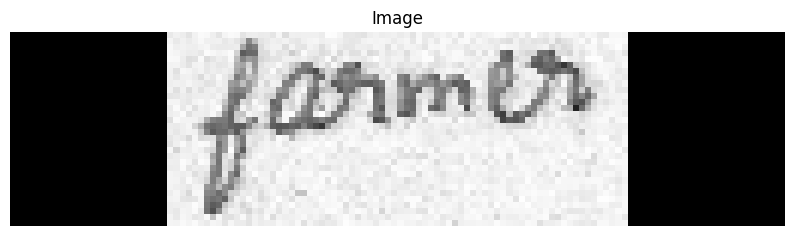

[2024/05/17 18:58:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01819014549255371
[2024/05/17 18:58:22] ppocr DEBUG: cls num  : 1, elapsed : 0.013678550720214844
[2024/05/17 18:58:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07989144325256348
Recognized text: drafting, Probability: 0.9124087691307068


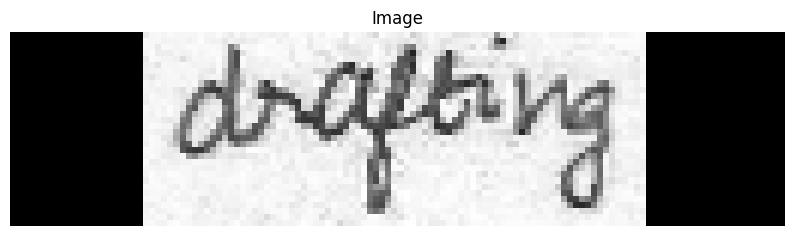

[2024/05/17 18:58:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017526865005493164
[2024/05/17 18:58:22] ppocr DEBUG: cls num  : 1, elapsed : 0.01220560073852539
[2024/05/17 18:58:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07851338386535645
Recognized text: out, Probability: 0.9500158429145813


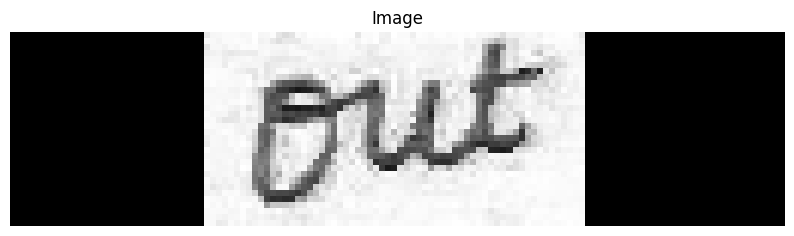

[2024/05/17 18:58:23] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.031592369079589844
[2024/05/17 18:58:23] ppocr DEBUG: cls num  : 1, elapsed : 0.02622056007385254
[2024/05/17 18:58:23] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08718490600585938


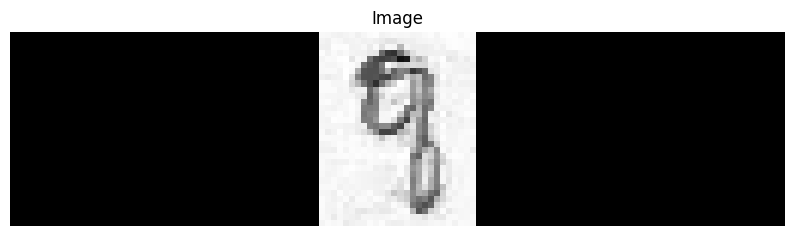

[2024/05/17 18:58:23] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024476289749145508
[2024/05/17 18:58:23] ppocr DEBUG: cls num  : 1, elapsed : 0.012690544128417969
[2024/05/17 18:58:23] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09952592849731445
Recognized text: toei, Probability: 0.9597797989845276


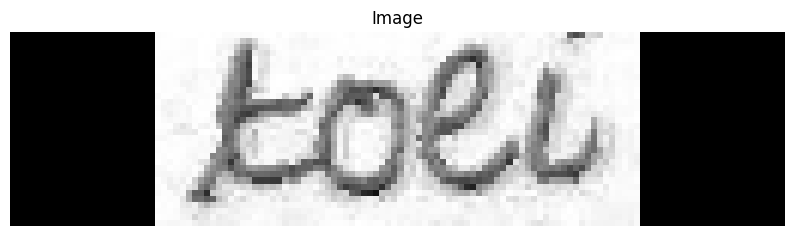

[2024/05/17 18:58:23] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.01999187469482422
[2024/05/17 18:58:23] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:23] ppocr DEBUG: rec_res num  : 0, elapsed : 5.0067901611328125e-06


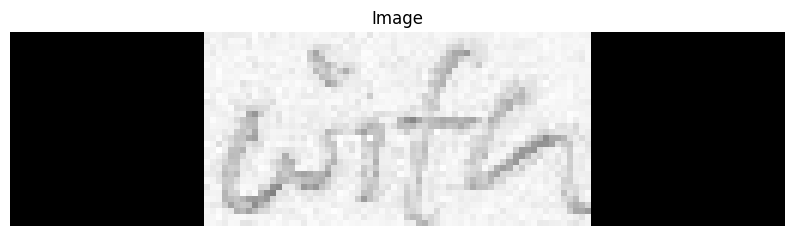

[2024/05/17 18:58:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03297877311706543
[2024/05/17 18:58:24] ppocr DEBUG: cls num  : 1, elapsed : 0.021363258361816406
[2024/05/17 18:58:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09179902076721191


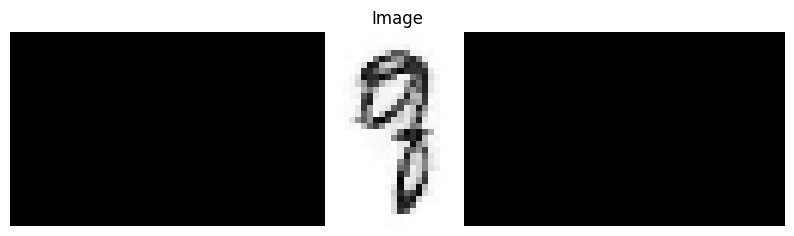

[2024/05/17 18:58:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018957138061523438
[2024/05/17 18:58:24] ppocr DEBUG: cls num  : 1, elapsed : 0.020845890045166016
[2024/05/17 18:58:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08895301818847656
Recognized text: armi, Probability: 0.8120956420898438


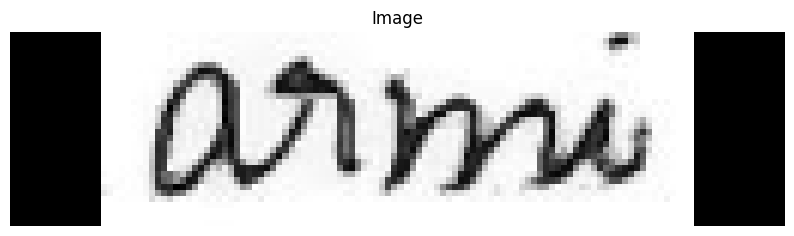

[2024/05/17 18:58:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018340349197387695
[2024/05/17 18:58:24] ppocr DEBUG: cls num  : 1, elapsed : 0.014209270477294922
[2024/05/17 18:58:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.058928728103637695
Recognized text: Or, Probability: 0.420101523399353


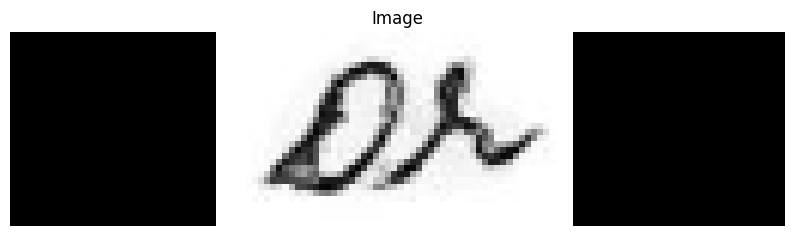

[2024/05/17 18:58:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022459983825683594
[2024/05/17 18:58:25] ppocr DEBUG: cls num  : 1, elapsed : 0.013588666915893555
[2024/05/17 18:58:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.056298017501831055
Recognized text: Samurai, Probability: 0.7933371663093567


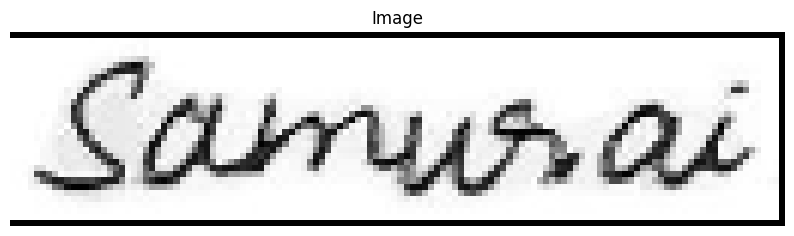

[2024/05/17 18:58:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02664947509765625
[2024/05/17 18:58:25] ppocr DEBUG: cls num  : 1, elapsed : 0.015225648880004883
[2024/05/17 18:58:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.054648399353027344
Recognized text: norem ent, Probability: 0.7702019214630127


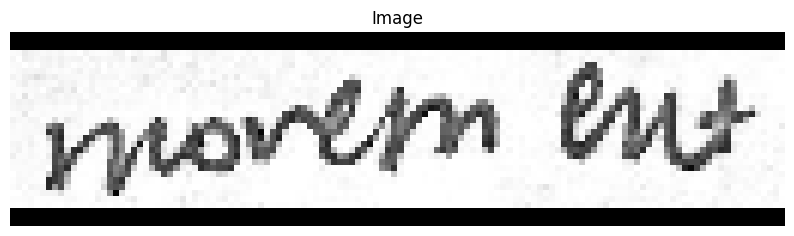

[2024/05/17 18:58:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027172565460205078
[2024/05/17 18:58:25] ppocr DEBUG: cls num  : 1, elapsed : 0.012806892395019531
[2024/05/17 18:58:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05350947380065918
Recognized text: warriors, Probability: 0.8687547445297241


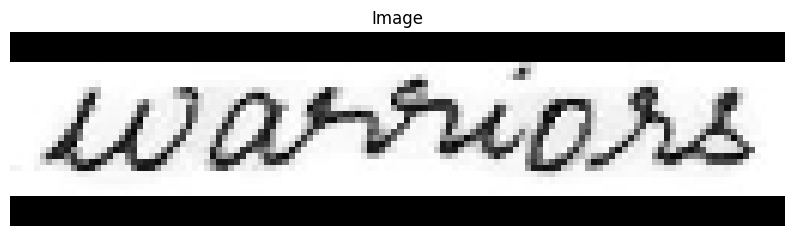

[2024/05/17 18:58:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029618501663208008
[2024/05/17 18:58:25] ppocr DEBUG: cls num  : 1, elapsed : 0.0174105167388916
[2024/05/17 18:58:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05566740036010742
Recognized text: in, Probability: 0.7787920832633972


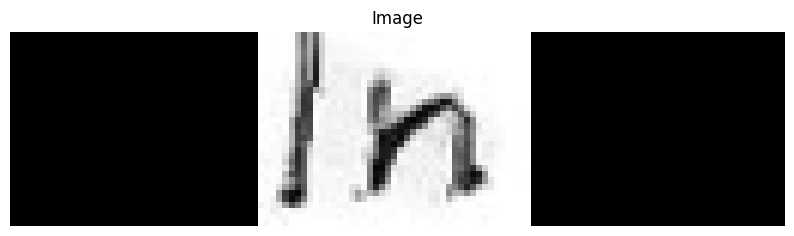

[2024/05/17 18:58:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024753808975219727
[2024/05/17 18:58:25] ppocr DEBUG: cls num  : 1, elapsed : 0.01323843002319336
[2024/05/17 18:58:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05403256416320801
Recognized text: the, Probability: 0.993565559387207


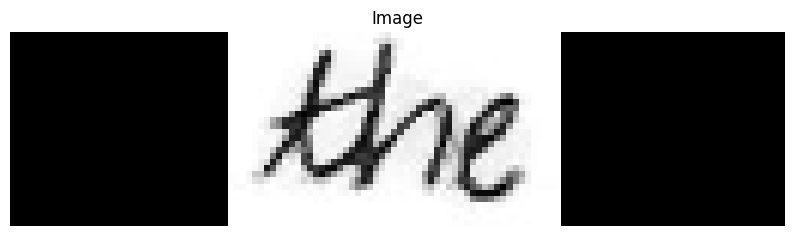

[2024/05/17 18:58:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028307437896728516
[2024/05/17 18:58:26] ppocr DEBUG: cls num  : 1, elapsed : 0.014794111251831055
[2024/05/17 18:58:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.057089805603027344
Recognized text: seventint, Probability: 0.8661549687385559


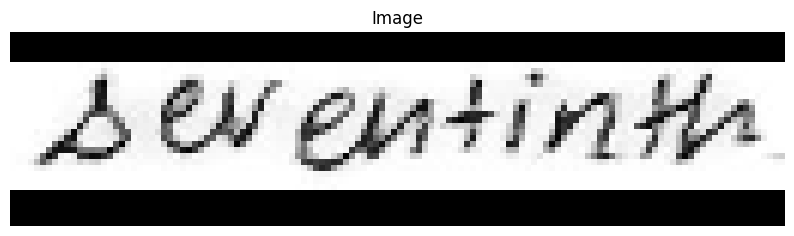

[2024/05/17 18:58:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020493030548095703
[2024/05/17 18:58:26] ppocr DEBUG: cls num  : 1, elapsed : 0.01290273666381836
[2024/05/17 18:58:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05665230751037598
Recognized text: dosed, Probability: 0.9230645895004272


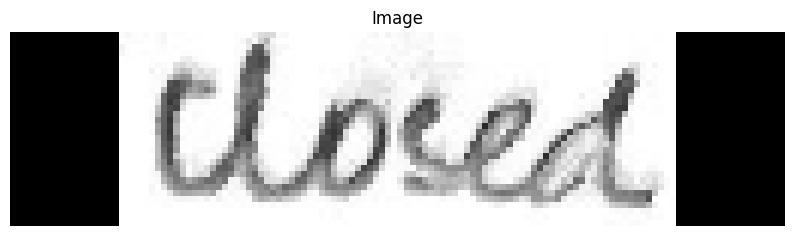

[2024/05/17 18:58:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02938699722290039
[2024/05/17 18:58:26] ppocr DEBUG: cls num  : 1, elapsed : 0.012780904769897461
[2024/05/17 18:58:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06819319725036621
Recognized text: itsey, Probability: 0.8840522766113281


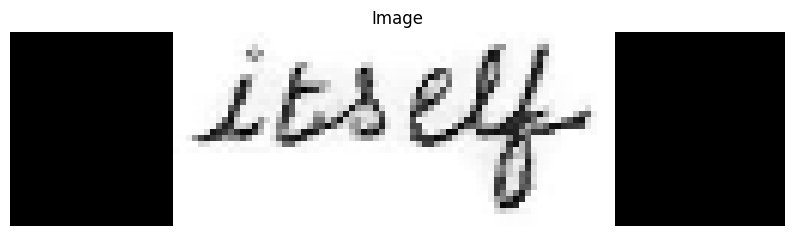

[2024/05/17 18:58:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02118372917175293
[2024/05/17 18:58:26] ppocr DEBUG: cls num  : 1, elapsed : 0.01294565200805664
[2024/05/17 18:58:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.057503700256347656
Recognized text: had, Probability: 0.98492032289505


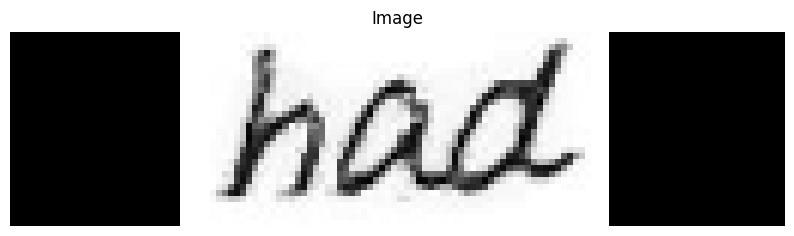

[2024/05/17 18:58:27] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021787643432617188
[2024/05/17 18:58:27] ppocr DEBUG: cls num  : 1, elapsed : 0.013592958450317383
[2024/05/17 18:58:27] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06113719940185547
Recognized text: Bentory,, Probability: 0.9436894655227661


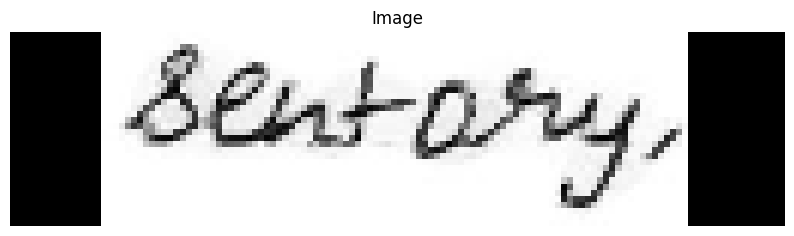

[2024/05/17 18:58:27] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.02484583854675293
[2024/05/17 18:58:27] ppocr DEBUG: cls num  : 2, elapsed : 0.036319732666015625
[2024/05/17 18:58:27] ppocr DEBUG: rec_res num  : 2, elapsed : 0.1503157615661621
Recognized text: ecrly, Probability: 0.9451325535774231


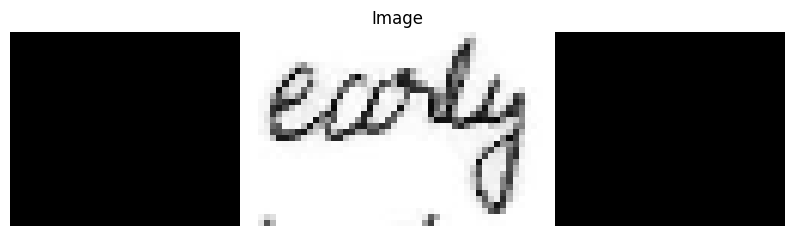

[2024/05/17 18:58:27] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02713632583618164
[2024/05/17 18:58:27] ppocr DEBUG: cls num  : 1, elapsed : 0.015050649642944336
[2024/05/17 18:58:27] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05492258071899414
Recognized text: Japar, Probability: 0.9307569265365601


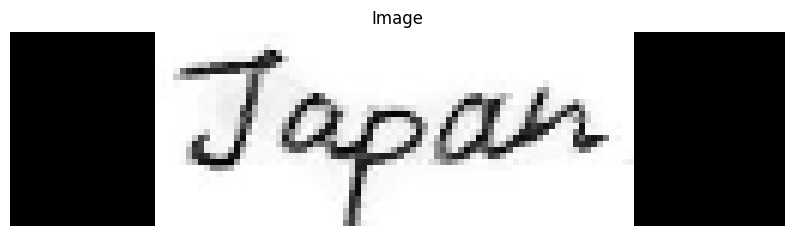

[2024/05/17 18:58:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02056264877319336
[2024/05/17 18:58:28] ppocr DEBUG: cls num  : 1, elapsed : 0.011052608489990234
[2024/05/17 18:58:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06459379196166992
Recognized text: shut, Probability: 0.8184937238693237


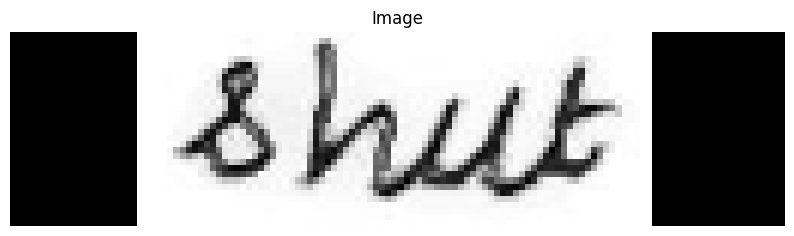

[2024/05/17 18:58:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017868995666503906
[2024/05/17 18:58:28] ppocr DEBUG: cls num  : 1, elapsed : 0.013569355010986328
[2024/05/17 18:58:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05867481231689453
Recognized text: b, Probability: 0.4970782995223999


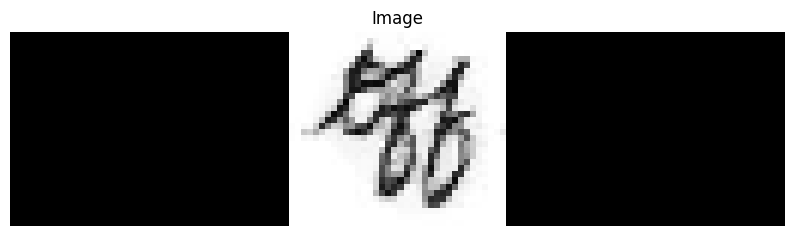

[2024/05/17 18:58:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02891993522644043
[2024/05/17 18:58:28] ppocr DEBUG: cls num  : 1, elapsed : 0.012897491455078125
[2024/05/17 18:58:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0569453239440918
Recognized text: obits, Probability: 0.8334106206893921


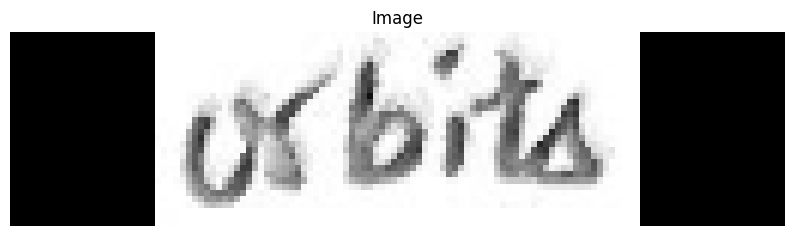

[2024/05/17 18:58:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.030877351760864258
[2024/05/17 18:58:28] ppocr DEBUG: cls num  : 1, elapsed : 0.013637065887451172
[2024/05/17 18:58:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06205129623413086
Recognized text: e-, Probability: 0.7498663663864136


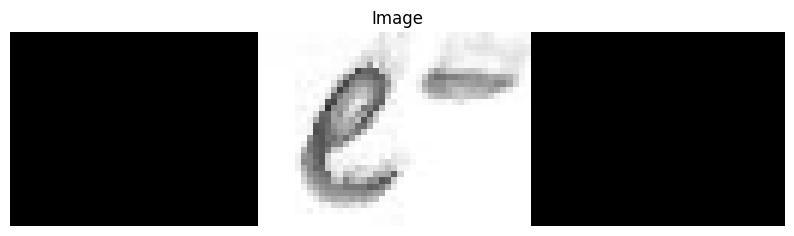

[2024/05/17 18:58:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017696857452392578
[2024/05/17 18:58:29] ppocr DEBUG: cls num  : 1, elapsed : 0.020809173583984375
[2024/05/17 18:58:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06037569046020508
Recognized text: from, Probability: 0.9789890646934509


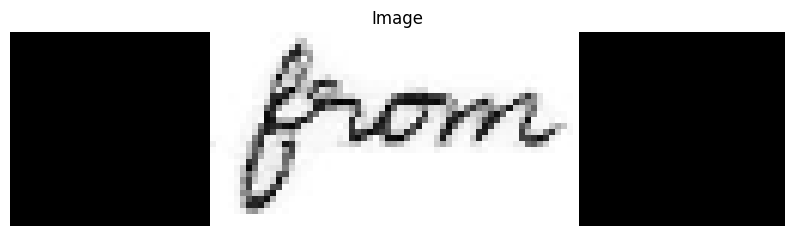

[2024/05/17 18:58:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024010181427001953
[2024/05/17 18:58:29] ppocr DEBUG: cls num  : 1, elapsed : 0.012861251831054688
[2024/05/17 18:58:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05609011650085449
Recognized text: fhe, Probability: 0.8492863178253174


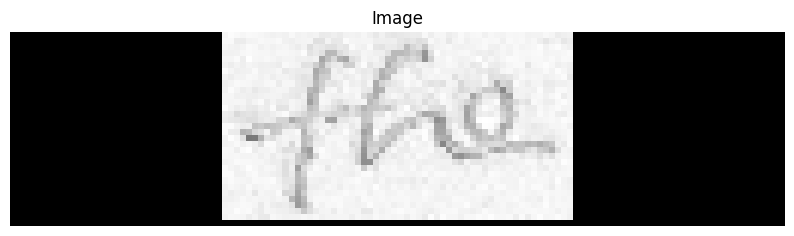

[2024/05/17 18:58:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02055191993713379
[2024/05/17 18:58:29] ppocr DEBUG: cls num  : 1, elapsed : 0.011022090911865234
[2024/05/17 18:58:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05544853210449219
Recognized text: What, Probability: 0.9769562482833862


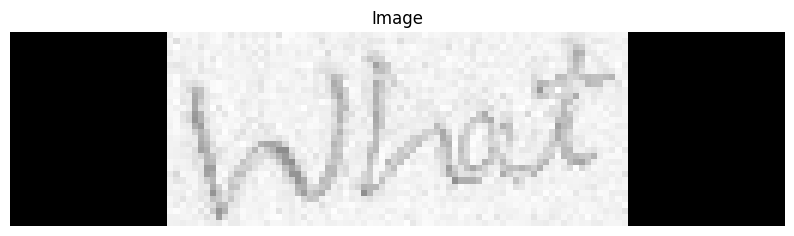

[2024/05/17 18:58:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03046727180480957
[2024/05/17 18:58:29] ppocr DEBUG: cls num  : 1, elapsed : 0.014600753784179688
[2024/05/17 18:58:29] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07099461555480957
Recognized text: wes, Probability: 0.555795431137085


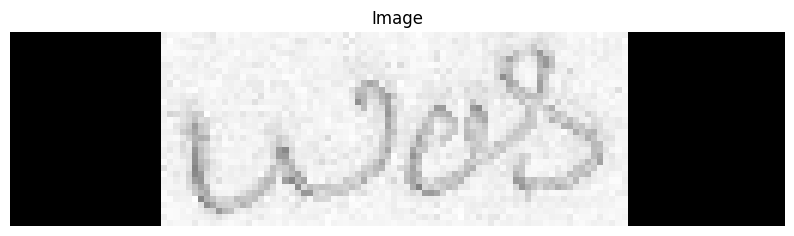

[2024/05/17 18:58:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03424859046936035
[2024/05/17 18:58:30] ppocr DEBUG: cls num  : 1, elapsed : 0.014211654663085938
[2024/05/17 18:58:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05832934379577637
Recognized text: mders, Probability: 0.5975029468536377


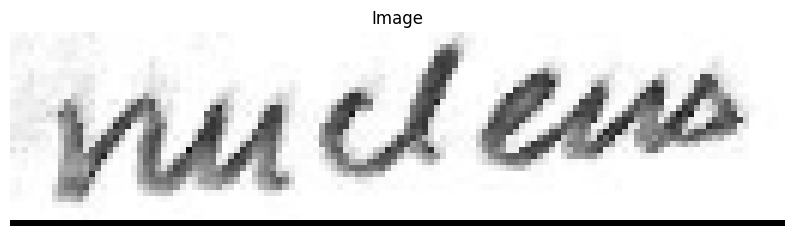

[2024/05/17 18:58:30] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.023308753967285156
[2024/05/17 18:58:30] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:30] ppocr DEBUG: rec_res num  : 0, elapsed : 2.6226043701171875e-06


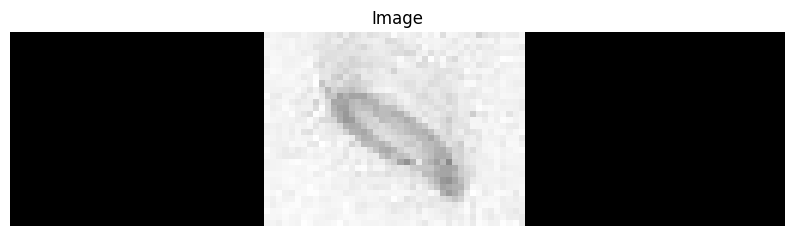

[2024/05/17 18:58:30] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.023560523986816406
[2024/05/17 18:58:30] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:30] ppocr DEBUG: rec_res num  : 0, elapsed : 4.5299530029296875e-06


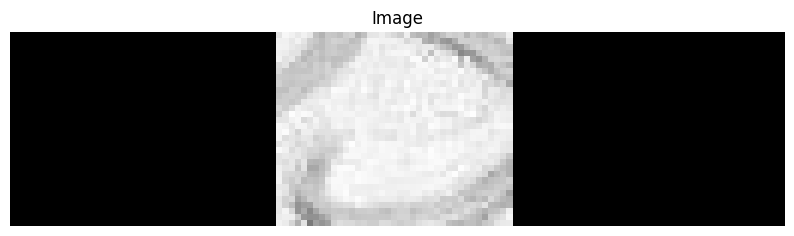

[2024/05/17 18:58:30] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02312302589416504
[2024/05/17 18:58:30] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:30] ppocr DEBUG: rec_res num  : 0, elapsed : 4.5299530029296875e-06


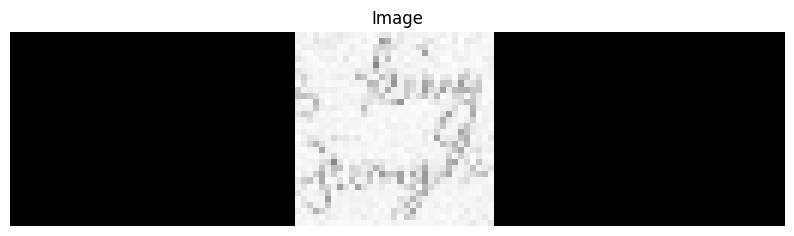

[2024/05/17 18:58:30] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.01640009880065918
[2024/05/17 18:58:30] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:30] ppocr DEBUG: rec_res num  : 0, elapsed : 4.291534423828125e-06


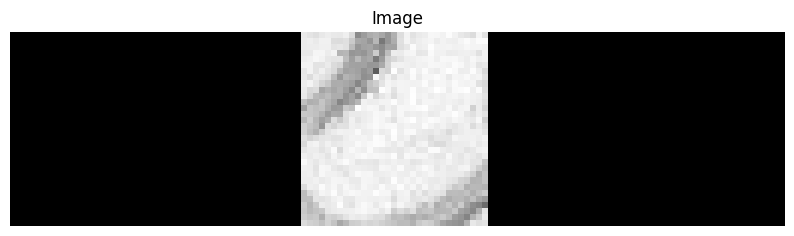

[2024/05/17 18:58:30] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.016014814376831055
[2024/05/17 18:58:30] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:30] ppocr DEBUG: rec_res num  : 0, elapsed : 3.0994415283203125e-06


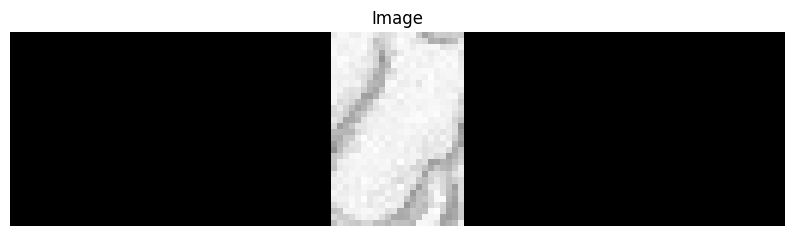

[2024/05/17 18:58:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.03180122375488281
[2024/05/17 18:58:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:31] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


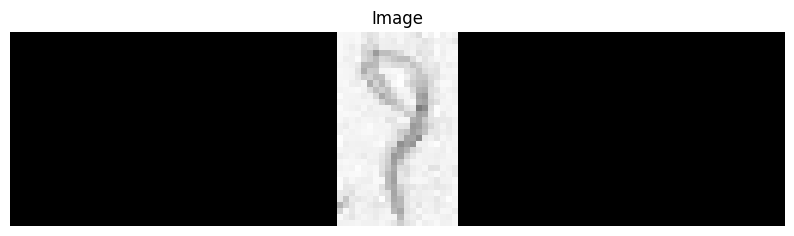

[2024/05/17 18:58:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02442026138305664
[2024/05/17 18:58:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:31] ppocr DEBUG: rec_res num  : 0, elapsed : 3.0994415283203125e-06


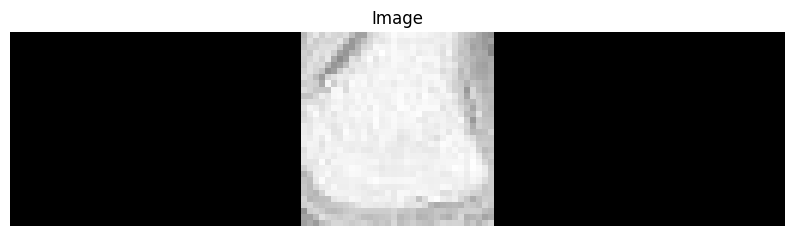

[2024/05/17 18:58:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02934098243713379
[2024/05/17 18:58:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:31] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


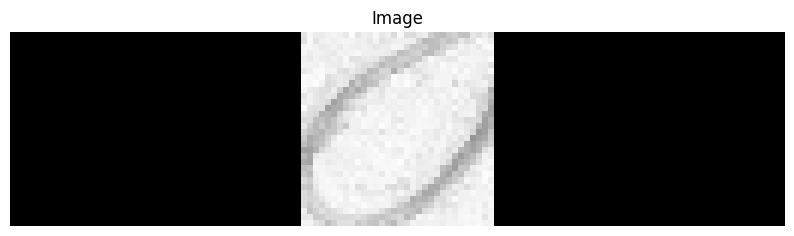

[2024/05/17 18:58:31] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.017999649047851562
[2024/05/17 18:58:31] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:31] ppocr DEBUG: rec_res num  : 0, elapsed : 3.814697265625e-06


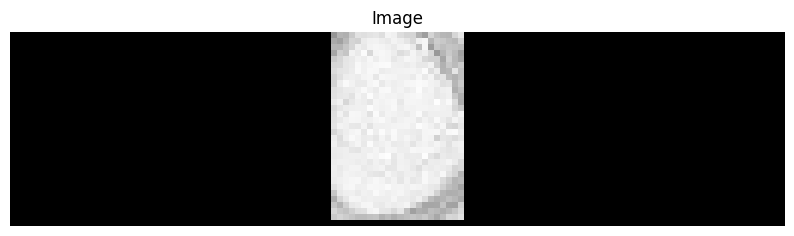

[2024/05/17 18:58:31] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027568340301513672
[2024/05/17 18:58:31] ppocr DEBUG: cls num  : 1, elapsed : 0.013382434844970703
[2024/05/17 18:58:31] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05948042869567871
Recognized text: olnost, Probability: 0.7250149250030518


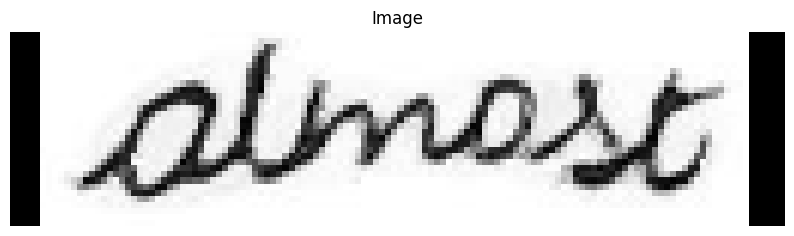

[2024/05/17 18:58:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017816543579101562
[2024/05/17 18:58:32] ppocr DEBUG: cls num  : 1, elapsed : 0.013512849807739258
[2024/05/17 18:58:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.061493635177612305
Recognized text: dorrg, Probability: 0.879703164100647


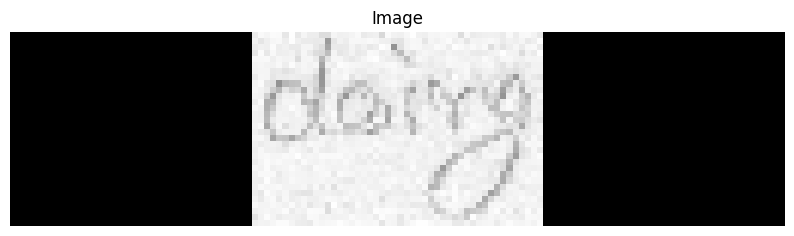

[2024/05/17 18:58:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01987934112548828
[2024/05/17 18:58:32] ppocr DEBUG: cls num  : 1, elapsed : 0.017729997634887695
[2024/05/17 18:58:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06930208206176758
Recognized text: eull, Probability: 0.7468072175979614


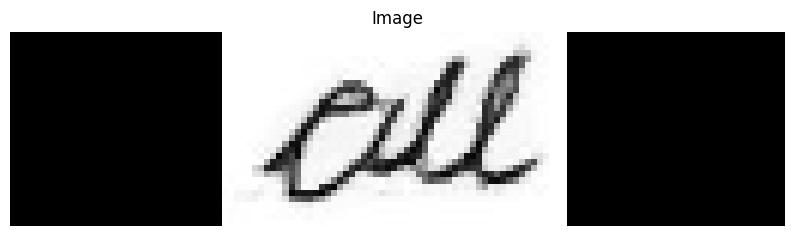

[2024/05/17 18:58:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017571449279785156
[2024/05/17 18:58:32] ppocr DEBUG: cls num  : 1, elapsed : 0.01497197151184082
[2024/05/17 18:58:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06306576728820801
Recognized text: momoy, Probability: 0.7178694605827332


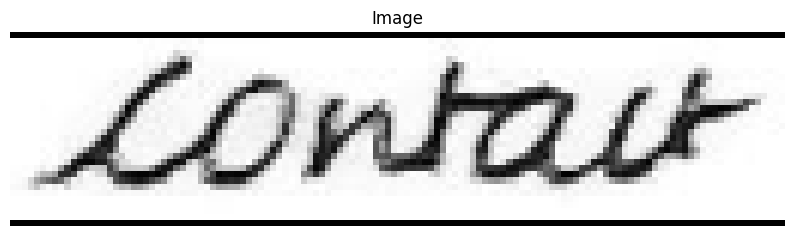

[2024/05/17 18:58:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02279973030090332
[2024/05/17 18:58:32] ppocr DEBUG: cls num  : 1, elapsed : 0.01506805419921875
[2024/05/17 18:58:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06491804122924805
Recognized text: wit, Probability: 0.8605747222900391


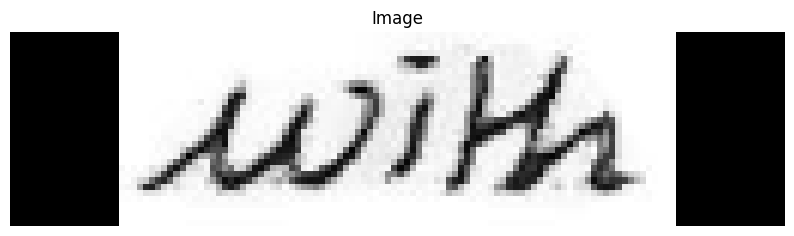

[2024/05/17 18:58:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026441574096679688
[2024/05/17 18:58:33] ppocr DEBUG: cls num  : 1, elapsed : 0.01954960823059082
[2024/05/17 18:58:33] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0651540756225586
Recognized text: Dthgs, Probability: 0.5487008094787598


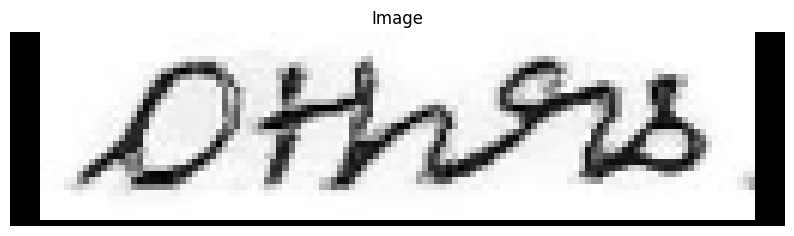

[2024/05/17 18:58:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01801013946533203
[2024/05/17 18:58:33] ppocr DEBUG: cls num  : 1, elapsed : 0.014713287353515625
[2024/05/17 18:58:33] ppocr DEBUG: rec_res num  : 1, elapsed : 0.05993080139160156
Recognized text: o, Probability: 0.38087135553359985


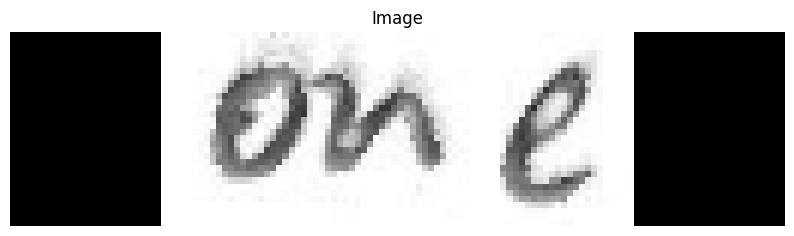

[2024/05/17 18:58:33] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.01674365997314453
[2024/05/17 18:58:33] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:33] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


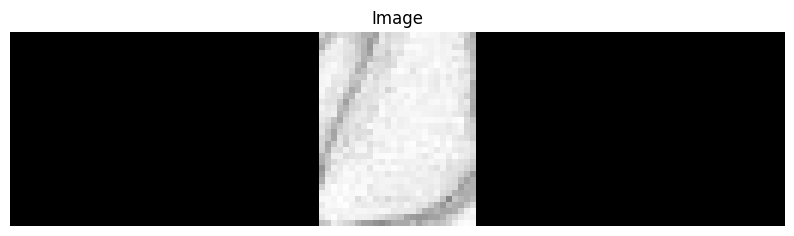

[2024/05/17 18:58:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0178067684173584
[2024/05/17 18:58:33] ppocr DEBUG: cls num  : 1, elapsed : 0.014721393585205078
[2024/05/17 18:58:33] ppocr DEBUG: rec_res num  : 1, elapsed : 0.059129953384399414
Recognized text: ot, Probability: 0.3433443307876587


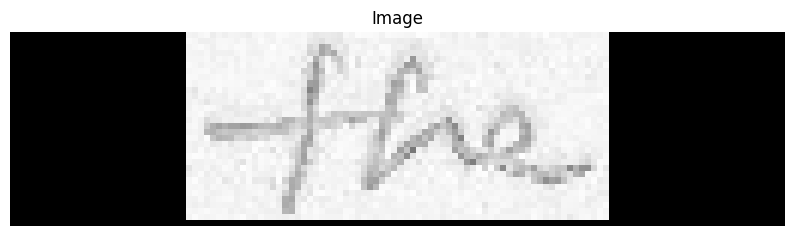

[2024/05/17 18:58:33] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.014402389526367188
[2024/05/17 18:58:33] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:33] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


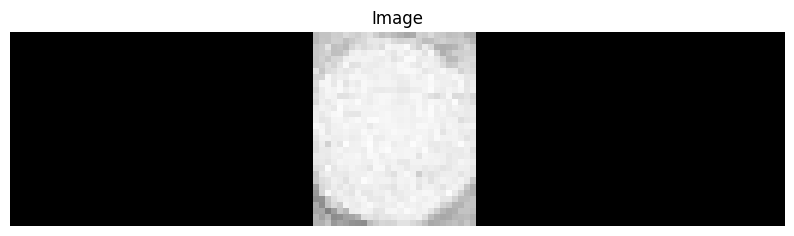

[2024/05/17 18:58:34] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01983642578125
[2024/05/17 18:58:34] ppocr DEBUG: cls num  : 1, elapsed : 0.031435251235961914
[2024/05/17 18:58:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06876659393310547
Recognized text: Bosrest, Probability: 0.3727891445159912


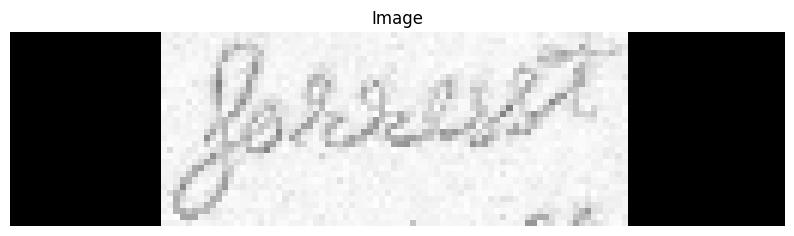

[2024/05/17 18:58:34] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02264881134033203
[2024/05/17 18:58:34] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:34] ppocr DEBUG: rec_res num  : 0, elapsed : 2.86102294921875e-06


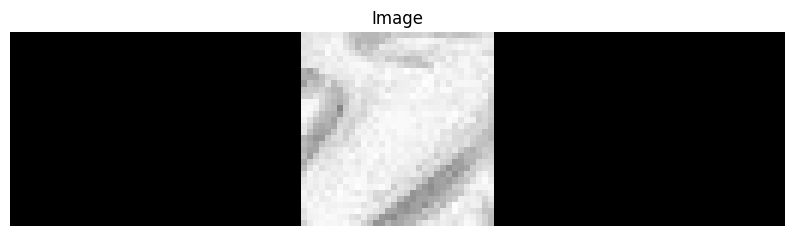

[2024/05/17 18:58:34] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02486419677734375
[2024/05/17 18:58:34] ppocr DEBUG: cls num  : 1, elapsed : 0.01638627052307129
[2024/05/17 18:58:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06387710571289062
Recognized text: Under, Probability: 0.8957193493843079


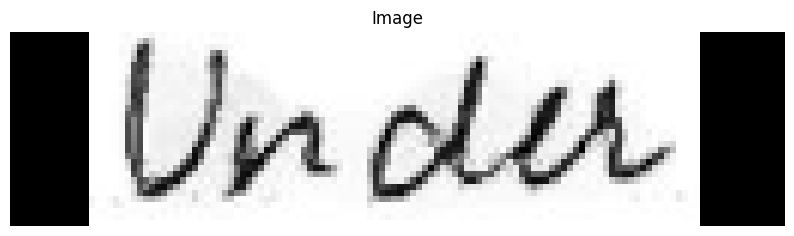

[2024/05/17 18:58:34] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.032952070236206055
[2024/05/17 18:58:34] ppocr DEBUG: cls num  : 1, elapsed : 0.028628110885620117
[2024/05/17 18:58:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0834188461303711
Recognized text: the, Probability: 0.9923257827758789


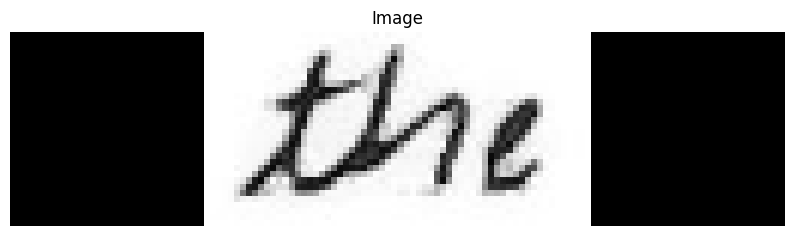

[2024/05/17 18:58:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02127981185913086
[2024/05/17 18:58:35] ppocr DEBUG: cls num  : 1, elapsed : 0.017876863479614258
[2024/05/17 18:58:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08195781707763672
Recognized text: Shoguns, Probability: 0.9635581970214844


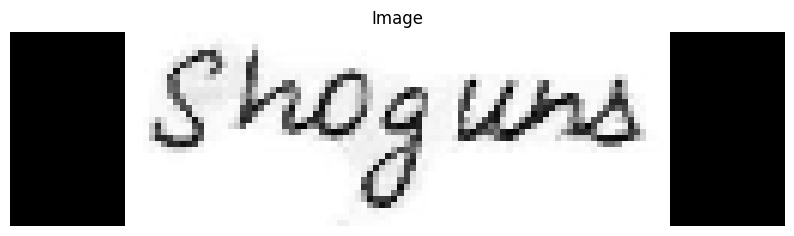

[2024/05/17 18:58:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03439497947692871
[2024/05/17 18:58:35] ppocr DEBUG: cls num  : 1, elapsed : 0.029211997985839844
[2024/05/17 18:58:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09502649307250977
Recognized text: sule, Probability: 0.8547800183296204


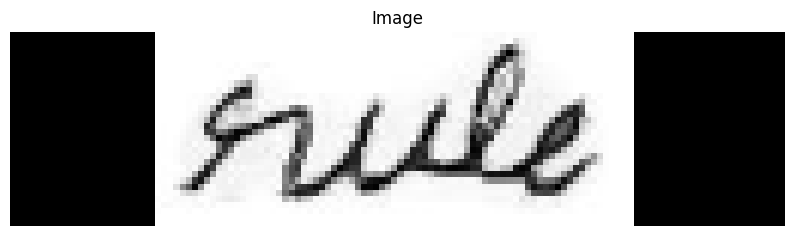

[2024/05/17 18:58:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021215438842773438
[2024/05/17 18:58:35] ppocr DEBUG: cls num  : 1, elapsed : 0.015010356903076172
[2024/05/17 18:58:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09847569465637207


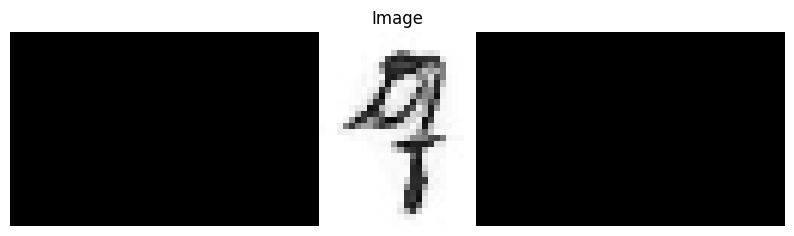

[2024/05/17 18:58:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02026820182800293
[2024/05/17 18:58:36] ppocr DEBUG: cls num  : 1, elapsed : 0.01799750328063965
[2024/05/17 18:58:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10304641723632812
Recognized text: Japanese, Probability: 0.8859736919403076


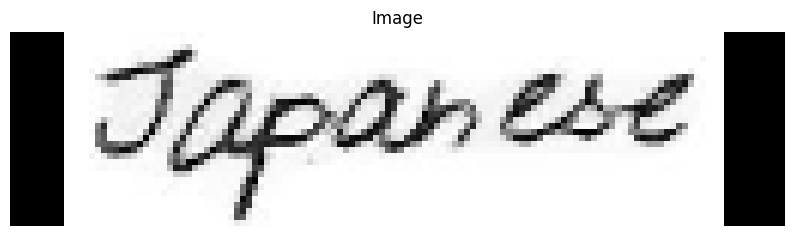

[2024/05/17 18:58:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03522181510925293
[2024/05/17 18:58:36] ppocr DEBUG: cls num  : 1, elapsed : 0.022034645080566406
[2024/05/17 18:58:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10779976844787598


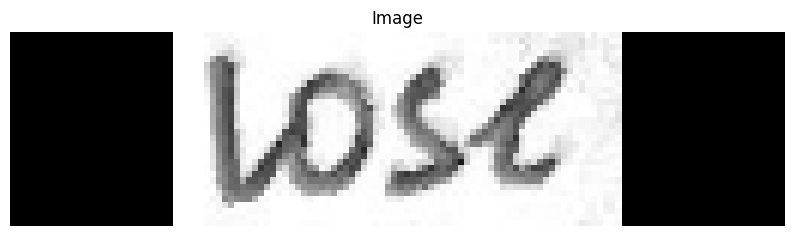

[2024/05/17 18:58:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027547121047973633
[2024/05/17 18:58:36] ppocr DEBUG: cls num  : 1, elapsed : 0.01258540153503418
[2024/05/17 18:58:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09202194213867188
Recognized text: wold, Probability: 0.804922342300415


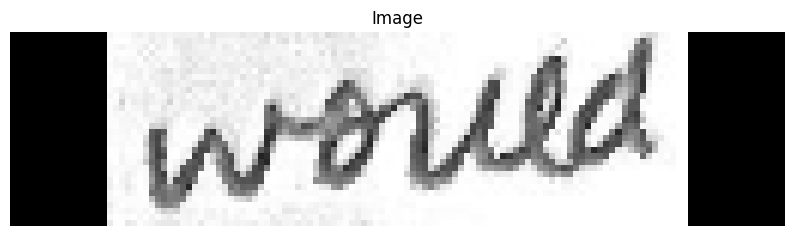

[2024/05/17 18:58:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022907257080078125
[2024/05/17 18:58:37] ppocr DEBUG: cls num  : 1, elapsed : 0.012757539749145508
[2024/05/17 18:58:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09936261177062988
Recognized text: all, Probability: 0.5100144743919373


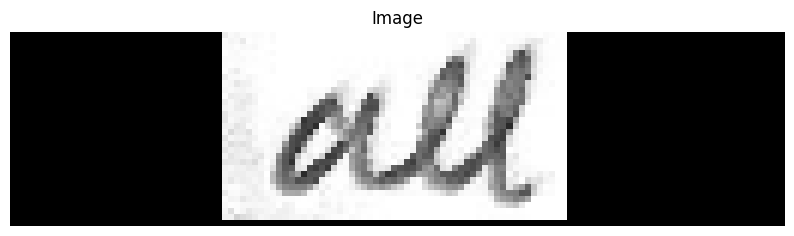

[2024/05/17 18:58:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019761085510253906
[2024/05/17 18:58:37] ppocr DEBUG: cls num  : 1, elapsed : 0.025390625
[2024/05/17 18:58:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08235430717468262
Recognized text: an, Probability: 0.7107892036437988


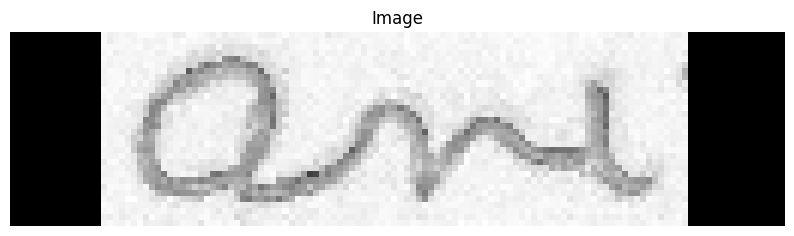

[2024/05/17 18:58:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017004728317260742
[2024/05/17 18:58:37] ppocr DEBUG: cls num  : 1, elapsed : 0.013641357421875
[2024/05/17 18:58:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07940459251403809


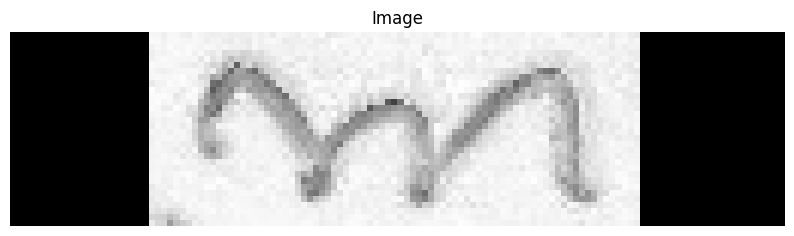

[2024/05/17 18:58:38] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.017876148223876953
[2024/05/17 18:58:38] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:38] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


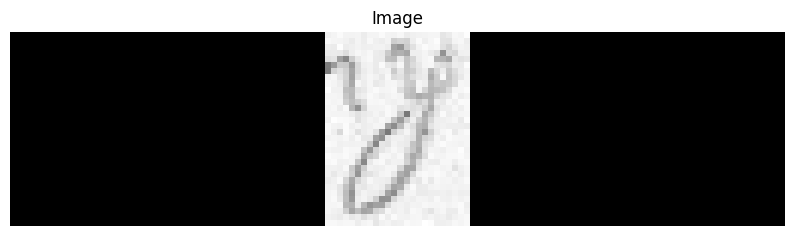

[2024/05/17 18:58:38] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02519369125366211
[2024/05/17 18:58:38] ppocr DEBUG: cls num  : 1, elapsed : 0.02123236656188965
[2024/05/17 18:58:38] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0947866439819336
Recognized text: nall, Probability: 0.6546194553375244


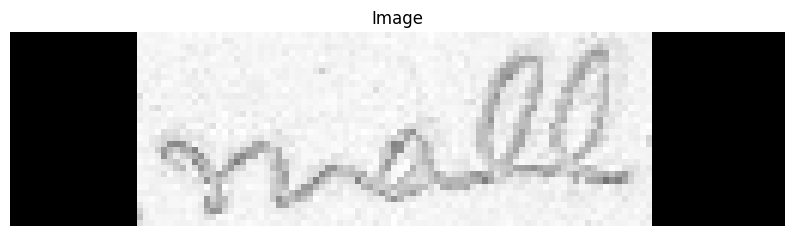

[2024/05/17 18:58:38] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.017301082611083984
[2024/05/17 18:58:38] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:38] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


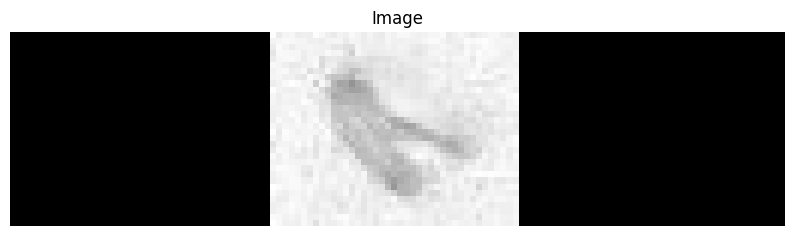

[2024/05/17 18:58:38] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.018703460693359375
[2024/05/17 18:58:38] ppocr DEBUG: cls num  : 2, elapsed : 0.017084598541259766
[2024/05/17 18:58:39] ppocr DEBUG: rec_res num  : 2, elapsed : 0.13929176330566406
Recognized text: soceity, Probability: 0.9752693772315979
Recognized text: a, Probability: 0.3216395080089569


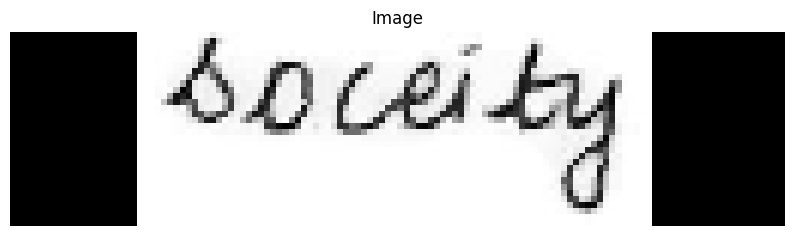

[2024/05/17 18:58:39] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02264690399169922
[2024/05/17 18:58:39] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:39] ppocr DEBUG: rec_res num  : 0, elapsed : 3.5762786865234375e-06


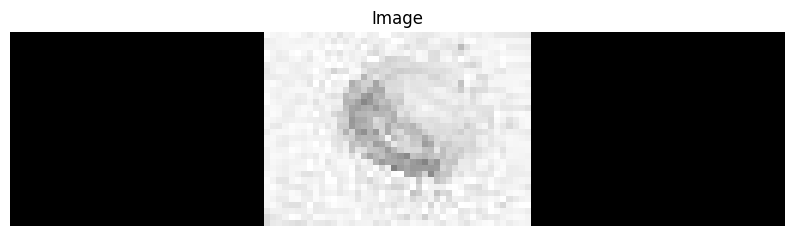

[2024/05/17 18:58:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02072763442993164
[2024/05/17 18:58:39] ppocr DEBUG: cls num  : 1, elapsed : 0.013162612915039062
[2024/05/17 18:58:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07827496528625488
Recognized text: rary, Probability: 0.4025101363658905


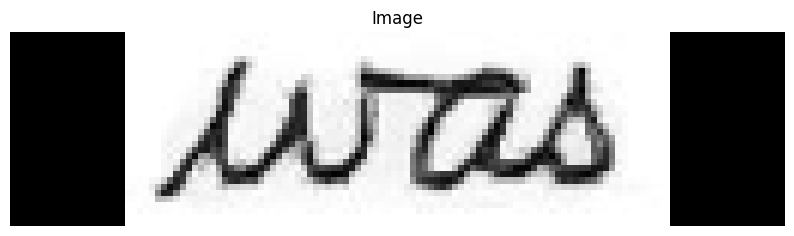

[2024/05/17 18:58:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027617931365966797
[2024/05/17 18:58:39] ppocr DEBUG: cls num  : 1, elapsed : 0.016409873962402344
[2024/05/17 18:58:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0935664176940918
Recognized text: ardered, Probability: 0.846158504486084


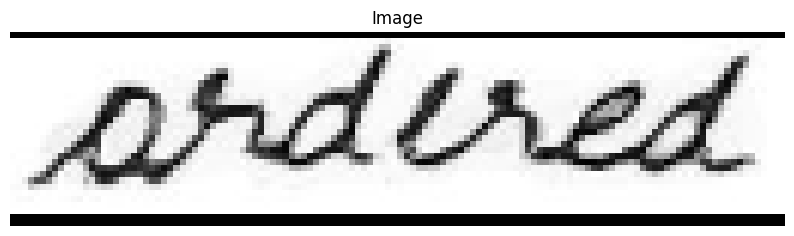

[2024/05/17 18:58:40] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.02991199493408203
[2024/05/17 18:58:40] ppocr DEBUG: cls num  : 2, elapsed : 0.02410268783569336
[2024/05/17 18:58:40] ppocr DEBUG: rec_res num  : 2, elapsed : 0.13691949844360352
Recognized text: vtry, Probability: 0.7372739315032959
Recognized text: d, Probability: 0.30957138538360596


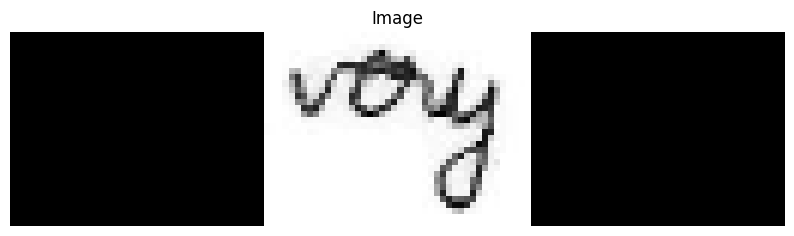

[2024/05/17 18:58:40] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.02090764045715332
[2024/05/17 18:58:40] ppocr DEBUG: cls num  : 2, elapsed : 0.01872992515563965
[2024/05/17 18:58:40] ppocr DEBUG: rec_res num  : 2, elapsed : 0.13299250602722168
Recognized text: tightly, Probability: 0.9604464173316956


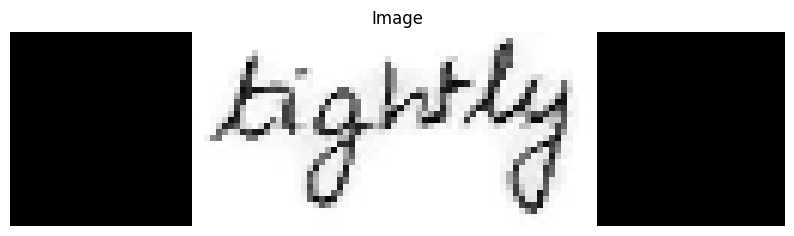

[2024/05/17 18:58:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018919944763183594
[2024/05/17 18:58:41] ppocr DEBUG: cls num  : 1, elapsed : 0.01426553726196289
[2024/05/17 18:58:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09437823295593262
Recognized text: accomodated, Probability: 0.823918342590332


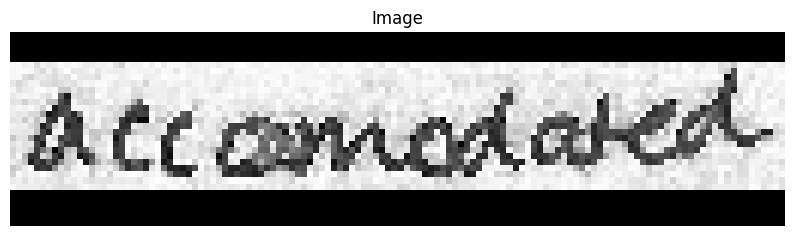

[2024/05/17 18:58:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021957874298095703
[2024/05/17 18:58:41] ppocr DEBUG: cls num  : 1, elapsed : 0.01637101173400879
[2024/05/17 18:58:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09499120712280273
Recognized text: The, Probability: 0.9943119883537292


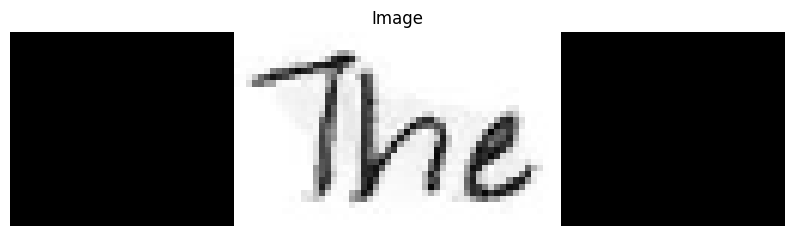

[2024/05/17 18:58:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02391982078552246
[2024/05/17 18:58:41] ppocr DEBUG: cls num  : 1, elapsed : 0.013807296752929688
[2024/05/17 18:58:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07273578643798828
Recognized text: Shogun, Probability: 0.9845008254051208


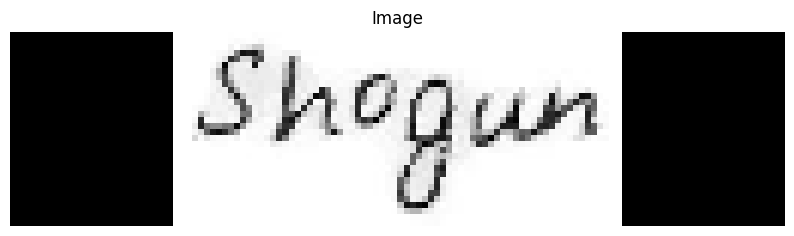

[2024/05/17 18:58:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02300882339477539
[2024/05/17 18:58:42] ppocr DEBUG: cls num  : 1, elapsed : 0.017451763153076172
[2024/05/17 18:58:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06615400314331055
Recognized text: parsally, Probability: 0.958587646484375


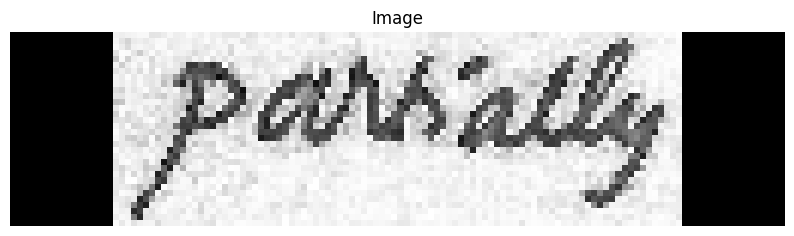

[2024/05/17 18:58:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016788721084594727
[2024/05/17 18:58:42] ppocr DEBUG: cls num  : 1, elapsed : 0.012775659561157227
[2024/05/17 18:58:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07397127151489258
Recognized text: parceled, Probability: 0.8745223879814148


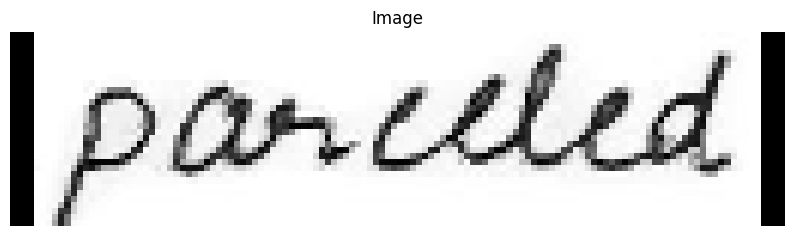

[2024/05/17 18:58:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023089170455932617
[2024/05/17 18:58:42] ppocr DEBUG: cls num  : 1, elapsed : 0.013092994689941406
[2024/05/17 18:58:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.060510873794555664
Recognized text: Lard, Probability: 0.9062826633453369


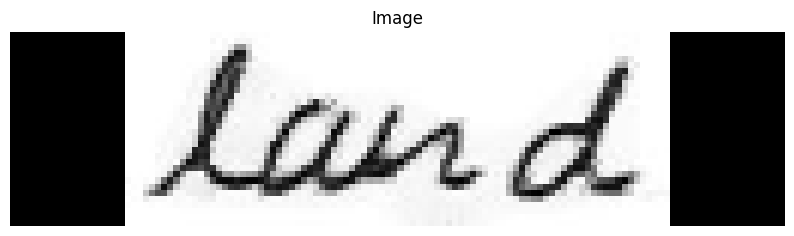

[2024/05/17 18:58:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018141746520996094
[2024/05/17 18:58:42] ppocr DEBUG: cls num  : 1, elapsed : 0.01607227325439453
[2024/05/17 18:58:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06177020072937012
Recognized text: t, Probability: 0.8360997438430786


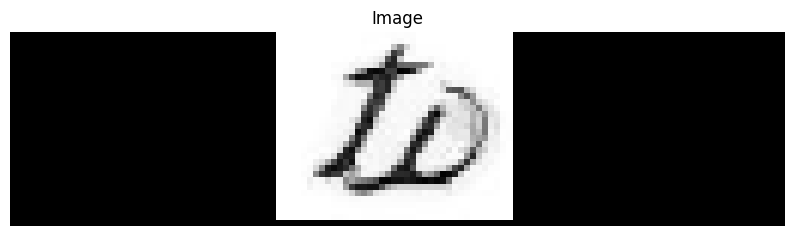

[2024/05/17 18:58:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03205728530883789
[2024/05/17 18:58:43] ppocr DEBUG: cls num  : 1, elapsed : 0.015505075454711914
[2024/05/17 18:58:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07133150100708008
Recognized text: ert, Probability: 0.7003803253173828


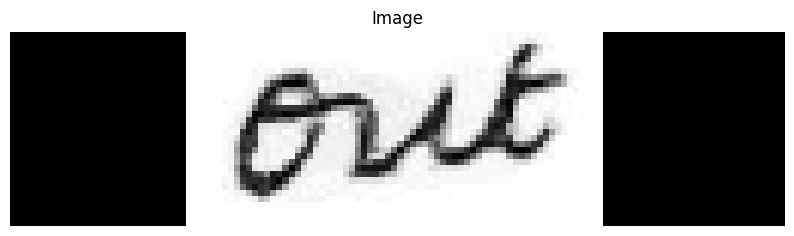

[2024/05/17 18:58:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019063472747802734
[2024/05/17 18:58:43] ppocr DEBUG: cls num  : 1, elapsed : 0.015185832977294922
[2024/05/17 18:58:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07021141052246094
Recognized text: energy, Probability: 0.9664179682731628


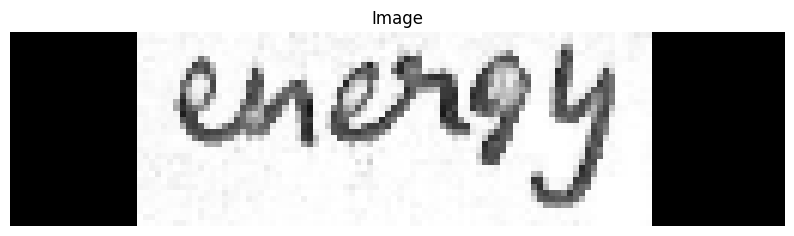

[2024/05/17 18:58:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027373313903808594
[2024/05/17 18:58:43] ppocr DEBUG: cls num  : 1, elapsed : 0.014781475067138672
[2024/05/17 18:58:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.059532880783081055
Recognized text: bwt, Probability: 0.7276785969734192


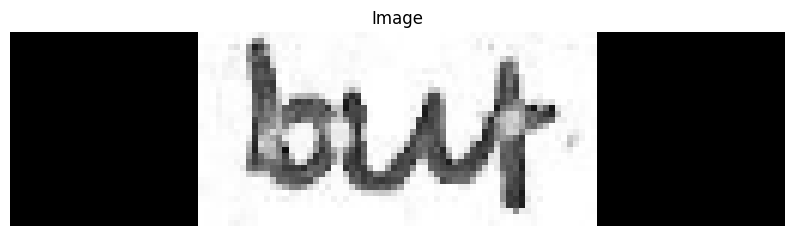

[2024/05/17 18:58:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020158767700195312
[2024/05/17 18:58:43] ppocr DEBUG: cls num  : 1, elapsed : 0.014028310775756836
[2024/05/17 18:58:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06176638603210449
Recognized text: on, Probability: 0.3641708791255951


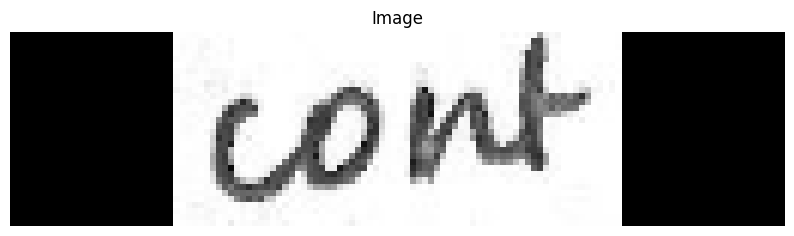

[2024/05/17 18:58:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019692659378051758
[2024/05/17 18:58:44] ppocr DEBUG: cls num  : 1, elapsed : 0.014290332794189453
[2024/05/17 18:58:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07142496109008789
Recognized text: it, Probability: 0.9631202220916748


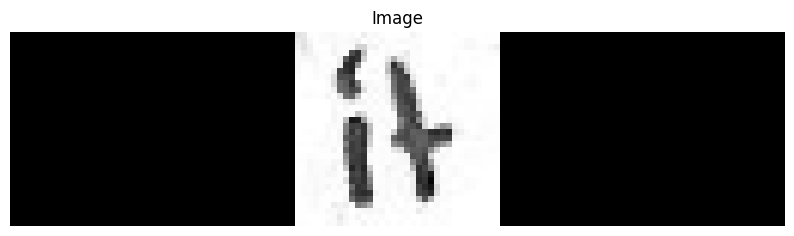

[2024/05/17 18:58:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020350217819213867
[2024/05/17 18:58:44] ppocr DEBUG: cls num  : 1, elapsed : 0.017457962036132812
[2024/05/17 18:58:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07547259330749512
Recognized text: hos, Probability: 0.8128932118415833


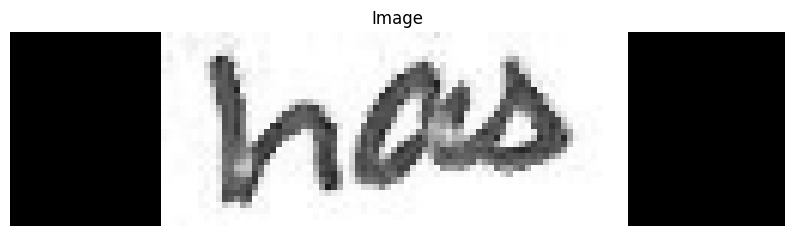

[2024/05/17 18:58:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029328584671020508
[2024/05/17 18:58:44] ppocr DEBUG: cls num  : 1, elapsed : 0.016206741333007812
[2024/05/17 18:58:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06824779510498047
Recognized text: Men, Probability: 0.8844635486602783


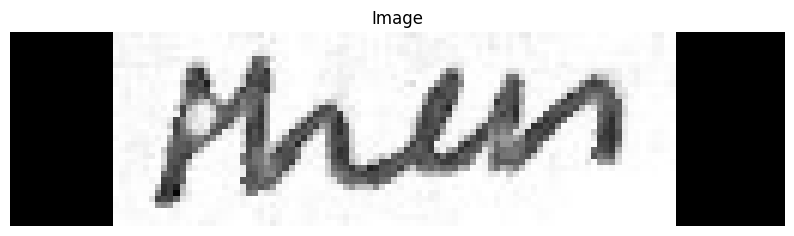

[2024/05/17 18:58:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021587133407592773
[2024/05/17 18:58:44] ppocr DEBUG: cls num  : 1, elapsed : 0.014924049377441406
[2024/05/17 18:58:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06221175193786621
Recognized text: weu, Probability: 0.7231341004371643


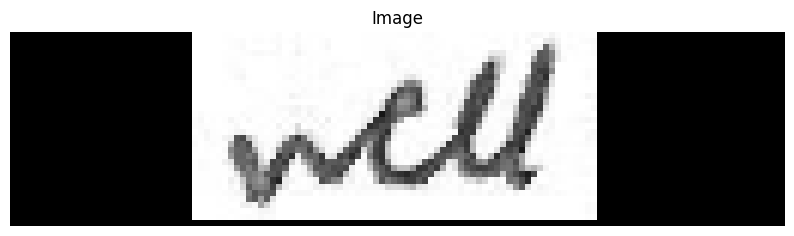

[2024/05/17 18:58:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029233932495117188
[2024/05/17 18:58:45] ppocr DEBUG: cls num  : 1, elapsed : 0.013843059539794922
[2024/05/17 18:58:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06450271606445312
Recognized text: e, Probability: 0.9920112490653992


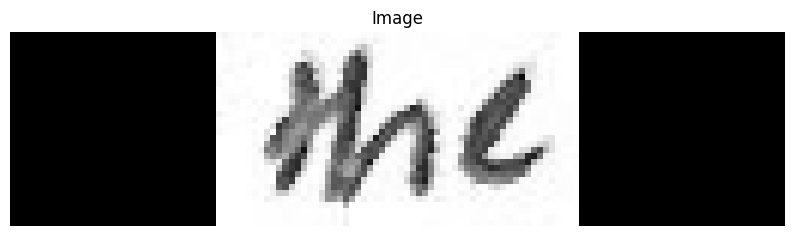

[2024/05/17 18:58:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.033423423767089844
[2024/05/17 18:58:45] ppocr DEBUG: cls num  : 1, elapsed : 0.013437509536743164
[2024/05/17 18:58:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07370257377624512
Recognized text: defineot, Probability: 0.7697093486785889


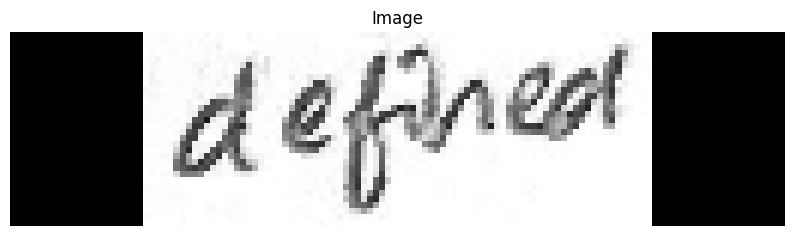

[2024/05/17 18:58:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025751829147338867
[2024/05/17 18:58:45] ppocr DEBUG: cls num  : 1, elapsed : 0.013605594635009766
[2024/05/17 18:58:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06316900253295898
Recognized text: Jineo, Probability: 0.7702663540840149


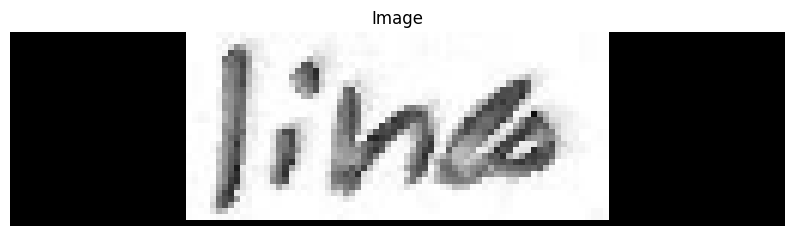

[2024/05/17 18:58:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.036705732345581055
[2024/05/17 18:58:45] ppocr DEBUG: cls num  : 1, elapsed : 0.013364791870117188
[2024/05/17 18:58:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0693979263305664
Recognized text: speunun, Probability: 0.839962899684906


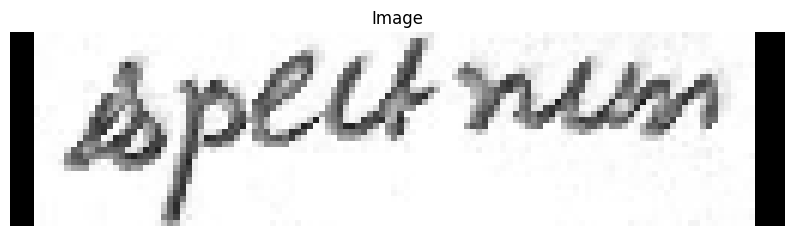

[2024/05/17 18:58:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021058320999145508
[2024/05/17 18:58:46] ppocr DEBUG: cls num  : 1, elapsed : 0.012600183486938477
[2024/05/17 18:58:46] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07100486755371094
Recognized text: the, Probability: 0.9925239682197571


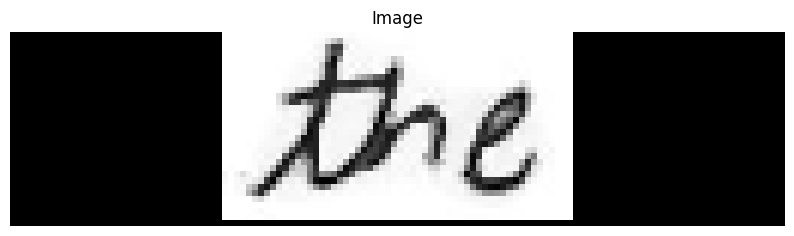

[2024/05/17 18:58:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022572755813598633
[2024/05/17 18:58:46] ppocr DEBUG: cls num  : 1, elapsed : 0.01377415657043457
[2024/05/17 18:58:46] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0614011287689209
Recognized text: Lords, Probability: 0.9281700253486633


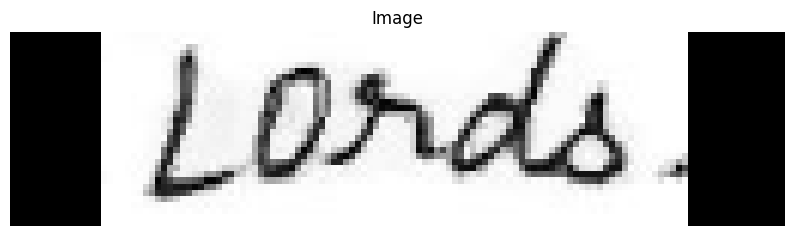

[2024/05/17 18:58:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02067089080810547
[2024/05/17 18:58:46] ppocr DEBUG: cls num  : 1, elapsed : 0.01636362075805664
[2024/05/17 18:58:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06657099723815918
Recognized text: pesants, Probability: 0.9645840525627136


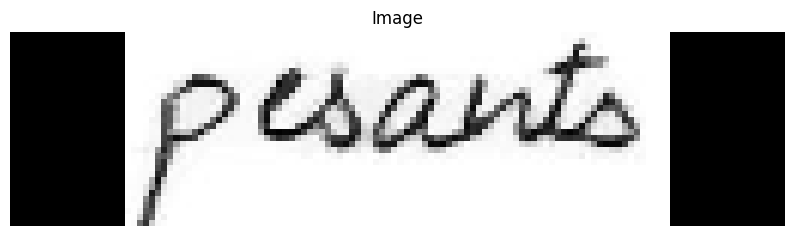

[2024/05/17 18:58:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01761770248413086
[2024/05/17 18:58:47] ppocr DEBUG: cls num  : 1, elapsed : 0.014111757278442383
[2024/05/17 18:58:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08263254165649414


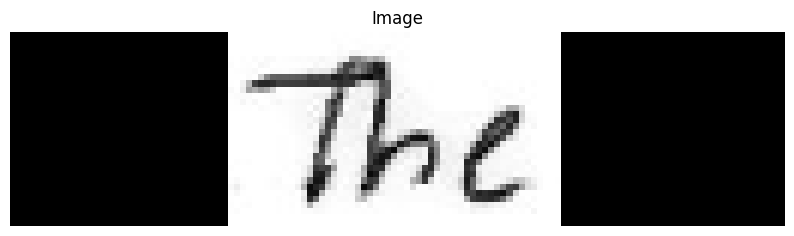

[2024/05/17 18:58:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023524999618530273
[2024/05/17 18:58:47] ppocr DEBUG: cls num  : 1, elapsed : 0.01247715950012207
[2024/05/17 18:58:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06659317016601562
Recognized text: worked, Probability: 0.8398520946502686


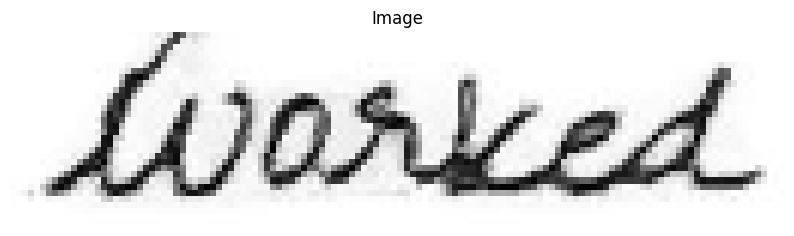

[2024/05/17 18:58:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023545503616333008
[2024/05/17 18:58:47] ppocr DEBUG: cls num  : 1, elapsed : 0.012941360473632812
[2024/05/17 18:58:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0658872127532959


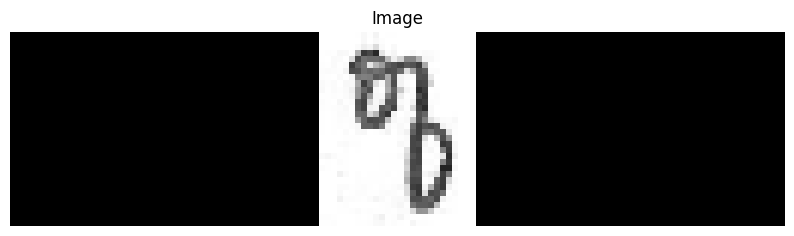

[2024/05/17 18:58:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03375673294067383
[2024/05/17 18:58:47] ppocr DEBUG: cls num  : 1, elapsed : 0.01982593536376953
[2024/05/17 18:58:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07675480842590332
Recognized text: E, Probability: 0.9895907044410706


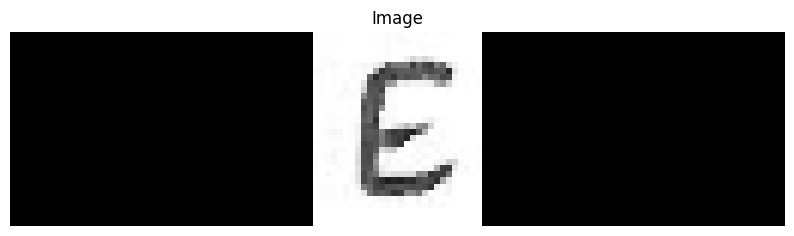

[2024/05/17 18:58:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02179861068725586
[2024/05/17 18:58:48] ppocr DEBUG: cls num  : 1, elapsed : 0.014882564544677734
[2024/05/17 18:58:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06908249855041504
Recognized text: and, Probability: 0.9951653480529785


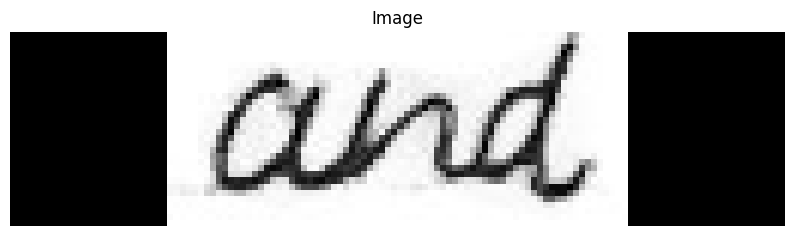

[2024/05/17 18:58:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02114129066467285
[2024/05/17 18:58:48] ppocr DEBUG: cls num  : 1, elapsed : 0.02025771141052246
[2024/05/17 18:58:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07150483131408691
Recognized text: M, Probability: 0.5181031823158264


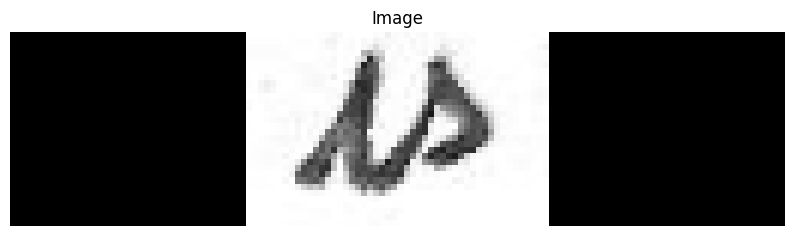

[2024/05/17 18:58:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02058243751525879
[2024/05/17 18:58:48] ppocr DEBUG: cls num  : 1, elapsed : 0.016668319702148438
[2024/05/17 18:58:48] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07474660873413086
Recognized text: cont, Probability: 0.8818930387496948


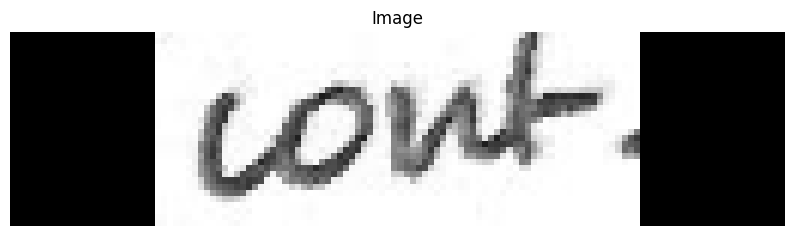

[2024/05/17 18:58:48] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03426384925842285
[2024/05/17 18:58:49] ppocr DEBUG: cls num  : 1, elapsed : 0.016676664352416992
[2024/05/17 18:58:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07677650451660156
Recognized text: tou, Probability: 0.4150063097476959


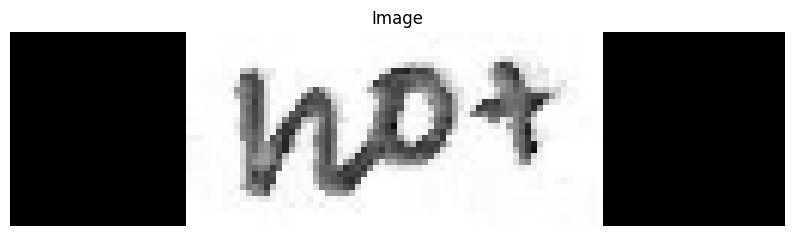

[2024/05/17 18:58:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02097153663635254
[2024/05/17 18:58:49] ppocr DEBUG: cls num  : 1, elapsed : 0.014900684356689453
[2024/05/17 18:58:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07644796371459961
Recognized text: lived, Probability: 0.9400795102119446


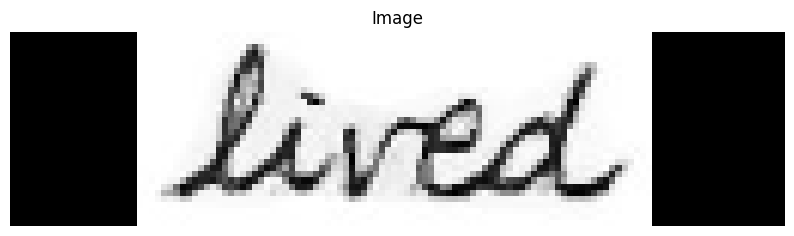

[2024/05/17 18:58:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021375417709350586
[2024/05/17 18:58:49] ppocr DEBUG: cls num  : 1, elapsed : 0.013532876968383789
[2024/05/17 18:58:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07093381881713867
Recognized text: for, Probability: 0.9692966341972351


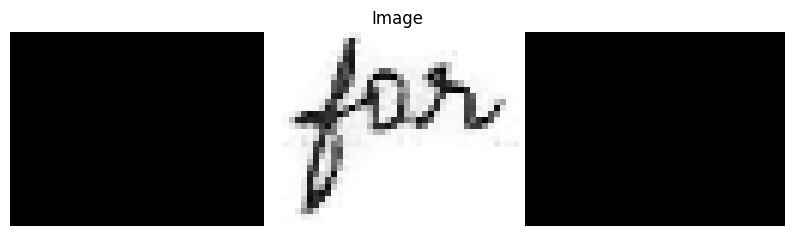

[2024/05/17 18:58:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02744770050048828
[2024/05/17 18:58:49] ppocr DEBUG: cls num  : 1, elapsed : 0.011409759521484375
[2024/05/17 18:58:49] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06606483459472656
Recognized text: the, Probability: 0.9844339489936829


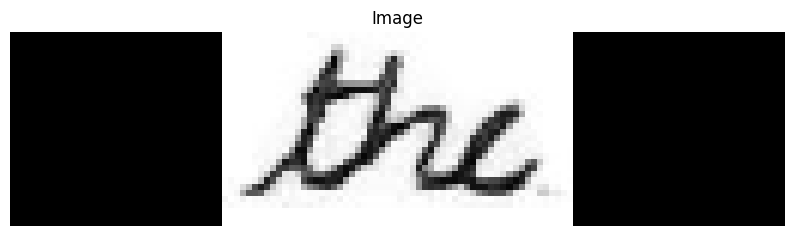

[2024/05/17 18:58:49] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.036424875259399414
[2024/05/17 18:58:50] ppocr DEBUG: cls num  : 1, elapsed : 0.015552043914794922
[2024/05/17 18:58:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09000706672668457
Recognized text: under, Probability: 0.8986911773681641


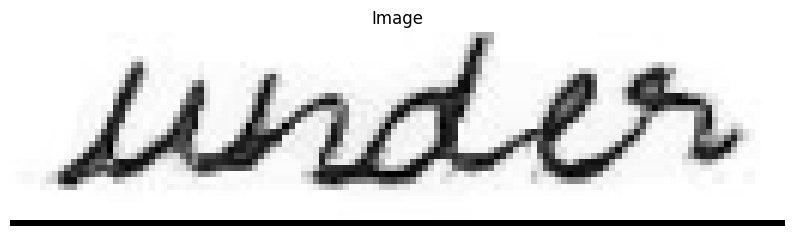

[2024/05/17 18:58:50] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020400285720825195
[2024/05/17 18:58:50] ppocr DEBUG: cls num  : 1, elapsed : 0.012543201446533203
[2024/05/17 18:58:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0723884105682373
Recognized text: erenly, Probability: 0.8792266845703125


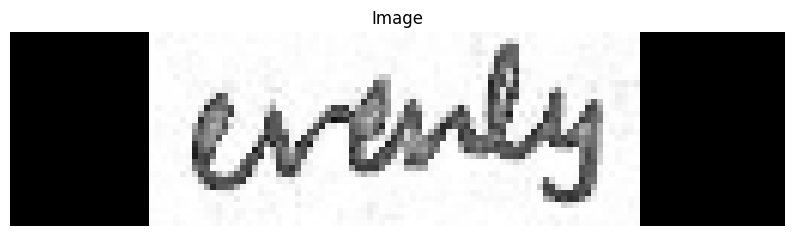

[2024/05/17 18:58:50] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018349647521972656
[2024/05/17 18:58:50] ppocr DEBUG: cls num  : 1, elapsed : 0.020128965377807617
[2024/05/17 18:58:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07088184356689453


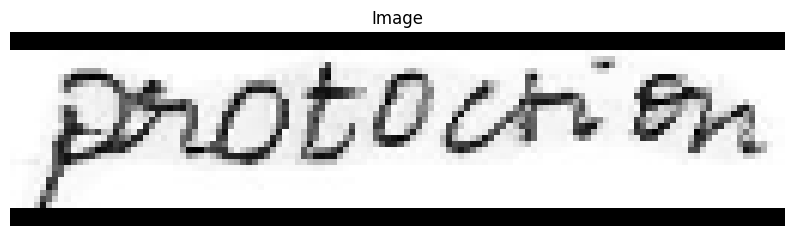

[2024/05/17 18:58:50] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0377199649810791
[2024/05/17 18:58:50] ppocr DEBUG: cls num  : 1, elapsed : 0.01196432113647461
[2024/05/17 18:58:50] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06983804702758789
Recognized text: mas, Probability: 0.767765998840332


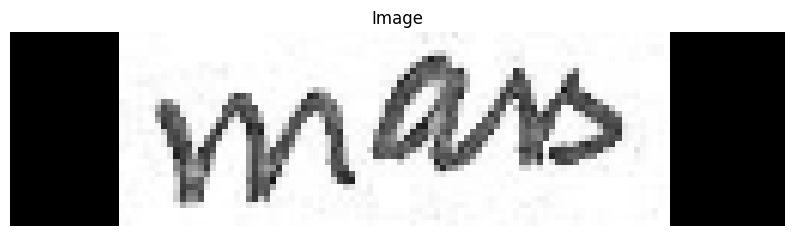

[2024/05/17 18:58:51] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01648235321044922
[2024/05/17 18:58:51] ppocr DEBUG: cls num  : 1, elapsed : 0.02108931541442871
[2024/05/17 18:58:51] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07997345924377441
Recognized text: modd, Probability: 0.9100125432014465


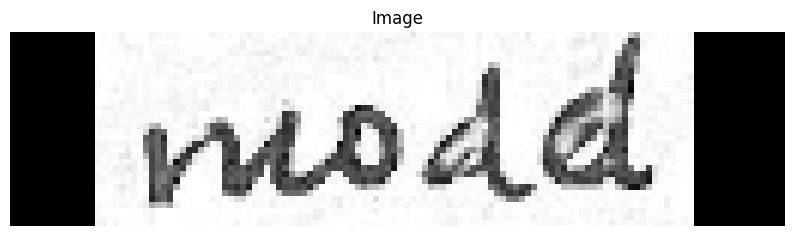

[2024/05/17 18:58:51] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.021036863327026367
[2024/05/17 18:58:51] ppocr DEBUG: cls num  : 2, elapsed : 0.016280651092529297
[2024/05/17 18:58:51] ppocr DEBUG: rec_res num  : 2, elapsed : 0.10519909858703613
Recognized text: lisributed,, Probability: 0.7463363409042358


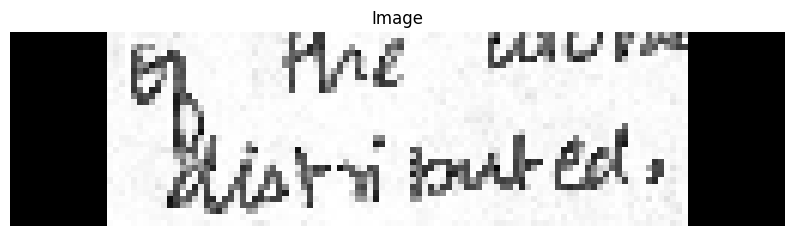

[2024/05/17 18:58:51] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.020249366760253906
[2024/05/17 18:58:51] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:51] ppocr DEBUG: rec_res num  : 0, elapsed : 4.5299530029296875e-06


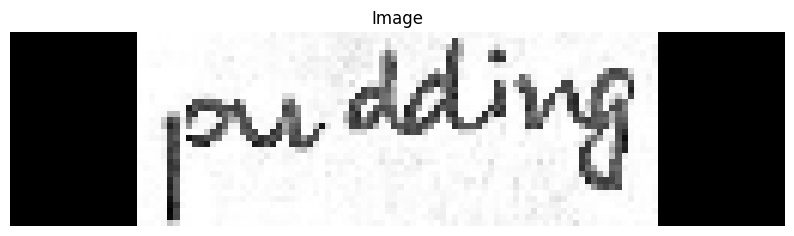

[2024/05/17 18:58:51] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023060321807861328
[2024/05/17 18:58:51] ppocr DEBUG: cls num  : 1, elapsed : 0.015784502029418945
[2024/05/17 18:58:51] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09263277053833008
Recognized text: the, Probability: 0.9575631618499756


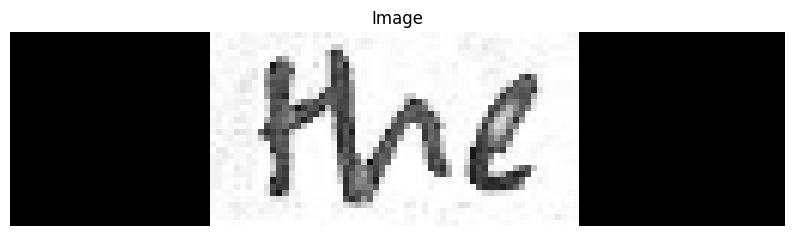

[2024/05/17 18:58:52] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017679929733276367
[2024/05/17 18:58:52] ppocr DEBUG: cls num  : 1, elapsed : 0.013761281967163086
[2024/05/17 18:58:52] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09154152870178223
Recognized text: feiled, Probability: 0.847323477268219


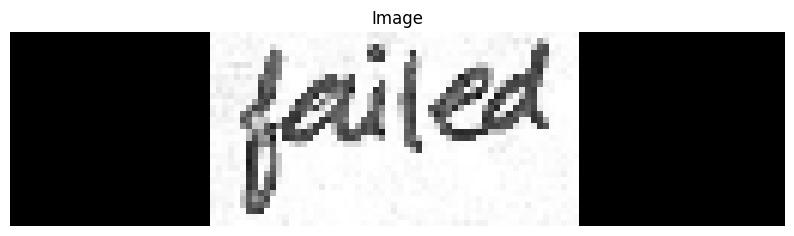

[2024/05/17 18:58:52] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.015709877014160156
[2024/05/17 18:58:52] ppocr DEBUG: cls num  : 1, elapsed : 0.01802372932434082
[2024/05/17 18:58:52] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09384012222290039
Recognized text: atons, Probability: 0.9009402990341187


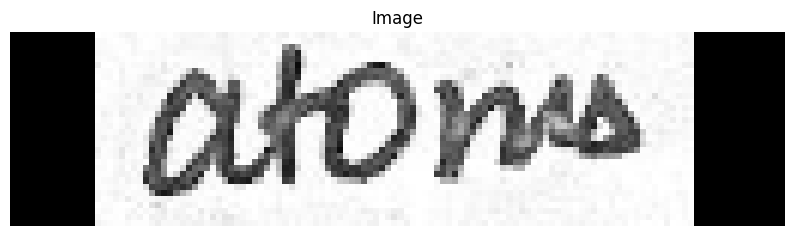

[2024/05/17 18:58:52] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026391267776489258
[2024/05/17 18:58:52] ppocr DEBUG: cls num  : 1, elapsed : 0.02574610710144043
[2024/05/17 18:58:52] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11220598220825195
Recognized text: S, Probability: 0.3698939085006714


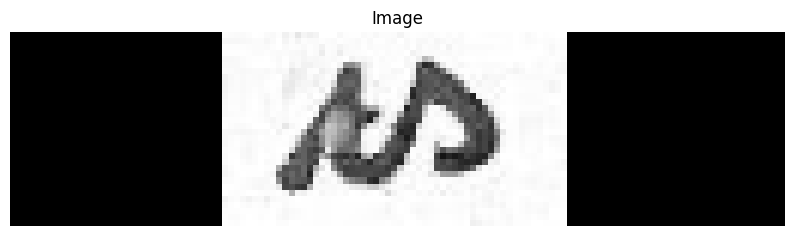

[2024/05/17 18:58:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02139878273010254
[2024/05/17 18:58:53] ppocr DEBUG: cls num  : 1, elapsed : 0.01658916473388672
[2024/05/17 18:58:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08629322052001953
Recognized text: my, Probability: 0.4612196087837219


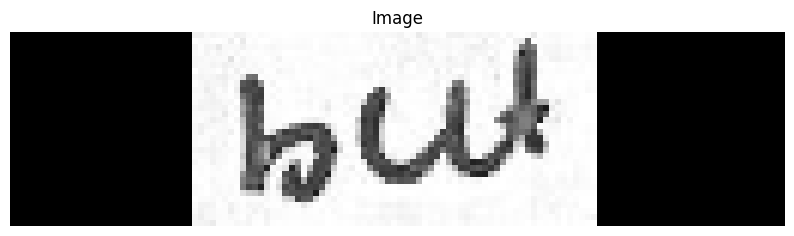

[2024/05/17 18:58:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016914844512939453
[2024/05/17 18:58:53] ppocr DEBUG: cls num  : 1, elapsed : 0.014815330505371094
[2024/05/17 18:58:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08214569091796875
Recognized text: ), Probability: 0.3744925558567047


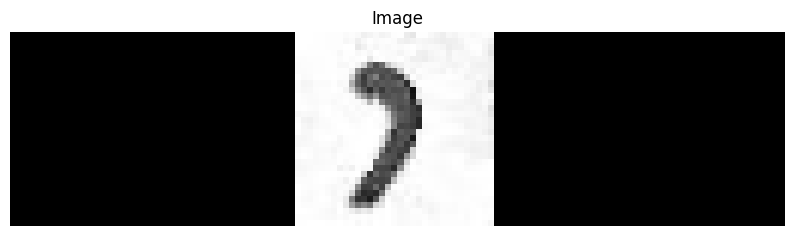

[2024/05/17 18:58:53] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016996145248413086
[2024/05/17 18:58:53] ppocr DEBUG: cls num  : 1, elapsed : 0.013392210006713867
[2024/05/17 18:58:53] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07833170890808105
Recognized text: S, Probability: 0.47510430216789246


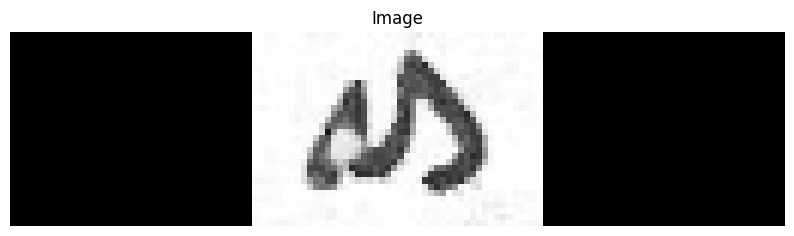

[2024/05/17 18:58:54] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023600339889526367
[2024/05/17 18:58:54] ppocr DEBUG: cls num  : 1, elapsed : 0.018249034881591797
[2024/05/17 18:58:54] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11022043228149414
Recognized text: to, Probability: 0.9648233652114868


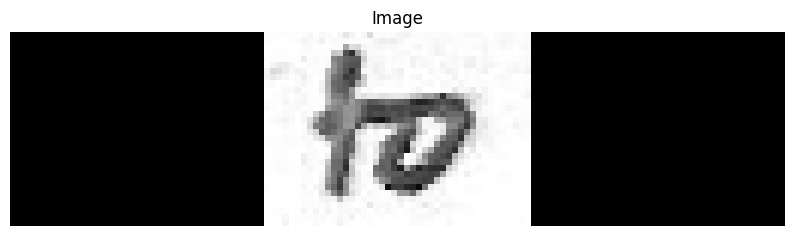

[2024/05/17 18:58:54] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019017934799194336
[2024/05/17 18:58:54] ppocr DEBUG: cls num  : 1, elapsed : 0.01418614387512207
[2024/05/17 18:58:54] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08218693733215332
Recognized text: conrradlitruny, Probability: 0.6550413966178894


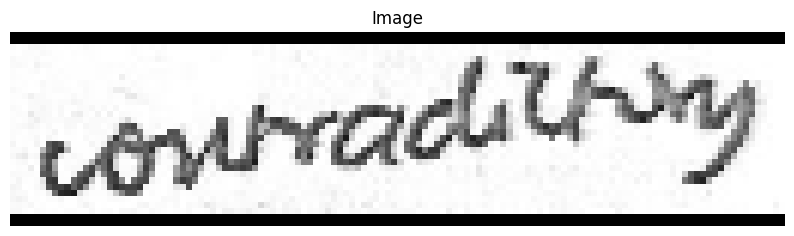

[2024/05/17 18:58:54] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023758411407470703
[2024/05/17 18:58:54] ppocr DEBUG: cls num  : 1, elapsed : 0.016587257385253906
[2024/05/17 18:58:55] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10295343399047852
Recognized text: poapmen, Probability: 0.5622290372848511


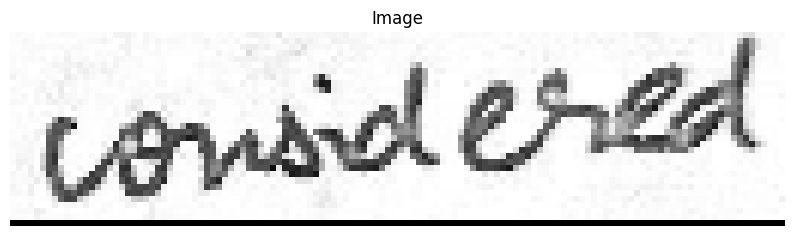

[2024/05/17 18:58:55] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019362926483154297
[2024/05/17 18:58:55] ppocr DEBUG: cls num  : 1, elapsed : 0.01427149772644043
[2024/05/17 18:58:55] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08631181716918945


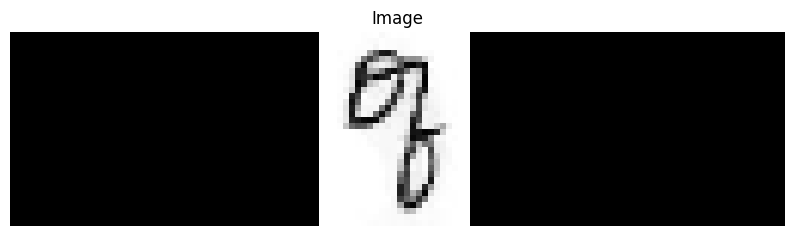

[2024/05/17 18:58:55] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02064228057861328
[2024/05/17 18:58:55] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:58:55] ppocr DEBUG: rec_res num  : 0, elapsed : 6.198883056640625e-06


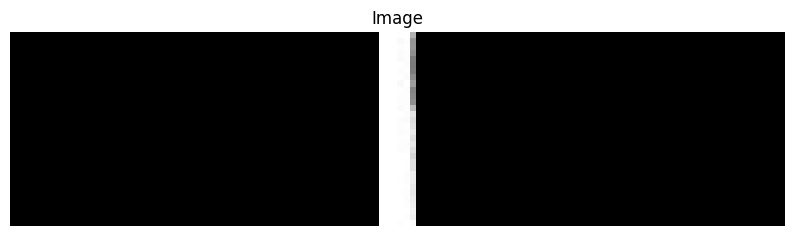

[2024/05/17 18:58:55] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03612160682678223
[2024/05/17 18:58:55] ppocr DEBUG: cls num  : 1, elapsed : 0.01702117919921875
[2024/05/17 18:58:55] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08288741111755371
Recognized text: ther, Probability: 0.9822022914886475


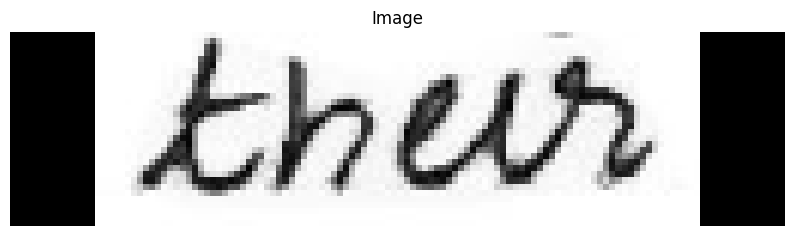

[2024/05/17 18:58:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023167133331298828
[2024/05/17 18:58:56] ppocr DEBUG: cls num  : 1, elapsed : 0.021671295166015625
[2024/05/17 18:58:56] ppocr DEBUG: rec_res num  : 1, elapsed : 0.12508845329284668
Recognized text: Logds, Probability: 0.8089084625244141


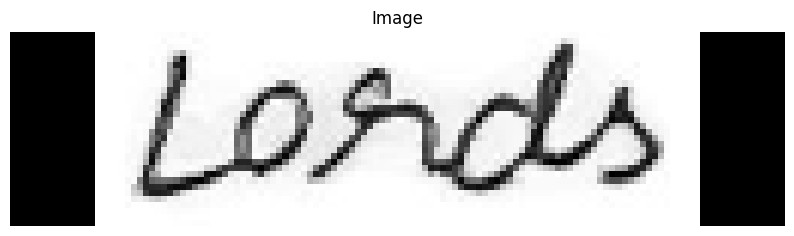

[2024/05/17 18:58:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019669532775878906
[2024/05/17 18:58:56] ppocr DEBUG: cls num  : 1, elapsed : 0.02419447898864746
[2024/05/17 18:58:56] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11385822296142578
Recognized text: and, Probability: 0.9939632415771484


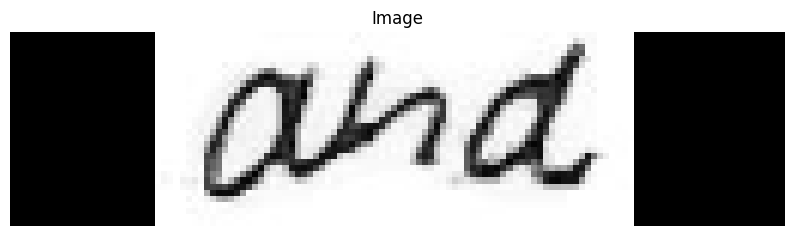

[2024/05/17 18:58:56] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.030077457427978516
[2024/05/17 18:58:56] ppocr DEBUG: cls num  : 1, elapsed : 0.013924837112426758
[2024/05/17 18:58:56] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08442568778991699
Recognized text: his, Probability: 0.8655552268028259


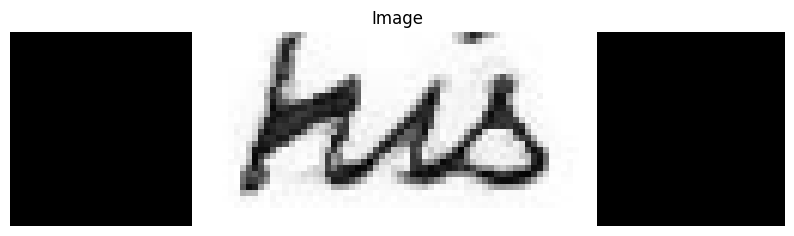

[2024/05/17 18:58:57] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027310848236083984
[2024/05/17 18:58:57] ppocr DEBUG: cls num  : 1, elapsed : 0.01751852035522461
[2024/05/17 18:58:57] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09813928604125977
Recognized text: smel, Probability: 0.7700520157814026


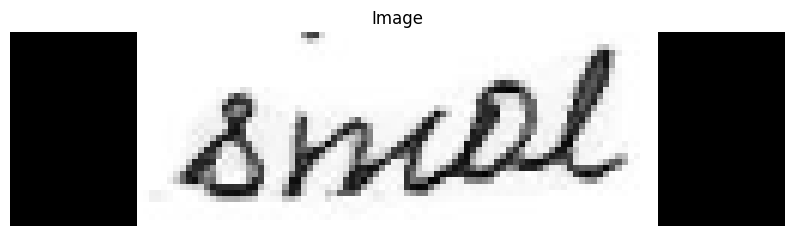

[2024/05/17 18:58:57] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025934219360351562
[2024/05/17 18:58:57] ppocr DEBUG: cls num  : 1, elapsed : 0.016582489013671875
[2024/05/17 18:58:57] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10910773277282715
Recognized text: carpet, Probability: 0.9690868854522705


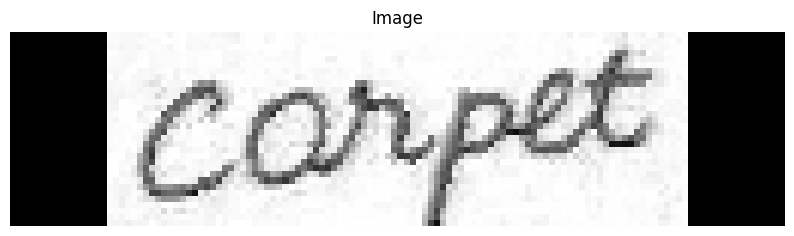

[2024/05/17 18:58:57] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024975061416625977
[2024/05/17 18:58:57] ppocr DEBUG: cls num  : 1, elapsed : 0.0117340087890625
[2024/05/17 18:58:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08462882041931152
Recognized text: to, Probability: 0.9948121309280396


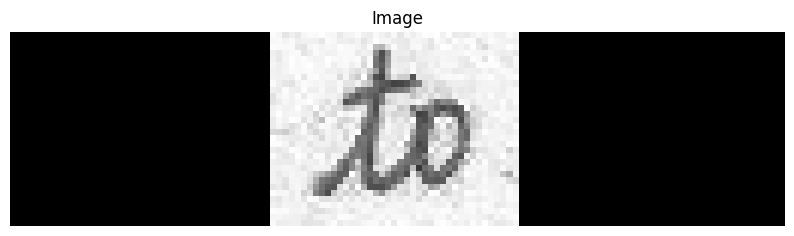

[2024/05/17 18:58:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024491071701049805
[2024/05/17 18:58:58] ppocr DEBUG: cls num  : 1, elapsed : 0.017690658569335938
[2024/05/17 18:58:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08917713165283203
Recognized text: annd, Probability: 0.9852957725524902


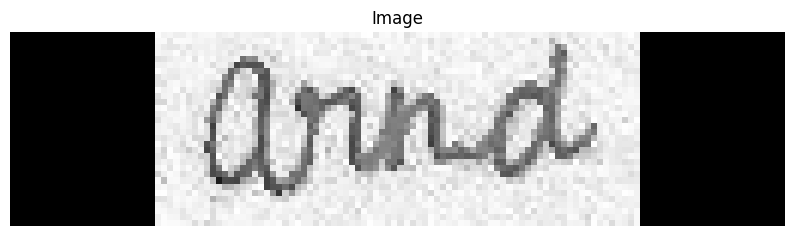

[2024/05/17 18:58:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01958918571472168
[2024/05/17 18:58:58] ppocr DEBUG: cls num  : 1, elapsed : 0.011915445327758789
[2024/05/17 18:58:58] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09719324111938477
Recognized text: him, Probability: 0.9800353646278381


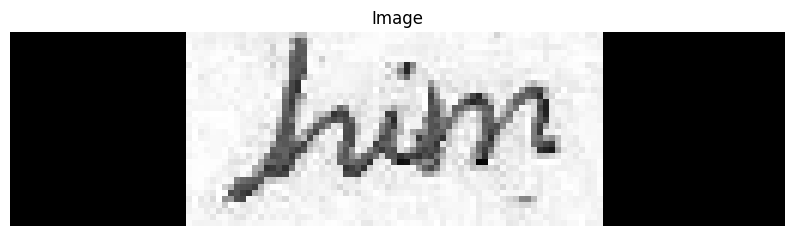

[2024/05/17 18:58:58] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02361297607421875
[2024/05/17 18:58:58] ppocr DEBUG: cls num  : 1, elapsed : 0.018616914749145508
[2024/05/17 18:58:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07524681091308594
Recognized text: fase, Probability: 0.9899968504905701


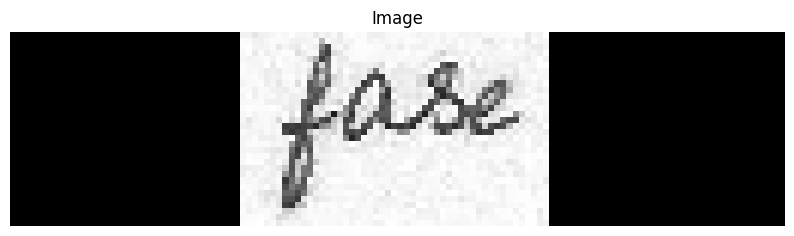

[2024/05/17 18:58:59] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0200653076171875
[2024/05/17 18:58:59] ppocr DEBUG: cls num  : 1, elapsed : 0.01235651969909668
[2024/05/17 18:58:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08414268493652344
Recognized text: ten, Probability: 0.8870391845703125


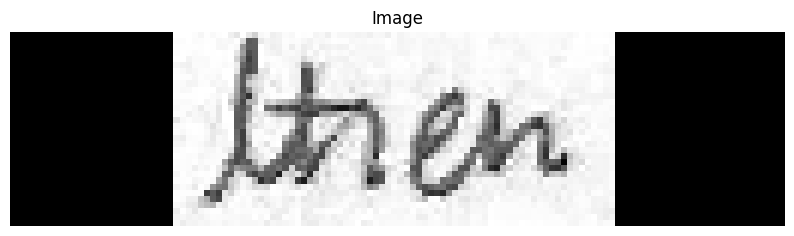

[2024/05/17 18:58:59] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.030189990997314453
[2024/05/17 18:58:59] ppocr DEBUG: cls num  : 1, elapsed : 0.0171966552734375
[2024/05/17 18:58:59] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07857441902160645
Recognized text: face, Probability: 0.9884933233261108


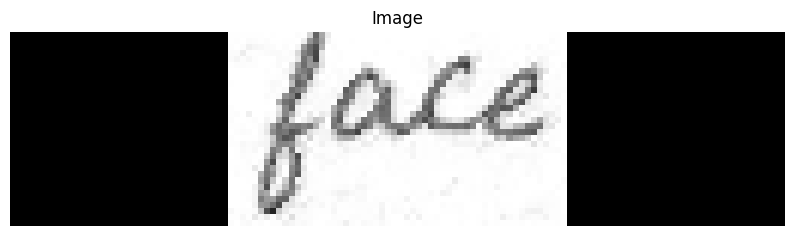

[2024/05/17 18:58:59] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024503469467163086
[2024/05/17 18:59:00] ppocr DEBUG: cls num  : 1, elapsed : 0.01450347900390625
[2024/05/17 18:59:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09198760986328125
Recognized text: ocasionaly, Probability: 0.8931263089179993


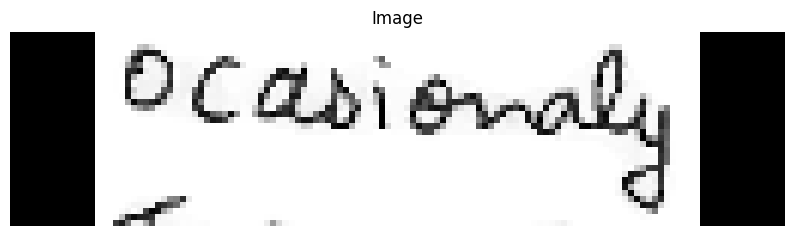

[2024/05/17 18:59:00] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028172731399536133
[2024/05/17 18:59:00] ppocr DEBUG: cls num  : 1, elapsed : 0.023297548294067383
[2024/05/17 18:59:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10609817504882812
Recognized text: of, Probability: 0.5097191333770752


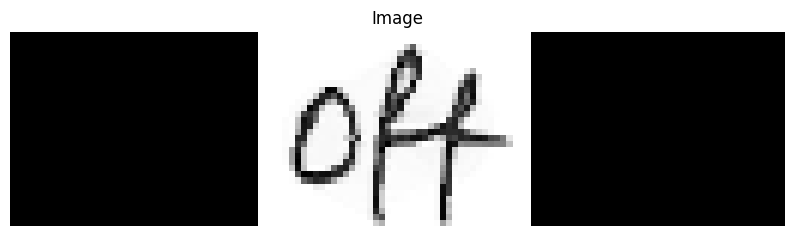

[2024/05/17 18:59:00] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01953577995300293
[2024/05/17 18:59:00] ppocr DEBUG: cls num  : 1, elapsed : 0.015487194061279297
[2024/05/17 18:59:00] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08026909828186035
Recognized text: Bntish, Probability: 0.8373549580574036


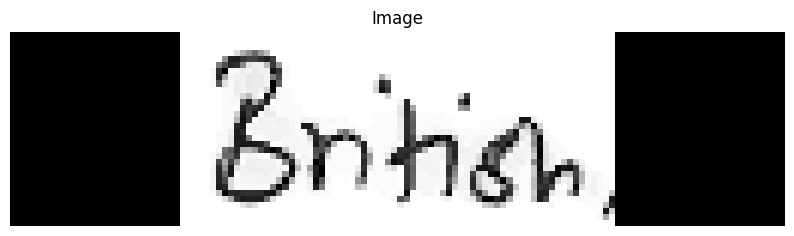

[2024/05/17 18:59:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018330812454223633
[2024/05/17 18:59:01] ppocr DEBUG: cls num  : 1, elapsed : 0.012865543365478516
[2024/05/17 18:59:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07778310775756836
Recognized text: and, Probability: 0.929133415222168


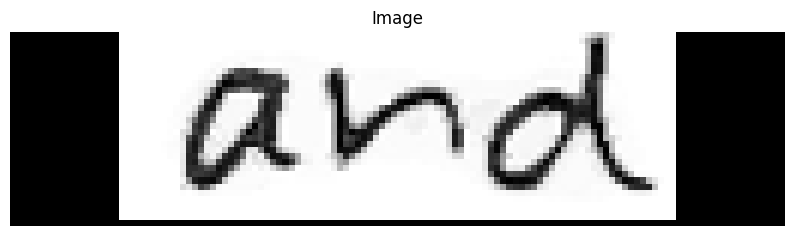

[2024/05/17 18:59:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019606351852416992
[2024/05/17 18:59:01] ppocr DEBUG: cls num  : 1, elapsed : 0.013262271881103516
[2024/05/17 18:59:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07758641242980957
Recognized text: Hhe, Probability: 0.755453884601593


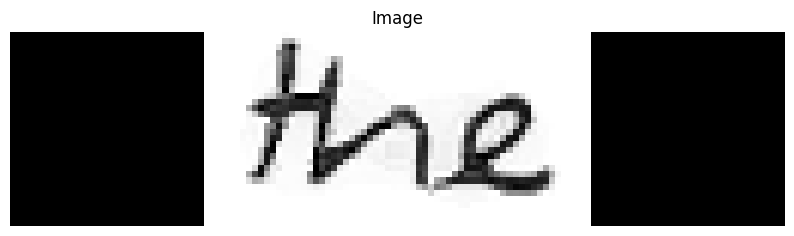

[2024/05/17 18:59:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016706466674804688
[2024/05/17 18:59:01] ppocr DEBUG: cls num  : 1, elapsed : 0.017399072647094727
[2024/05/17 18:59:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08582305908203125
Recognized text: Amer ceu, Probability: 0.9152214527130127


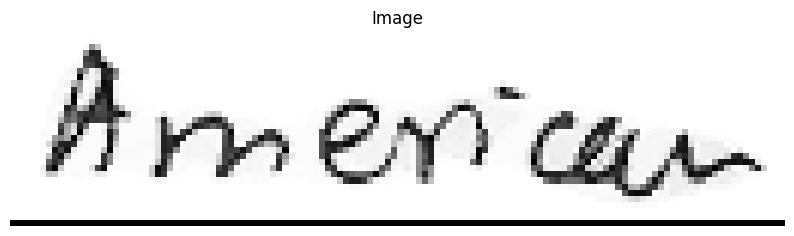

[2024/05/17 18:59:01] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01746964454650879
[2024/05/17 18:59:01] ppocr DEBUG: cls num  : 1, elapsed : 0.014915227890014648
[2024/05/17 18:59:01] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07910323143005371


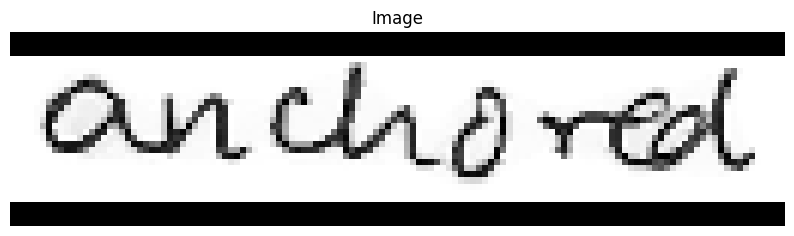

[2024/05/17 18:59:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.036827802658081055
[2024/05/17 18:59:02] ppocr DEBUG: cls num  : 1, elapsed : 0.016503572463989258
[2024/05/17 18:59:02] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07143235206604004
Recognized text: Frenu, Probability: 0.905268669128418


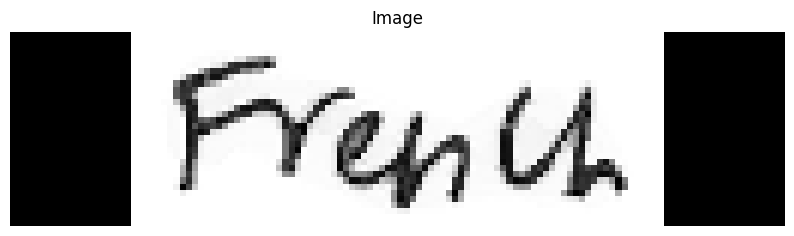

[2024/05/17 18:59:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01664113998413086
[2024/05/17 18:59:02] ppocr DEBUG: cls num  : 1, elapsed : 0.01393747329711914
[2024/05/17 18:59:02] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07882356643676758
Recognized text: anvm fop, Probability: 0.45593756437301636


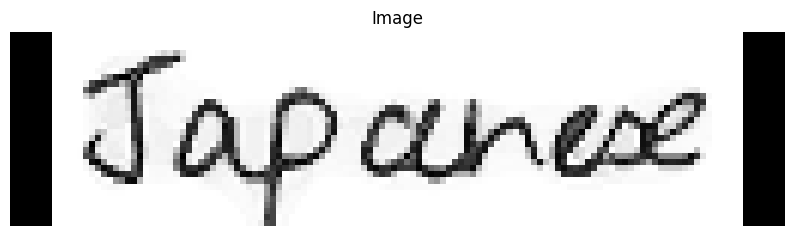

[2024/05/17 18:59:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022064924240112305
[2024/05/17 18:59:02] ppocr DEBUG: cls num  : 1, elapsed : 0.018311023712158203
[2024/05/17 18:59:02] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07437849044799805
Recognized text: CoS te, Probability: 0.8594934344291687


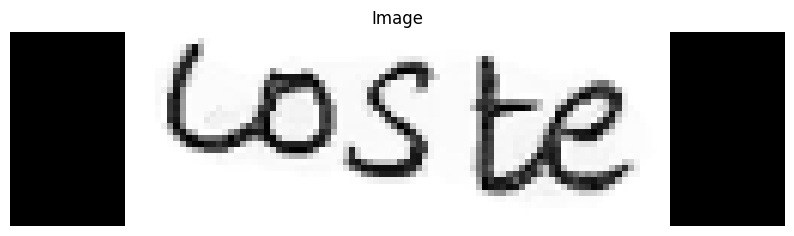

[2024/05/17 18:59:02] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020257949829101562
[2024/05/17 18:59:02] ppocr DEBUG: cls num  : 1, elapsed : 0.01663661003112793
[2024/05/17 18:59:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0860605239868164
Recognized text: ta de, Probability: 0.6675547361373901


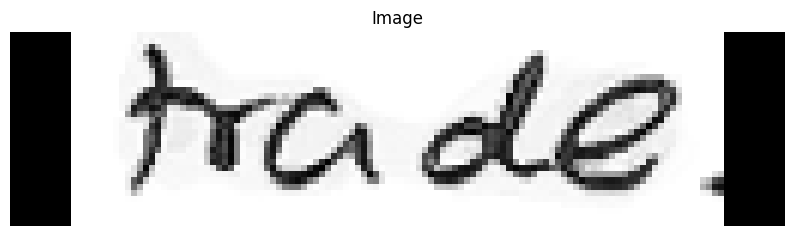

[2024/05/17 18:59:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020611286163330078
[2024/05/17 18:59:03] ppocr DEBUG: cls num  : 1, elapsed : 0.012815713882446289
[2024/05/17 18:59:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07153725624084473
Recognized text: to, Probability: 0.6372382640838623


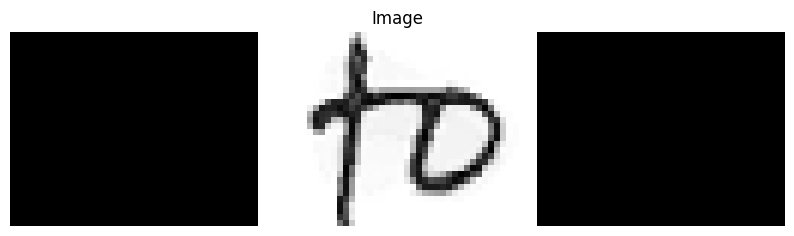

[2024/05/17 18:59:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017706871032714844
[2024/05/17 18:59:03] ppocr DEBUG: cls num  : 1, elapsed : 0.014956474304199219
[2024/05/17 18:59:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08419203758239746
Recognized text: Pot ytc, Probability: 0.7382164001464844


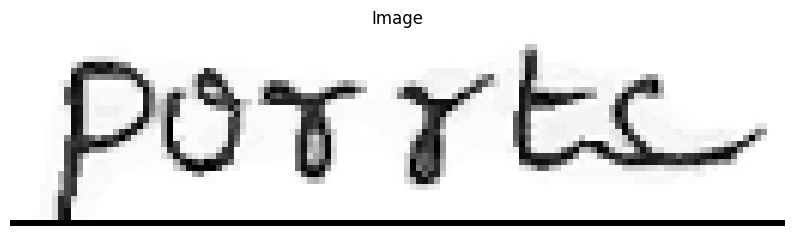

[2024/05/17 18:59:03] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01908254623413086
[2024/05/17 18:59:03] ppocr DEBUG: cls num  : 1, elapsed : 0.013995647430419922
[2024/05/17 18:59:03] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07426261901855469
Recognized text: mde, Probability: 0.5016063451766968


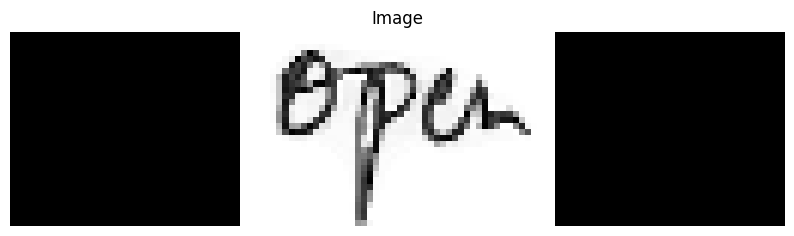

[2024/05/17 18:59:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02578902244567871
[2024/05/17 18:59:04] ppocr DEBUG: cls num  : 1, elapsed : 0.022662878036499023
[2024/05/17 18:59:04] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07644343376159668
Recognized text: theiy, Probability: 0.9136316180229187


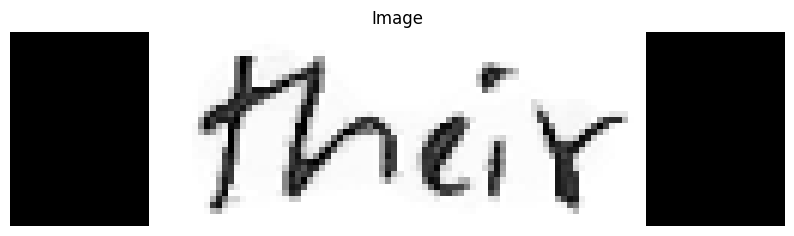

[2024/05/17 18:59:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02025461196899414
[2024/05/17 18:59:04] ppocr DEBUG: cls num  : 1, elapsed : 0.012872934341430664
[2024/05/17 18:59:04] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07849860191345215
Recognized text: the, Probability: 0.962323009967804


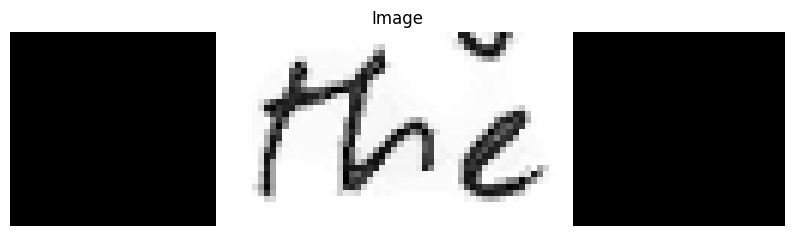

[2024/05/17 18:59:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021152973175048828
[2024/05/17 18:59:04] ppocr DEBUG: cls num  : 1, elapsed : 0.016822338104248047
[2024/05/17 18:59:04] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07609200477600098
Recognized text: to, Probability: 0.9933807253837585


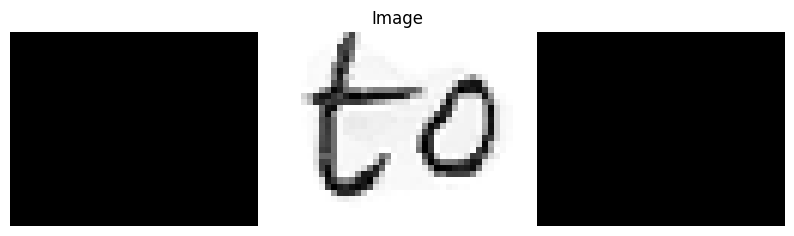

[2024/05/17 18:59:04] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019461393356323242
[2024/05/17 18:59:04] ppocr DEBUG: cls num  : 1, elapsed : 0.015871286392211914
[2024/05/17 18:59:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07366776466369629
Recognized text: convinse, Probability: 0.9526034593582153


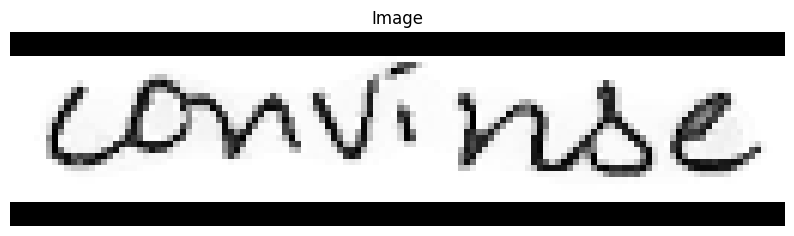

[2024/05/17 18:59:05] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020506858825683594
[2024/05/17 18:59:05] ppocr DEBUG: cls num  : 1, elapsed : 0.014939546585083008
[2024/05/17 18:59:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09041070938110352
Recognized text: Japanese, Probability: 0.9428699016571045


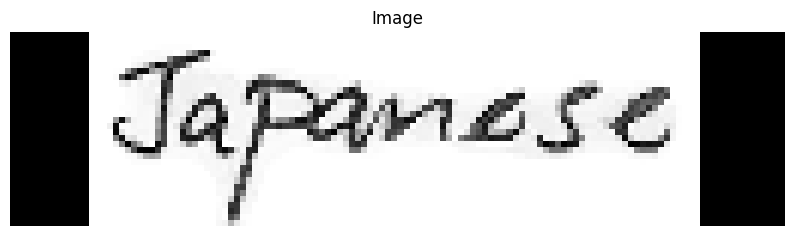

[2024/05/17 18:59:05] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018781185150146484
[2024/05/17 18:59:05] ppocr DEBUG: cls num  : 1, elapsed : 0.012280464172363281
[2024/05/17 18:59:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08369207382202148
Recognized text: t, Probability: 0.5841533541679382


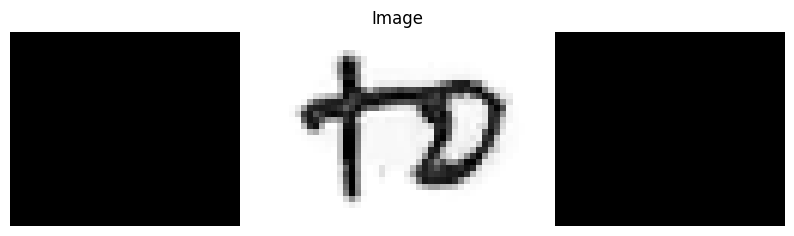

[2024/05/17 18:59:05] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02196216583251953
[2024/05/17 18:59:05] ppocr DEBUG: cls num  : 1, elapsed : 0.015706777572631836
[2024/05/17 18:59:05] ppocr DEBUG: rec_res num  : 1, elapsed : 0.06607913970947266


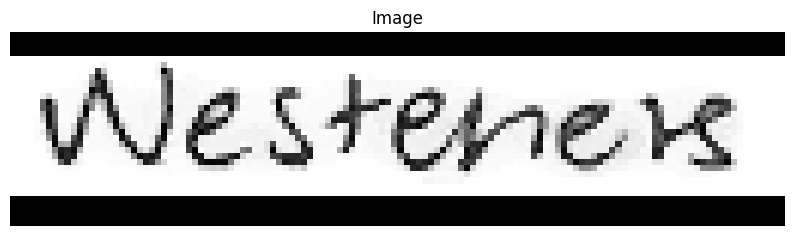

[2024/05/17 18:59:06] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.017986297607421875
[2024/05/17 18:59:06] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:06] ppocr DEBUG: rec_res num  : 0, elapsed : 3.5762786865234375e-06


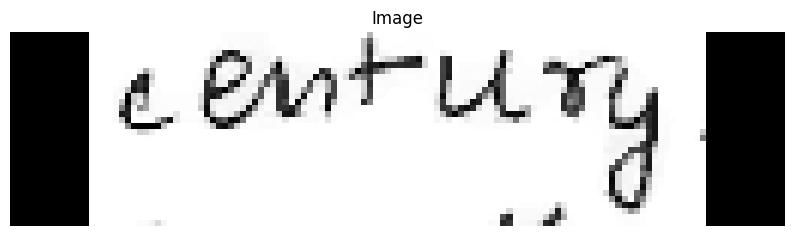

[2024/05/17 18:59:06] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01770496368408203
[2024/05/17 18:59:06] ppocr DEBUG: cls num  : 1, elapsed : 0.013598442077636719
[2024/05/17 18:59:06] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07514095306396484
Recognized text: nintenth, Probability: 0.9406800866127014


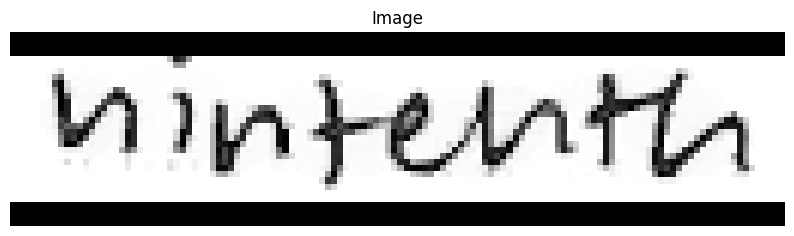

[2024/05/17 18:59:06] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.018514394760131836
[2024/05/17 18:59:06] ppocr DEBUG: cls num  : 2, elapsed : 0.023373126983642578
[2024/05/17 18:59:06] ppocr DEBUG: rec_res num  : 2, elapsed : 0.10803866386413574
Recognized text: eorily, Probability: 0.900982677936554
Recognized text: toied, Probability: 0.7226095199584961


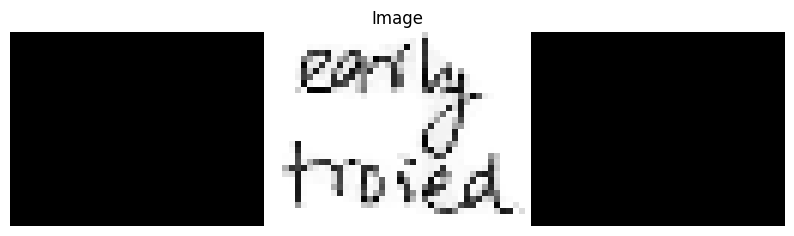

[2024/05/17 18:59:06] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.01996922492980957
[2024/05/17 18:59:06] ppocr DEBUG: cls num  : 3, elapsed : 0.039173126220703125
[2024/05/17 18:59:07] ppocr DEBUG: rec_res num  : 3, elapsed : 0.1962449550628662
Recognized text: ngivg, Probability: 0.8474456071853638
Recognized text: D, Probability: 0.41282254457473755


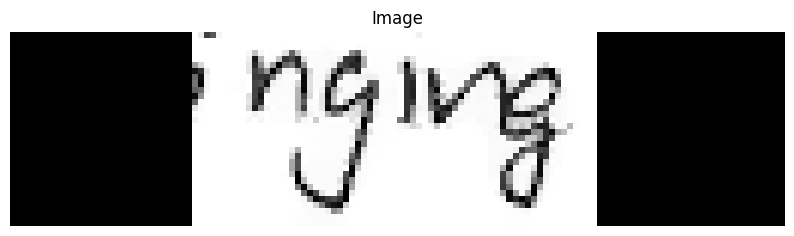

[2024/05/17 18:59:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022454023361206055
[2024/05/17 18:59:07] ppocr DEBUG: cls num  : 1, elapsed : 0.01336526870727539
[2024/05/17 18:59:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08206868171691895
Recognized text: In, Probability: 0.3533393144607544


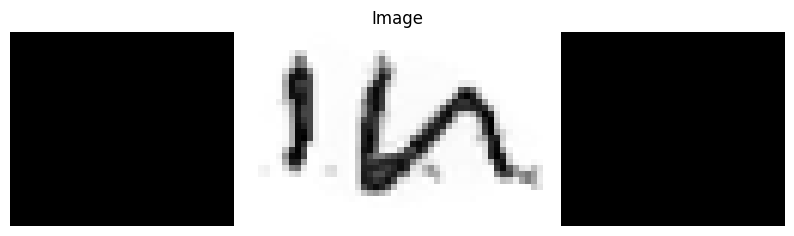

[2024/05/17 18:59:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01743769645690918
[2024/05/17 18:59:07] ppocr DEBUG: cls num  : 1, elapsed : 0.013895988464355469
[2024/05/17 18:59:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07638096809387207
Recognized text: He, Probability: 0.757763147354126


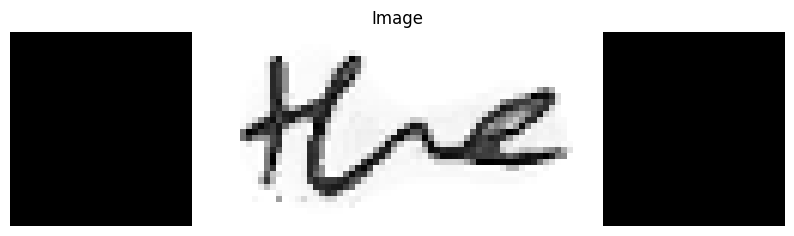

[2024/05/17 18:59:07] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02662491798400879
[2024/05/17 18:59:07] ppocr DEBUG: cls num  : 1, elapsed : 0.013831615447998047
[2024/05/17 18:59:07] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08320498466491699
Recognized text: dapan, Probability: 0.8945217132568359


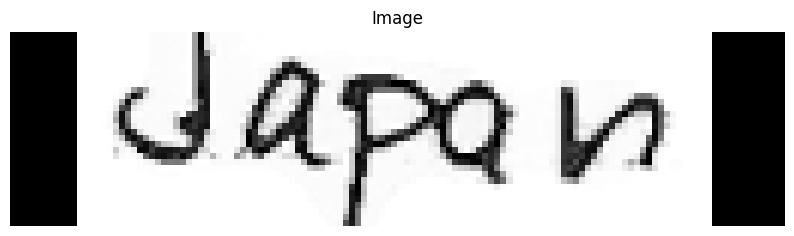

[2024/05/17 18:59:08] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.014480352401733398
[2024/05/17 18:59:08] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:08] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


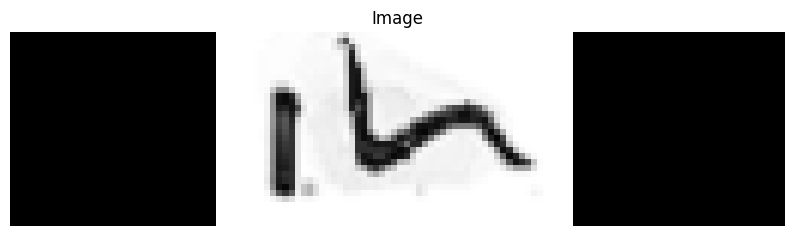

[2024/05/17 18:59:08] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02056288719177246
[2024/05/17 18:59:08] ppocr DEBUG: cls num  : 1, elapsed : 0.013673067092895508
[2024/05/17 18:59:08] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08433008193969727
Recognized text: dposno, Probability: 0.5862385630607605


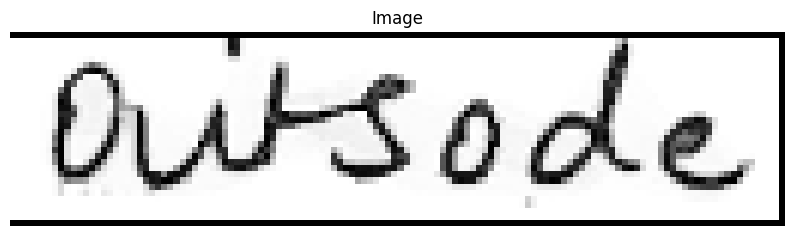

[2024/05/17 18:59:08] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024403810501098633
[2024/05/17 18:59:08] ppocr DEBUG: cls num  : 1, elapsed : 0.016386747360229492
[2024/05/17 18:59:08] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0867912769317627
Recognized text: Howover,, Probability: 0.8629859685897827


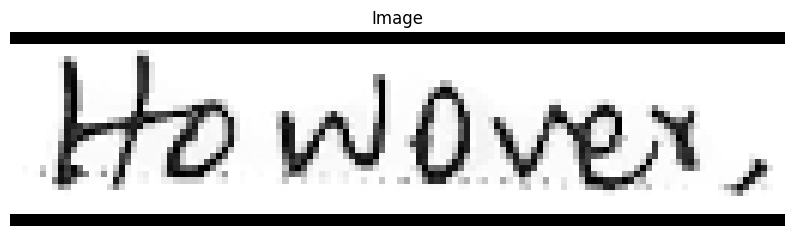

[2024/05/17 18:59:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020285606384277344
[2024/05/17 18:59:09] ppocr DEBUG: cls num  : 1, elapsed : 0.015201330184936523
[2024/05/17 18:59:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08340883255004883


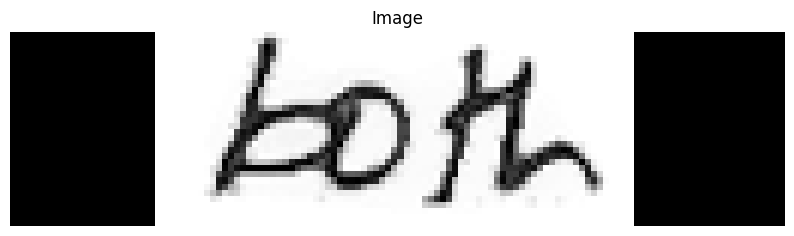

[2024/05/17 18:59:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026006698608398438
[2024/05/17 18:59:09] ppocr DEBUG: cls num  : 1, elapsed : 0.016345500946044922
[2024/05/17 18:59:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0820918083190918
Recognized text: Was, Probability: 0.6552011966705322


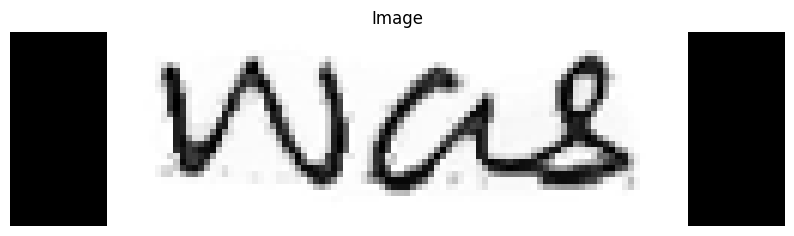

[2024/05/17 18:59:09] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019347429275512695
[2024/05/17 18:59:09] ppocr DEBUG: cls num  : 1, elapsed : 0.013846397399902344
[2024/05/17 18:59:09] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08341312408447266
Recognized text: Beni, Probability: 0.943614661693573


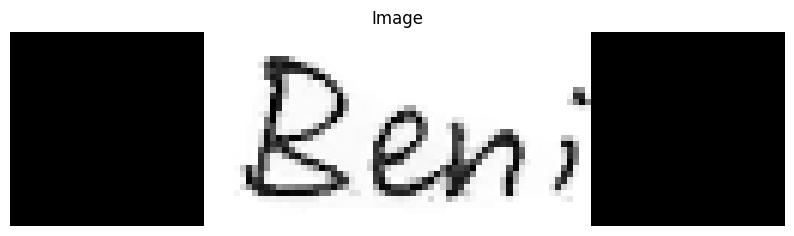

[2024/05/17 18:59:10] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019221782684326172
[2024/05/17 18:59:10] ppocr DEBUG: cls num  : 1, elapsed : 0.016700267791748047
[2024/05/17 18:59:10] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07589054107666016
Recognized text: impotanee, Probability: 0.9409872889518738


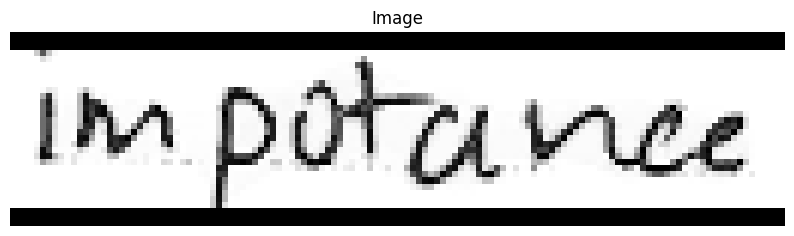

[2024/05/17 18:59:10] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0203855037689209
[2024/05/17 18:59:10] ppocr DEBUG: cls num  : 1, elapsed : 0.012650728225708008
[2024/05/17 18:59:10] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10412859916687012
Recognized text: apos, Probability: 0.5587185025215149


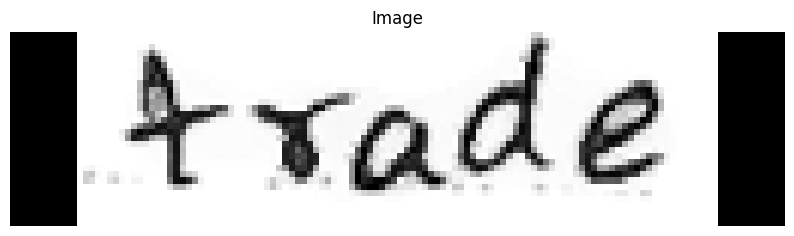

[2024/05/17 18:59:10] ppocr DEBUG: dt_boxes num : 3, elapsed : 0.020231008529663086
[2024/05/17 18:59:10] ppocr DEBUG: cls num  : 3, elapsed : 0.01772594451904297
[2024/05/17 18:59:10] ppocr DEBUG: rec_res num  : 3, elapsed : 0.1988227367401123
Recognized text: bab, Probability: 0.5853047370910645
Recognized text: inid, Probability: 0.7726042866706848
Recognized text: aa, Probability: 0.5680109858512878


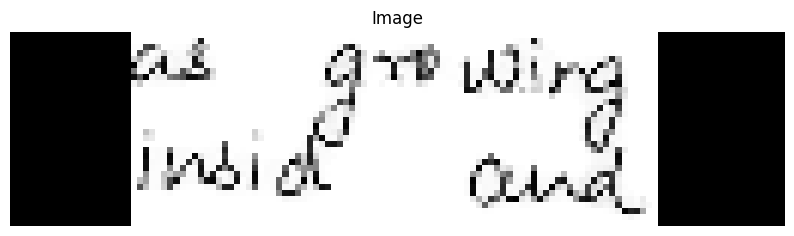

[2024/05/17 18:59:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02564263343811035
[2024/05/17 18:59:11] ppocr DEBUG: cls num  : 1, elapsed : 0.021676063537597656
[2024/05/17 18:59:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09571146965026855
Recognized text: Korea, Probability: 0.7425568103790283


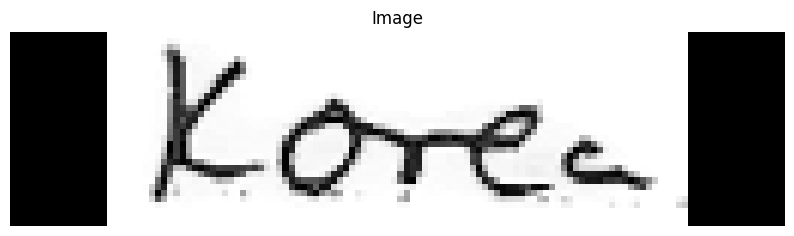

[2024/05/17 18:59:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03271055221557617
[2024/05/17 18:59:11] ppocr DEBUG: cls num  : 1, elapsed : 0.021649599075317383
[2024/05/17 18:59:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09104418754577637
Recognized text: wit, Probability: 0.7359607815742493


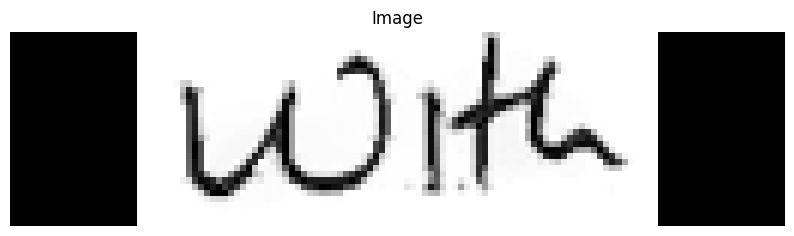

[2024/05/17 18:59:11] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02080559730529785
[2024/05/17 18:59:11] ppocr DEBUG: cls num  : 1, elapsed : 0.0178220272064209
[2024/05/17 18:59:11] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1053311824798584
Recognized text: diplomatie, Probability: 0.8655503392219543


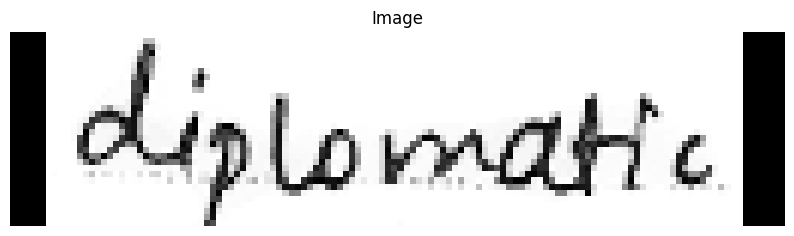

[2024/05/17 18:59:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.026682138442993164
[2024/05/17 18:59:12] ppocr DEBUG: cls num  : 1, elapsed : 0.019341230392456055
[2024/05/17 18:59:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09719729423522949
Recognized text: also, Probability: 0.8443198204040527


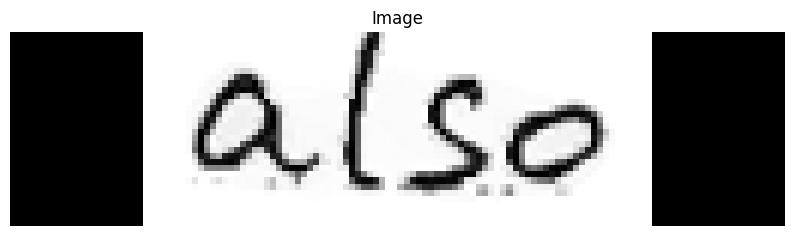

[2024/05/17 18:59:12] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02265644073486328
[2024/05/17 18:59:12] ppocr DEBUG: cls num  : 1, elapsed : 0.01578068733215332
[2024/05/17 18:59:12] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08968257904052734


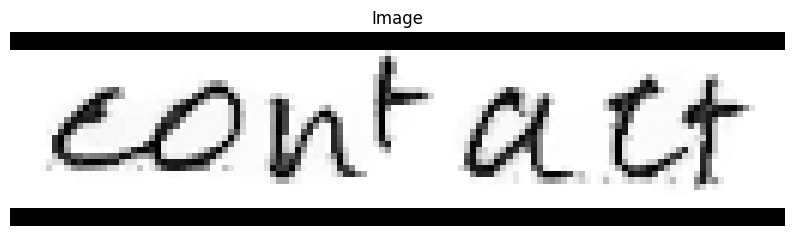

[2024/05/17 18:59:12] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02140355110168457
[2024/05/17 18:59:12] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:12] ppocr DEBUG: rec_res num  : 0, elapsed : 4.291534423828125e-06


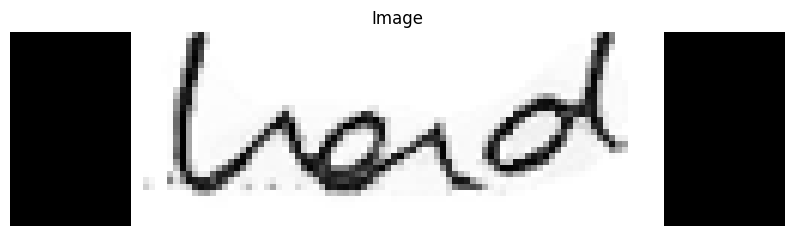

[2024/05/17 18:59:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03365135192871094
[2024/05/17 18:59:13] ppocr DEBUG: cls num  : 1, elapsed : 0.02244257926940918
[2024/05/17 18:59:13] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08792257308959961
Recognized text: myl, Probability: 0.5488248467445374


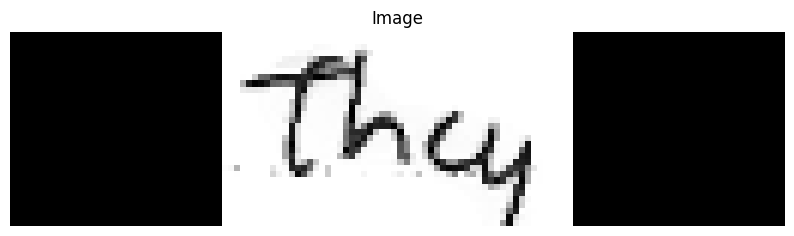

[2024/05/17 18:59:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023789405822753906
[2024/05/17 18:59:13] ppocr DEBUG: cls num  : 1, elapsed : 0.0283505916595459
[2024/05/17 18:59:13] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10133767127990723
Recognized text: with, Probability: 0.7569133043289185


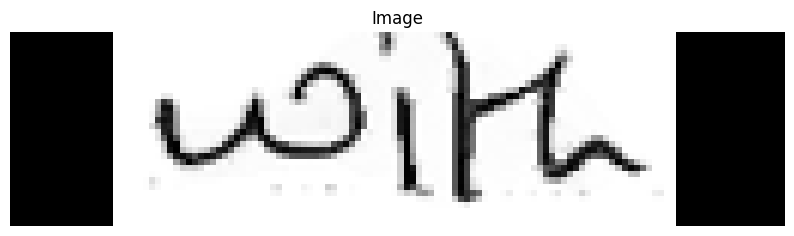

[2024/05/17 18:59:13] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.030143022537231445
[2024/05/17 18:59:13] ppocr DEBUG: cls num  : 1, elapsed : 0.015475273132324219
[2024/05/17 18:59:14] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09196257591247559
Recognized text: of, Probability: 0.9556344747543335


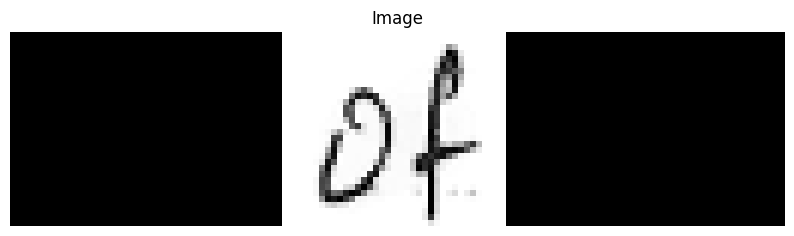

[2024/05/17 18:59:14] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023582935333251953
[2024/05/17 18:59:14] ppocr DEBUG: cls num  : 1, elapsed : 0.01610875129699707
[2024/05/17 18:59:14] ppocr DEBUG: rec_res num  : 1, elapsed : 0.12855005264282227
Recognized text: Mer, Probability: 0.7563325762748718


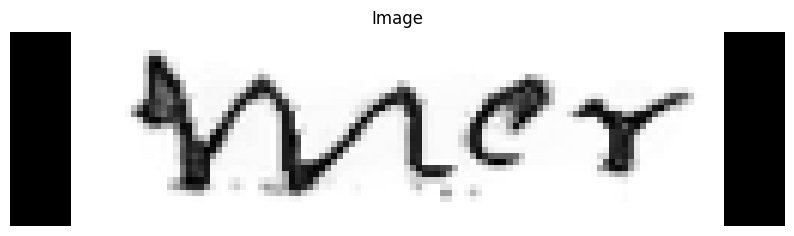

[2024/05/17 18:59:14] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.04111766815185547
[2024/05/17 18:59:14] ppocr DEBUG: cls num  : 1, elapsed : 0.019134044647216797
[2024/05/17 18:59:14] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0876920223236084
Recognized text: mdonesia, Probability: 0.9307225942611694


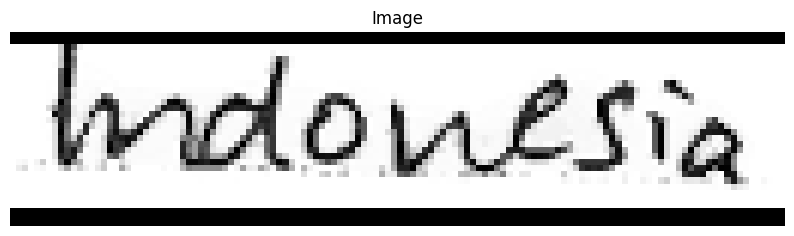

[2024/05/17 18:59:14] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03258371353149414
[2024/05/17 18:59:14] ppocr DEBUG: cls num  : 1, elapsed : 0.023190736770629883
[2024/05/17 18:59:15] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08663320541381836
Recognized text: chants, Probability: 0.8806014060974121


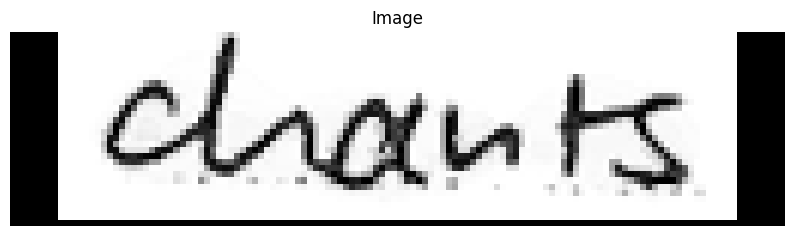

[2024/05/17 18:59:15] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024723529815673828
[2024/05/17 18:59:15] ppocr DEBUG: cls num  : 1, elapsed : 0.01505899429321289
[2024/05/17 18:59:15] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1013345718383789
Recognized text: Mmq, Probability: 0.6948928833007812


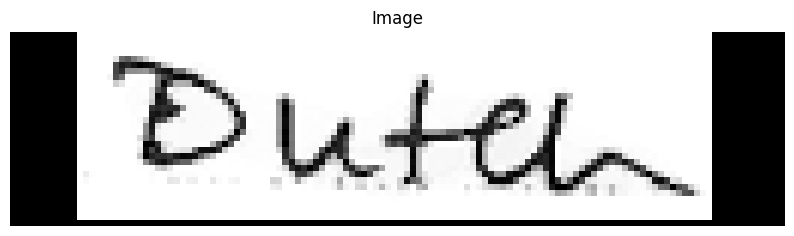

[2024/05/17 18:59:15] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020857572555541992
[2024/05/17 18:59:15] ppocr DEBUG: cls num  : 1, elapsed : 0.012892723083496094
[2024/05/17 18:59:15] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09484314918518066
Recognized text: wih, Probability: 0.6225224137306213


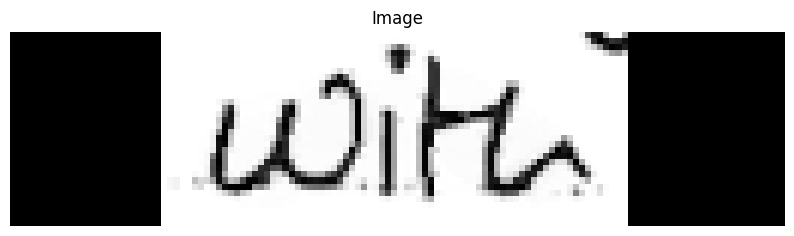

[2024/05/17 18:59:15] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027002334594726562
[2024/05/17 18:59:16] ppocr DEBUG: cls num  : 1, elapsed : 0.01735067367553711
[2024/05/17 18:59:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.12349081039428711
Recognized text: cnd, Probability: 0.871853768825531


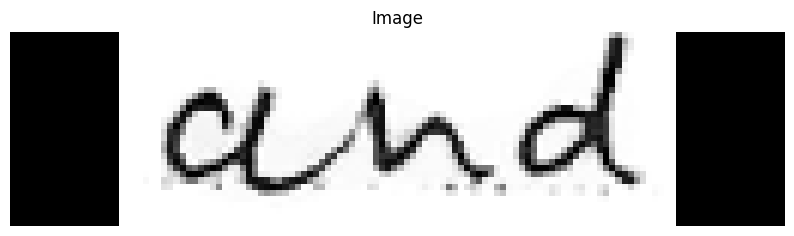

[2024/05/17 18:59:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.024819612503051758
[2024/05/17 18:59:16] ppocr DEBUG: cls num  : 1, elapsed : 0.01623821258544922
[2024/05/17 18:59:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10406780242919922
Recognized text: Made, Probability: 0.7370120286941528


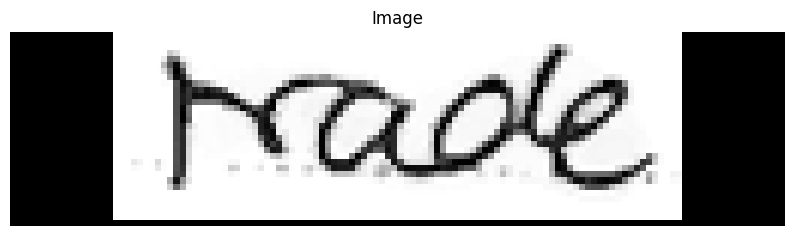

[2024/05/17 18:59:16] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018500804901123047
[2024/05/17 18:59:16] ppocr DEBUG: cls num  : 1, elapsed : 0.014004707336425781
[2024/05/17 18:59:16] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10442185401916504
Recognized text: China, Probability: 0.93730229139328


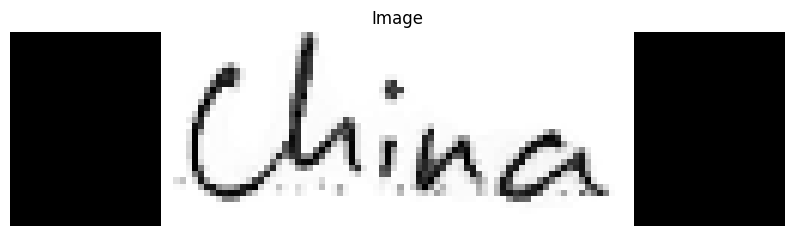

[2024/05/17 18:59:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025986909866333008
[2024/05/17 18:59:17] ppocr DEBUG: cls num  : 1, elapsed : 0.01761317253112793
[2024/05/17 18:59:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08961820602416992
Recognized text: tD, Probability: 0.6459851861000061


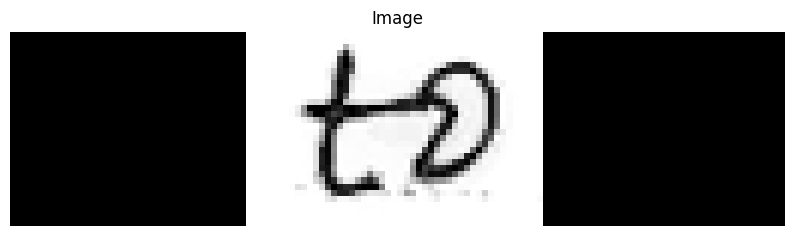

[2024/05/17 18:59:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027477502822875977
[2024/05/17 18:59:17] ppocr DEBUG: cls num  : 1, elapsed : 0.016077756881713867
[2024/05/17 18:59:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09122705459594727


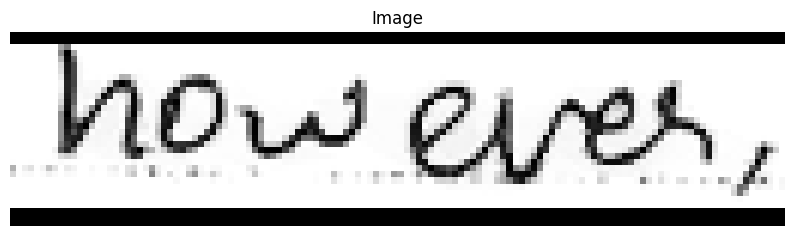

[2024/05/17 18:59:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02231574058532715
[2024/05/17 18:59:17] ppocr DEBUG: cls num  : 1, elapsed : 0.015534162521362305
[2024/05/17 18:59:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08922004699707031
Recognized text: coutimed, Probability: 0.6668758392333984


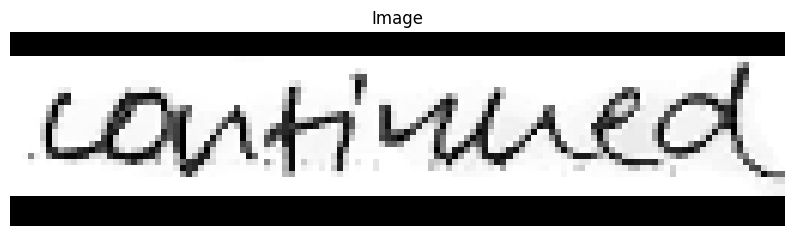

[2024/05/17 18:59:18] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01761603355407715
[2024/05/17 18:59:18] ppocr DEBUG: cls num  : 1, elapsed : 0.013181209564208984
[2024/05/17 18:59:18] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08083701133728027
Recognized text: isolation, Probability: 0.8572614192962646


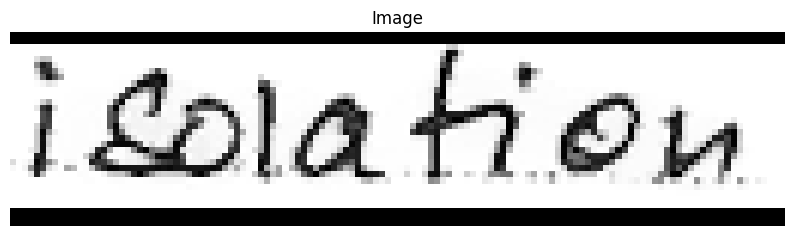

[2024/05/17 18:59:18] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.020184040069580078
[2024/05/17 18:59:18] ppocr DEBUG: cls num  : 2, elapsed : 0.017870187759399414
[2024/05/17 18:59:18] ppocr DEBUG: rec_res num  : 2, elapsed : 0.14002370834350586
Recognized text: muL, Probability: 0.5959143042564392
Recognized text: a, Probability: 0.47466397285461426


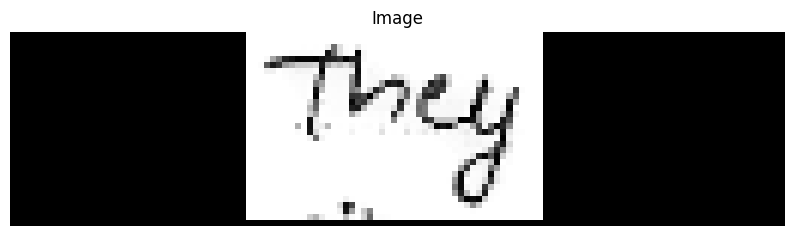

[2024/05/17 18:59:18] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019197940826416016
[2024/05/17 18:59:18] ppocr DEBUG: cls num  : 1, elapsed : 0.0138092041015625
[2024/05/17 18:59:18] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07964468002319336
Recognized text: f, Probability: 0.7862598299980164


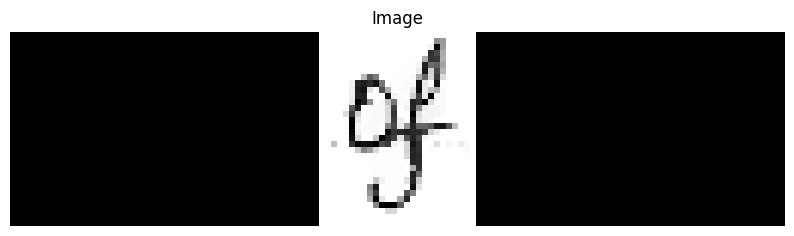

[2024/05/17 18:59:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02339005470275879
[2024/05/17 18:59:19] ppocr DEBUG: cls num  : 1, elapsed : 0.0203249454498291
[2024/05/17 18:59:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10326766967773438
Recognized text: time, Probability: 0.8982700109481812


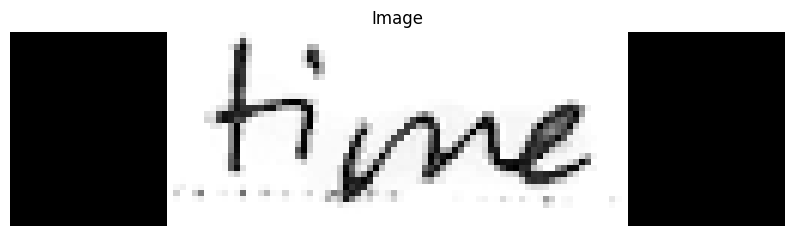

[2024/05/17 18:59:19] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02582693099975586
[2024/05/17 18:59:19] ppocr DEBUG: cls num  : 1, elapsed : 0.016498565673828125
[2024/05/17 18:59:19] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0974879264831543
Recognized text: woxa, Probability: 0.47417789697647095


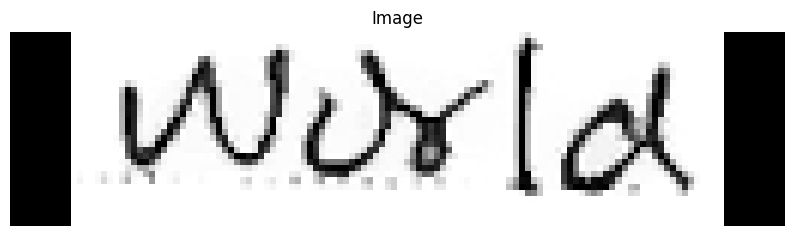

[2024/05/17 18:59:19] ppocr DEBUG: dt_boxes num : 2, elapsed : 0.018196582794189453
[2024/05/17 18:59:19] ppocr DEBUG: cls num  : 2, elapsed : 0.015056848526000977
[2024/05/17 18:59:20] ppocr DEBUG: rec_res num  : 2, elapsed : 0.13364696502685547
Recognized text: during, Probability: 0.9385066032409668


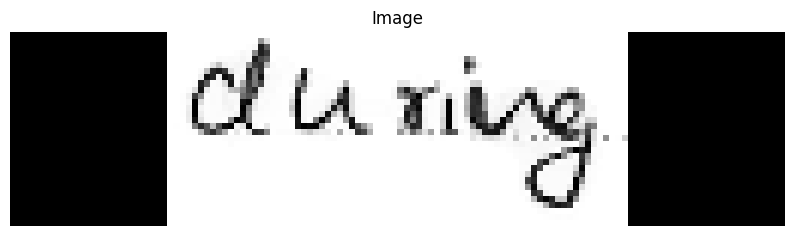

[2024/05/17 18:59:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023865938186645508
[2024/05/17 18:59:20] ppocr DEBUG: cls num  : 1, elapsed : 0.012921333312988281
[2024/05/17 18:59:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09699487686157227
Recognized text: this, Probability: 0.8589364290237427


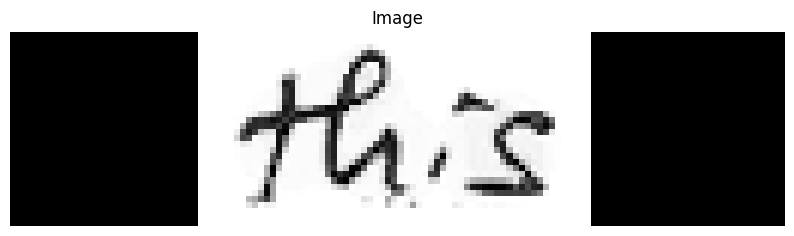

[2024/05/17 18:59:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018254995346069336
[2024/05/17 18:59:20] ppocr DEBUG: cls num  : 1, elapsed : 0.012880325317382812
[2024/05/17 18:59:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07848286628723145
Recognized text: Inoustrialized., Probability: 0.8962962031364441


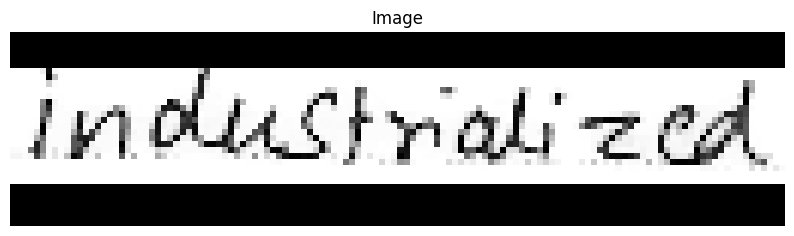

[2024/05/17 18:59:20] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02206563949584961
[2024/05/17 18:59:20] ppocr DEBUG: cls num  : 1, elapsed : 0.01704096794128418
[2024/05/17 18:59:20] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07733917236328125
Recognized text: wH, Probability: 0.38462477922439575


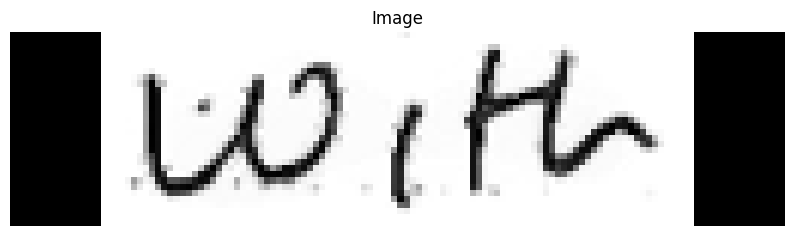

[2024/05/17 18:59:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01870107650756836
[2024/05/17 18:59:21] ppocr DEBUG: cls num  : 1, elapsed : 0.012802600860595703
[2024/05/17 18:59:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0890951156616211
Recognized text: the, Probability: 0.9554184079170227


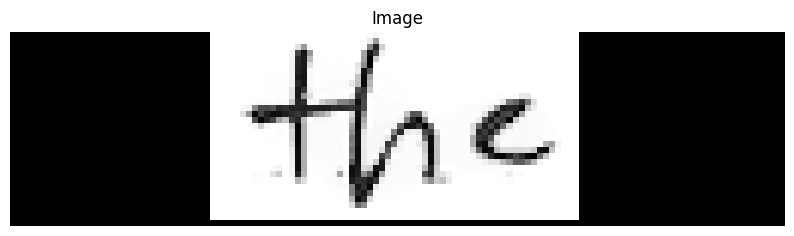

[2024/05/17 18:59:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02112269401550293
[2024/05/17 18:59:21] ppocr DEBUG: cls num  : 1, elapsed : 0.01424860954284668
[2024/05/17 18:59:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0804293155670166


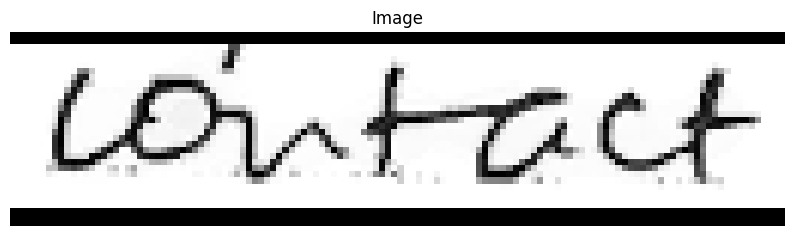

[2024/05/17 18:59:21] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0183413028717041
[2024/05/17 18:59:21] ppocr DEBUG: cls num  : 1, elapsed : 0.016076326370239258
[2024/05/17 18:59:21] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07944488525390625
Recognized text: LO, Probability: 0.34370219707489014


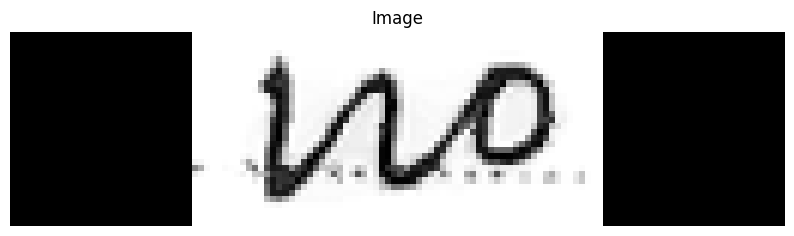

[2024/05/17 18:59:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01860332489013672
[2024/05/17 18:59:22] ppocr DEBUG: cls num  : 1, elapsed : 0.012765645980834961
[2024/05/17 18:59:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07981157302856445
Recognized text: alnost, Probability: 0.5898001790046692


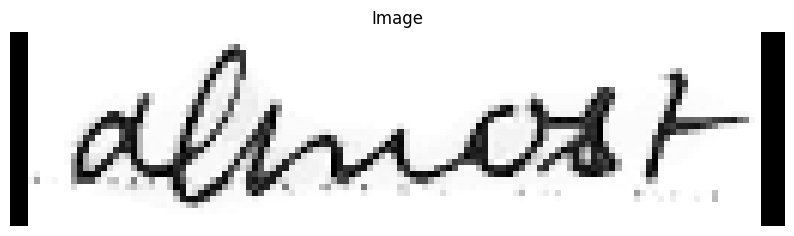

[2024/05/17 18:59:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017622947692871094
[2024/05/17 18:59:22] ppocr DEBUG: cls num  : 1, elapsed : 0.01526498794555664
[2024/05/17 18:59:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08200263977050781
Recognized text: had, Probability: 0.9103211760520935


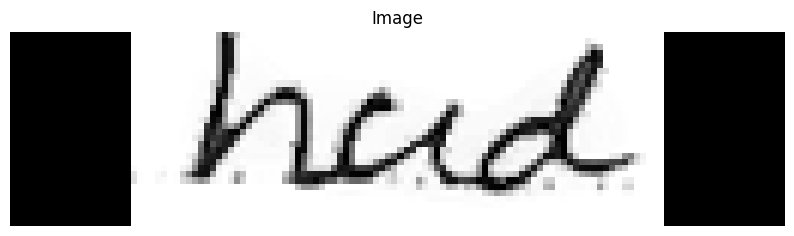

[2024/05/17 18:59:22] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019644498825073242
[2024/05/17 18:59:22] ppocr DEBUG: cls num  : 1, elapsed : 0.012761116027832031
[2024/05/17 18:59:22] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07722616195678711
Recognized text: ML, Probability: 0.40916165709495544


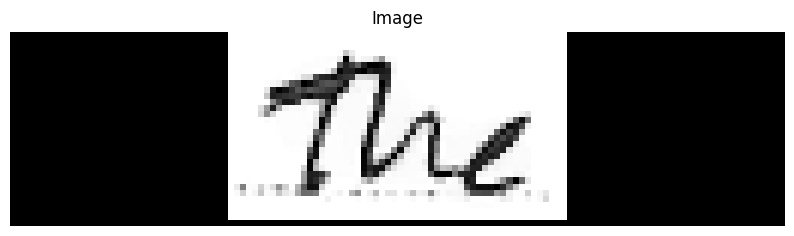

[2024/05/17 18:59:23] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020069599151611328
[2024/05/17 18:59:23] ppocr DEBUG: cls num  : 1, elapsed : 0.01436758041381836
[2024/05/17 18:59:23] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07935905456542969
Recognized text: Japanee, Probability: 0.9336825609207153


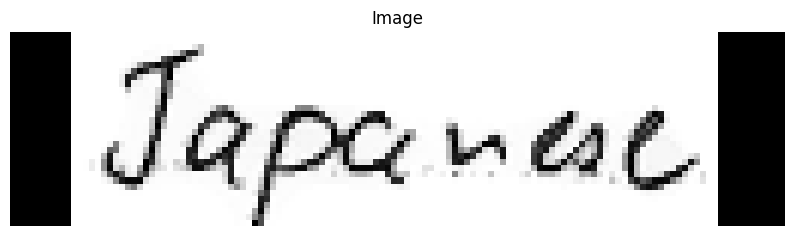

[2024/05/17 18:59:23] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01816248893737793
[2024/05/17 18:59:23] ppocr DEBUG: cls num  : 1, elapsed : 0.018291711807250977
[2024/05/17 18:59:23] ppocr DEBUG: rec_res num  : 1, elapsed : 0.11886453628540039
Recognized text: Monday, Probability: 0.9985899329185486


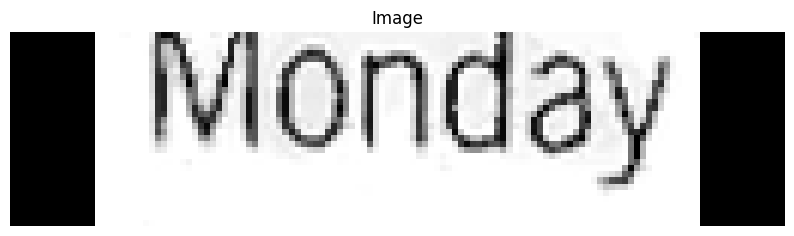

[2024/05/17 18:59:23] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02151656150817871
[2024/05/17 18:59:23] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:23] ppocr DEBUG: rec_res num  : 0, elapsed : 5.0067901611328125e-06


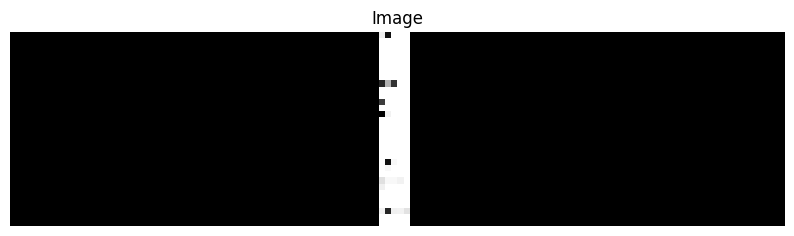

[2024/05/17 18:59:23] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022254467010498047
[2024/05/17 18:59:23] ppocr DEBUG: cls num  : 1, elapsed : 0.015057086944580078
[2024/05/17 18:59:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08330249786376953
Recognized text: no, Probability: 0.8379573822021484


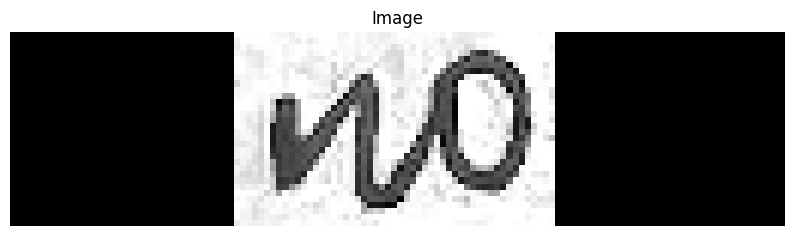

[2024/05/17 18:59:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017836570739746094
[2024/05/17 18:59:24] ppocr DEBUG: cls num  : 1, elapsed : 0.01869940757751465
[2024/05/17 18:59:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07806682586669922
Recognized text: t, Probability: 0.990835428237915


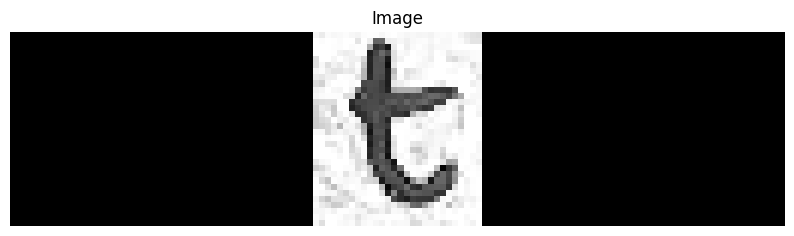

[2024/05/17 18:59:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021448135375976562
[2024/05/17 18:59:24] ppocr DEBUG: cls num  : 1, elapsed : 0.013622283935546875
[2024/05/17 18:59:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0811920166015625
Recognized text: conpletely, Probability: 0.9130318760871887


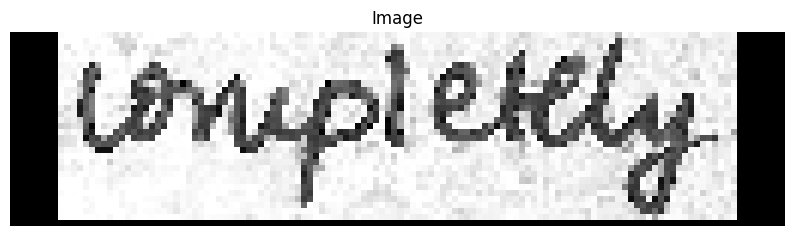

[2024/05/17 18:59:24] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01726078987121582
[2024/05/17 18:59:24] ppocr DEBUG: cls num  : 1, elapsed : 0.01603555679321289
[2024/05/17 18:59:24] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08709859848022461
Recognized text: disor, Probability: 0.9089438319206238


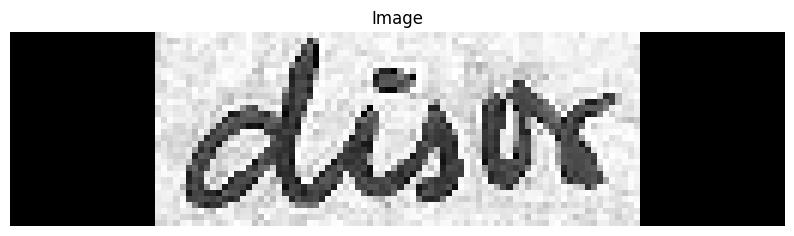

[2024/05/17 18:59:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016349315643310547
[2024/05/17 18:59:25] ppocr DEBUG: cls num  : 1, elapsed : 0.016353130340576172
[2024/05/17 18:59:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07619404792785645
Recognized text: dered, Probability: 0.9942271113395691


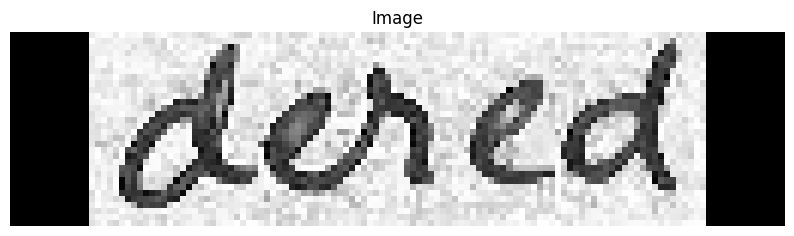

[2024/05/17 18:59:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017169952392578125
[2024/05/17 18:59:25] ppocr DEBUG: cls num  : 1, elapsed : 0.016018390655517578
[2024/05/17 18:59:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07887005805969238
Recognized text: C, Probability: 0.6057524085044861


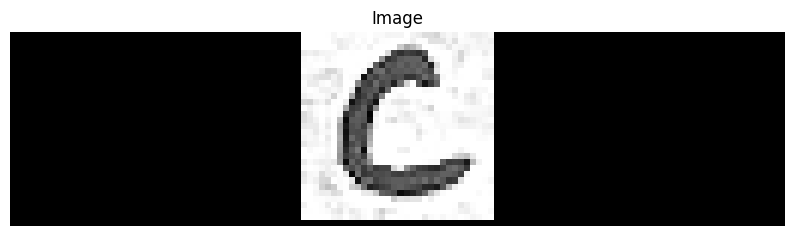

[2024/05/17 18:59:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01957535743713379
[2024/05/17 18:59:25] ppocr DEBUG: cls num  : 1, elapsed : 0.012468338012695312
[2024/05/17 18:59:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07431221008300781


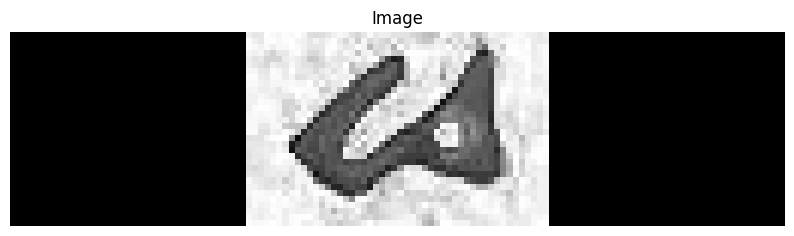

[2024/05/17 18:59:25] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01700139045715332
[2024/05/17 18:59:25] ppocr DEBUG: cls num  : 1, elapsed : 0.012385368347167969
[2024/05/17 18:59:25] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08074736595153809
Recognized text: the, Probability: 0.8493461012840271


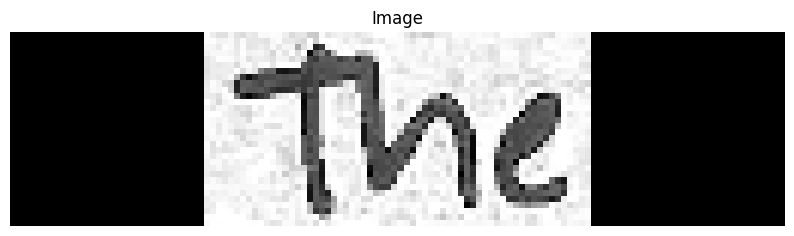

[2024/05/17 18:59:26] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.019608497619628906
[2024/05/17 18:59:26] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:26] ppocr DEBUG: rec_res num  : 0, elapsed : 4.5299530029296875e-06


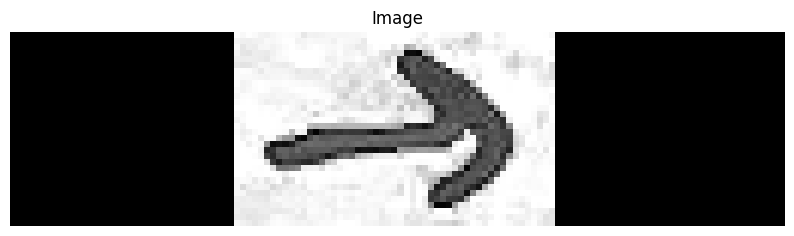

[2024/05/17 18:59:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016036272048950195
[2024/05/17 18:59:26] ppocr DEBUG: cls num  : 1, elapsed : 0.013030052185058594
[2024/05/17 18:59:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08831977844238281
Recognized text: auors, Probability: 0.5478845238685608


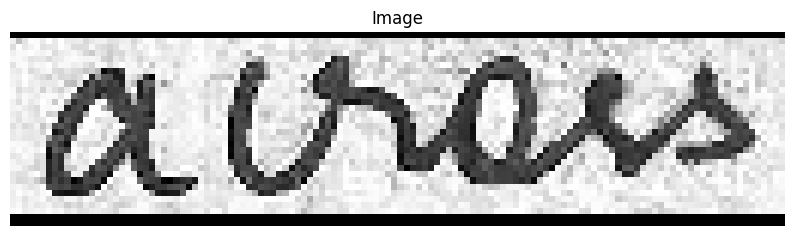

[2024/05/17 18:59:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01779007911682129
[2024/05/17 18:59:26] ppocr DEBUG: cls num  : 1, elapsed : 0.01296234130859375
[2024/05/17 18:59:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08457660675048828
Recognized text: ouomi, Probability: 0.6594777703285217


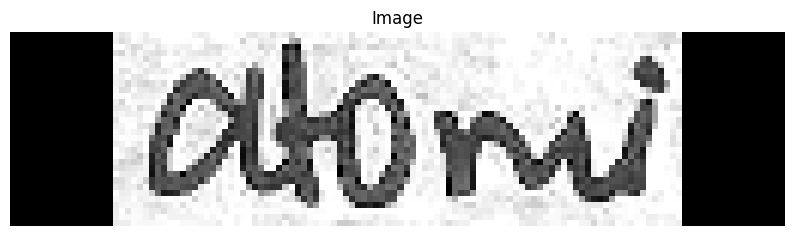

[2024/05/17 18:59:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01896190643310547
[2024/05/17 18:59:27] ppocr DEBUG: cls num  : 1, elapsed : 0.013939857482910156
[2024/05/17 18:59:27] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09452033042907715
Recognized text: bondarie, Probability: 0.7977434396743774


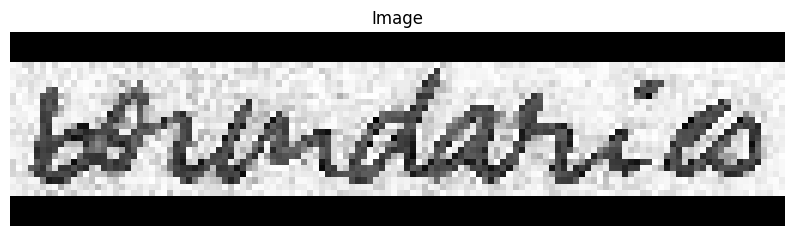

[2024/05/17 18:59:27] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020528316497802734
[2024/05/17 18:59:27] ppocr DEBUG: cls num  : 1, elapsed : 0.018312931060791016
[2024/05/17 18:59:27] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08507204055786133
Recognized text: intrphase, Probability: 0.9689953923225403


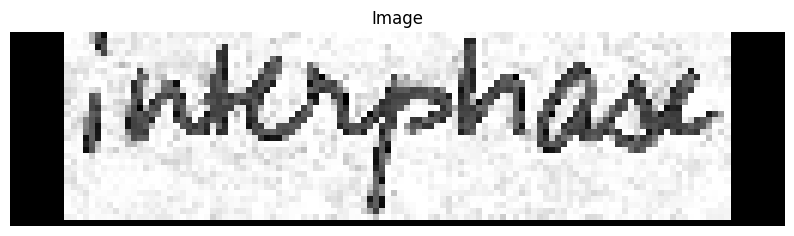

[2024/05/17 18:59:27] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02241206169128418
[2024/05/17 18:59:27] ppocr DEBUG: cls num  : 1, elapsed : 0.015161514282226562
[2024/05/17 18:59:27] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0830545425415039
Recognized text: munbnosy, Probability: 0.4269130825996399


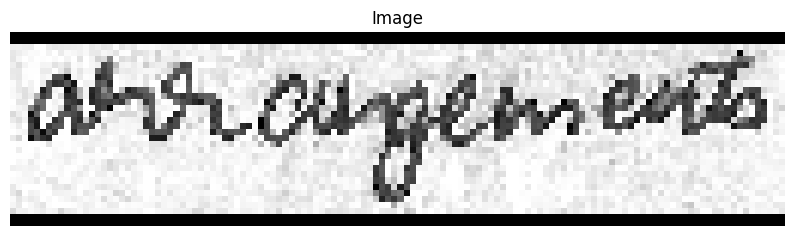

[2024/05/17 18:59:27] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01589059829711914
[2024/05/17 18:59:27] ppocr DEBUG: cls num  : 1, elapsed : 0.011978626251220703
[2024/05/17 18:59:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07535791397094727


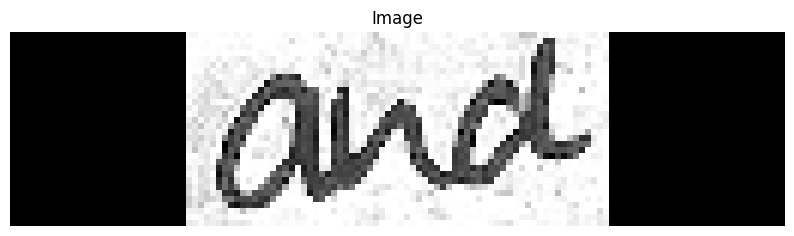

[2024/05/17 18:59:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022297143936157227
[2024/05/17 18:59:28] ppocr DEBUG: cls num  : 1, elapsed : 0.013014554977416992
[2024/05/17 18:59:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07841873168945312
Recognized text: by, Probability: 0.8307712078094482


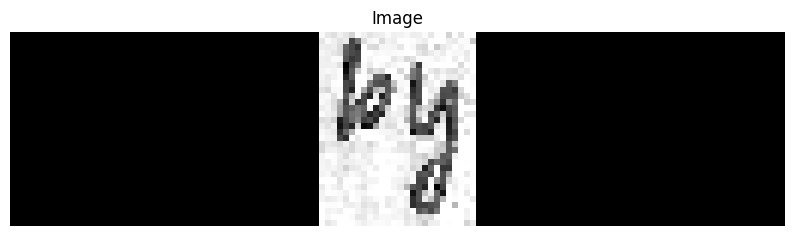

[2024/05/17 18:59:28] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016765356063842773
[2024/05/17 18:59:28] ppocr DEBUG: cls num  : 1, elapsed : 0.01816582679748535
[2024/05/17 18:59:28] ppocr DEBUG: rec_res num  : 1, elapsed : 0.28957223892211914
Recognized text: pant, Probability: 0.6801990866661072


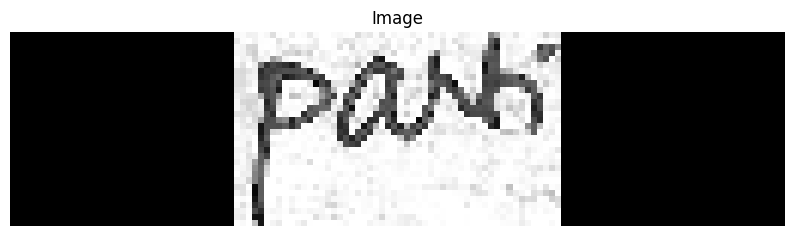

[2024/05/17 18:59:29] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.060304880142211914
[2024/05/17 18:59:29] ppocr DEBUG: cls num  : 1, elapsed : 0.07618284225463867
[2024/05/17 18:59:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.4111948013305664
Recognized text: boundatry, Probability: 0.8690800666809082


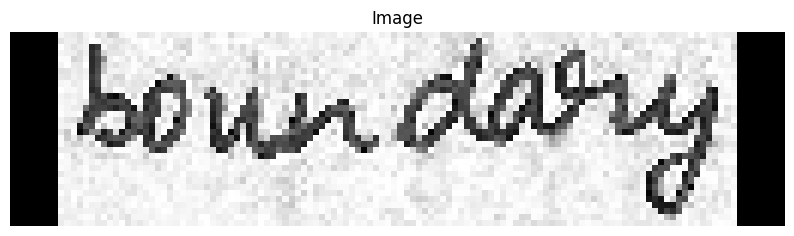

[2024/05/17 18:59:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019321203231811523
[2024/05/17 18:59:30] ppocr DEBUG: cls num  : 1, elapsed : 0.015111923217773438
[2024/05/17 18:59:30] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07509493827819824
Recognized text: matrin, Probability: 0.925312340259552


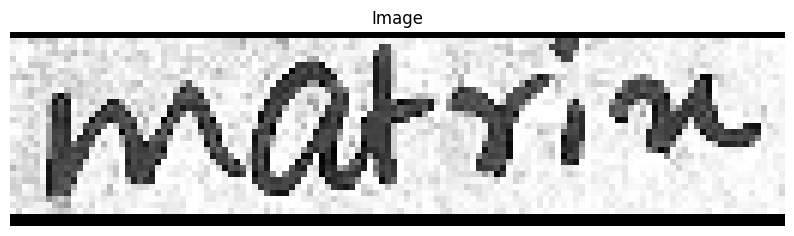

[2024/05/17 18:59:30] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025943994522094727
[2024/05/17 18:59:31] ppocr DEBUG: cls num  : 1, elapsed : 0.018004179000854492
[2024/05/17 18:59:31] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09530377388000488
Recognized text: Ns, Probability: 0.37204885482788086


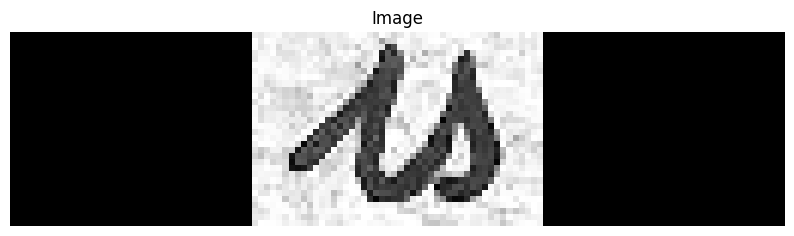

[2024/05/17 18:59:31] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019310474395751953
[2024/05/17 18:59:31] ppocr DEBUG: cls num  : 1, elapsed : 0.014246940612792969
[2024/05/17 18:59:31] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07873916625976562
Recognized text: olistocabions, Probability: 0.789465606212616


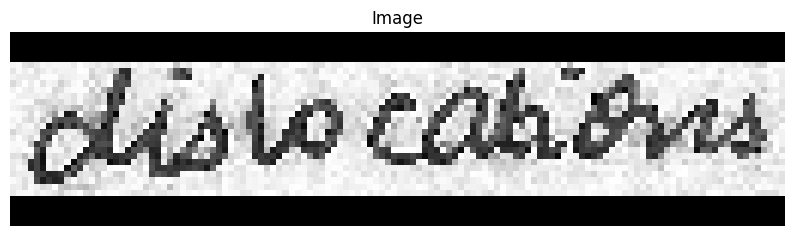

[2024/05/17 18:59:31] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028277873992919922
[2024/05/17 18:59:31] ppocr DEBUG: cls num  : 1, elapsed : 0.016239404678344727
[2024/05/17 18:59:31] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09116244316101074
Recognized text: Accomodated, Probability: 0.7889991998672485


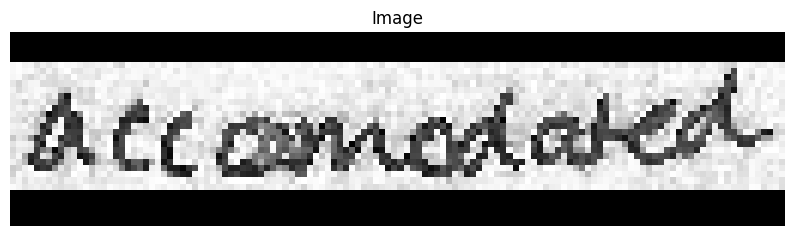

[2024/05/17 18:59:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02528667449951172
[2024/05/17 18:59:32] ppocr DEBUG: cls num  : 1, elapsed : 0.014988422393798828
[2024/05/17 18:59:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08968782424926758
Recognized text: de, Probability: 0.9618563652038574


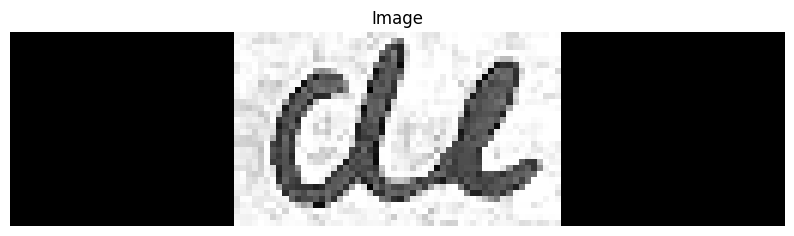

[2024/05/17 18:59:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.021052122116088867
[2024/05/17 18:59:32] ppocr DEBUG: cls num  : 1, elapsed : 0.016972780227661133
[2024/05/17 18:59:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07606387138366699
Recognized text: parsally, Probability: 0.9494093656539917


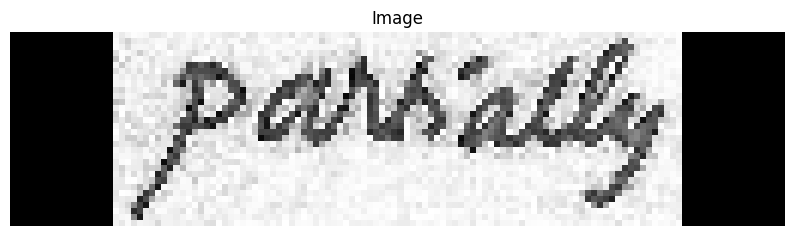

[2024/05/17 18:59:32] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.015883207321166992
[2024/05/17 18:59:32] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:32] ppocr DEBUG: rec_res num  : 0, elapsed : 3.814697265625e-06


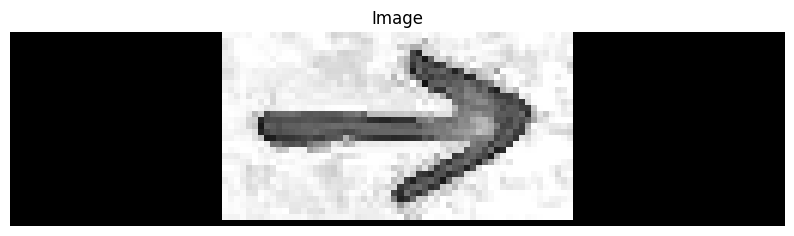

[2024/05/17 18:59:32] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.023963212966918945
[2024/05/17 18:59:32] ppocr DEBUG: cls num  : 1, elapsed : 0.02276325225830078
[2024/05/17 18:59:32] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0774993896484375


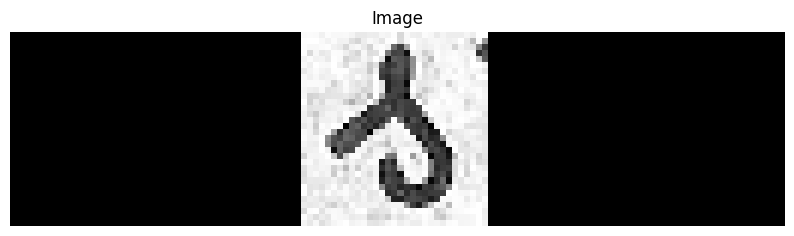

[2024/05/17 18:59:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03081345558166504
[2024/05/17 18:59:33] ppocr DEBUG: cls num  : 1, elapsed : 0.019894838333129883
[2024/05/17 18:59:33] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08485913276672363
Recognized text: Voume, Probability: 0.8527190089225769


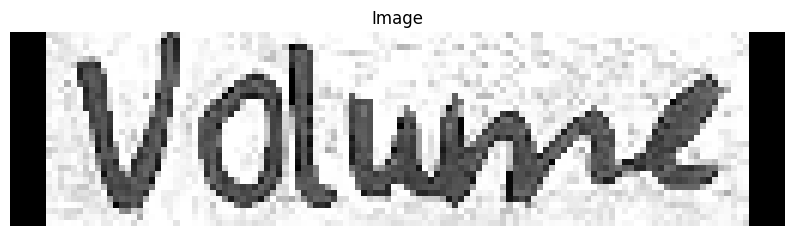

[2024/05/17 18:59:33] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022509098052978516
[2024/05/17 18:59:34] ppocr DEBUG: cls num  : 1, elapsed : 0.01599264144897461
[2024/05/17 18:59:34] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1187140941619873
Recognized text: ad, Probability: 0.982491672039032


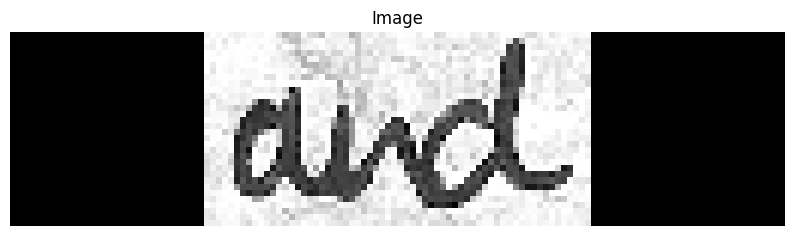

[2024/05/17 18:59:34] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02795886993408203
[2024/05/17 18:59:34] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:34] ppocr DEBUG: rec_res num  : 0, elapsed : 3.5762786865234375e-06


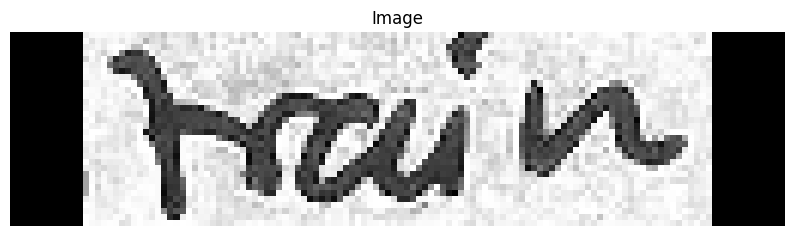

[2024/05/17 18:59:34] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.02616262435913086
[2024/05/17 18:59:34] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:34] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


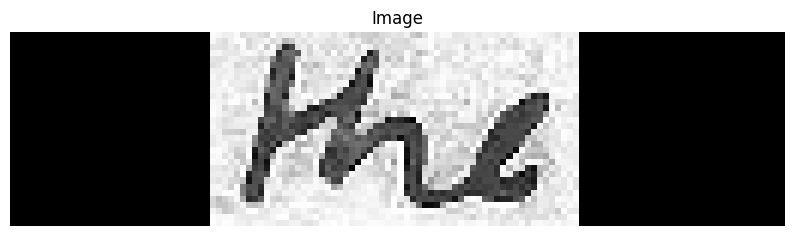

[2024/05/17 18:59:34] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.021568775177001953
[2024/05/17 18:59:34] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:34] ppocr DEBUG: rec_res num  : 0, elapsed : 4.291534423828125e-06


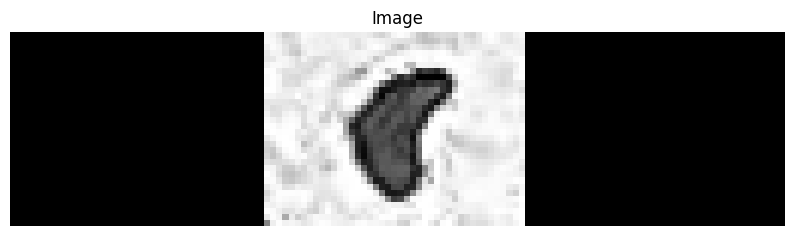

[2024/05/17 18:59:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02575230598449707
[2024/05/17 18:59:35] ppocr DEBUG: cls num  : 1, elapsed : 0.021147489547729492
[2024/05/17 18:59:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.1095132827758789
Recognized text: rence, Probability: 0.9205857515335083


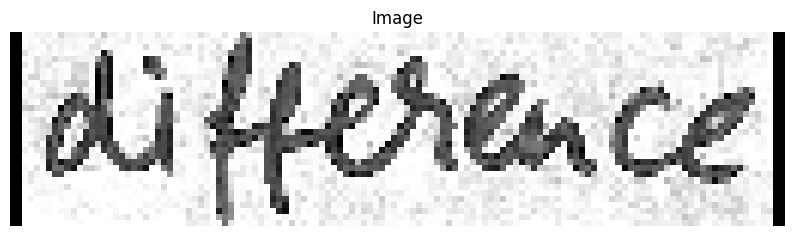

[2024/05/17 18:59:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03165006637573242
[2024/05/17 18:59:35] ppocr DEBUG: cls num  : 1, elapsed : 0.015059471130371094
[2024/05/17 18:59:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08800387382507324
Recognized text: the, Probability: 0.9949051737785339


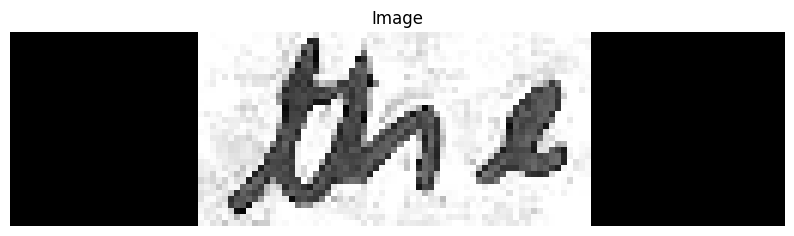

[2024/05/17 18:59:35] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.035681724548339844
[2024/05/17 18:59:35] ppocr DEBUG: cls num  : 1, elapsed : 0.01769566535949707
[2024/05/17 18:59:35] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10000443458557129
Recognized text: betwein, Probability: 0.873193621635437


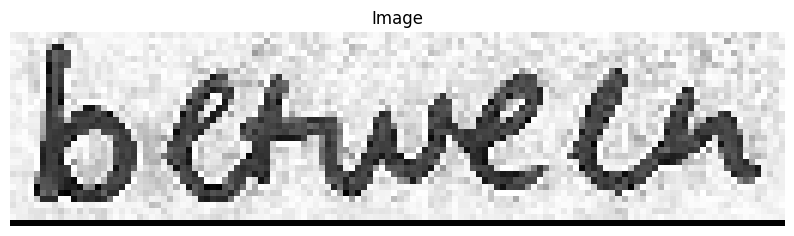

[2024/05/17 18:59:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022919178009033203
[2024/05/17 18:59:36] ppocr DEBUG: cls num  : 1, elapsed : 0.020398378372192383
[2024/05/17 18:59:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10612678527832031
Recognized text: Dlong, Probability: 0.7906668782234192


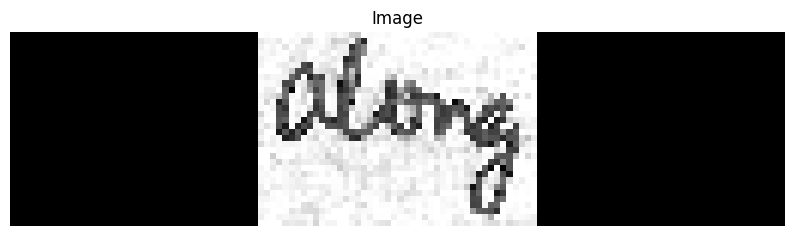

[2024/05/17 18:59:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029135942459106445
[2024/05/17 18:59:36] ppocr DEBUG: cls num  : 1, elapsed : 0.020235300064086914
[2024/05/17 18:59:36] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08881425857543945
Recognized text: by, Probability: 0.975576639175415


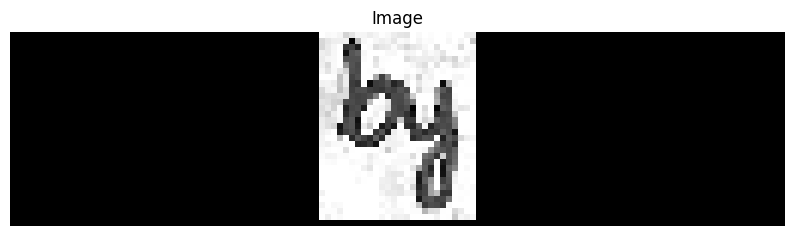

[2024/05/17 18:59:36] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.03761029243469238
[2024/05/17 18:59:36] ppocr DEBUG: cls num  : 1, elapsed : 0.019652843475341797
[2024/05/17 18:59:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09697771072387695
Recognized text: boundany, Probability: 0.7598217725753784


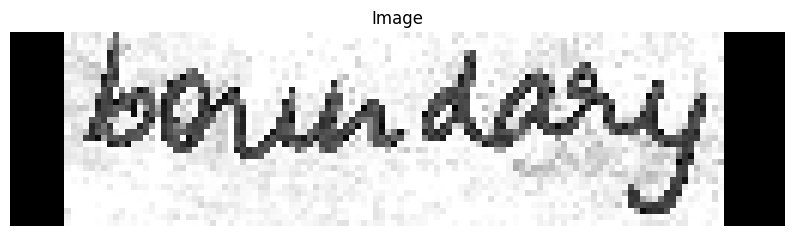

[2024/05/17 18:59:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.029955148696899414
[2024/05/17 18:59:37] ppocr DEBUG: cls num  : 1, elapsed : 0.017536640167236328
[2024/05/17 18:59:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08092880249023438
Recognized text: intoglucion, Probability: 0.7661814093589783


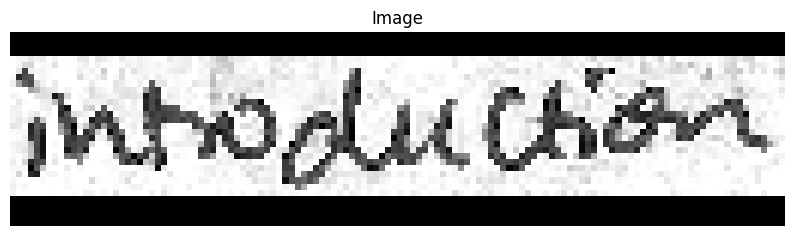

[2024/05/17 18:59:37] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02337360382080078
[2024/05/17 18:59:37] ppocr DEBUG: cls num  : 1, elapsed : 0.022873878479003906
[2024/05/17 18:59:37] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10234785079956055


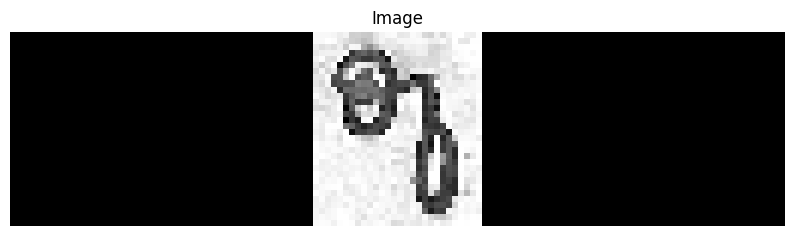

[2024/05/17 18:59:37] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.026959657669067383
[2024/05/17 18:59:37] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:37] ppocr DEBUG: rec_res num  : 0, elapsed : 2.6226043701171875e-06


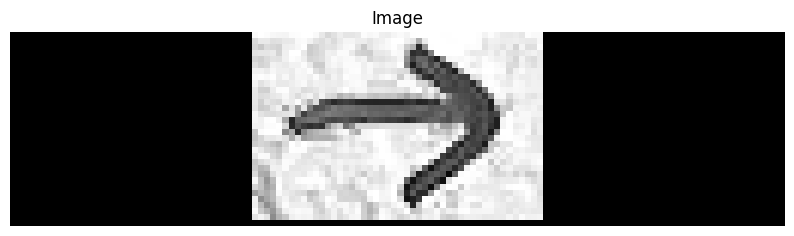

[2024/05/17 18:59:38] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.027551889419555664
[2024/05/17 18:59:38] ppocr DEBUG: cls num  : 1, elapsed : 0.01989912986755371
[2024/05/17 18:59:38] ppocr DEBUG: rec_res num  : 1, elapsed : 0.10690569877624512
Recognized text: periodic, Probability: 0.7913313508033752


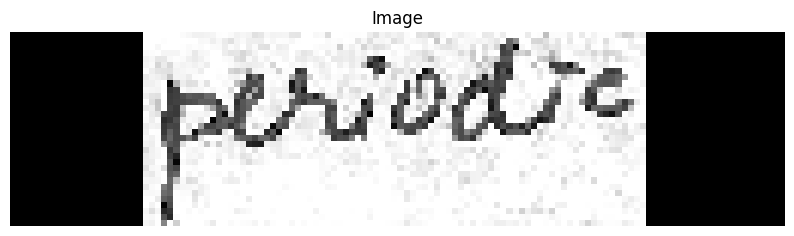

[2024/05/17 18:59:38] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02074909210205078
[2024/05/17 18:59:38] ppocr DEBUG: cls num  : 1, elapsed : 0.014300107955932617
[2024/05/17 18:59:38] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08573055267333984
Recognized text: diswcaiorrs, Probability: 0.8403270244598389


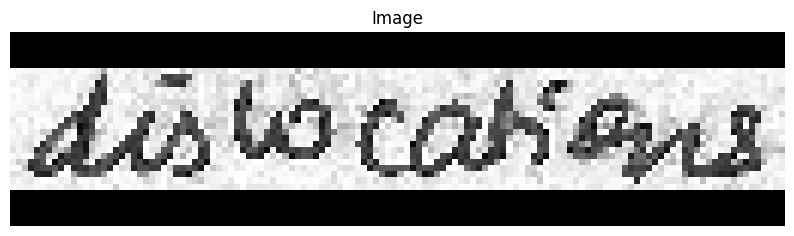

[2024/05/17 18:59:38] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01717400550842285
[2024/05/17 18:59:38] ppocr DEBUG: cls num  : 1, elapsed : 0.01288461685180664
[2024/05/17 18:59:38] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0831754207611084
Recognized text: conerenry, Probability: 0.9145129323005676


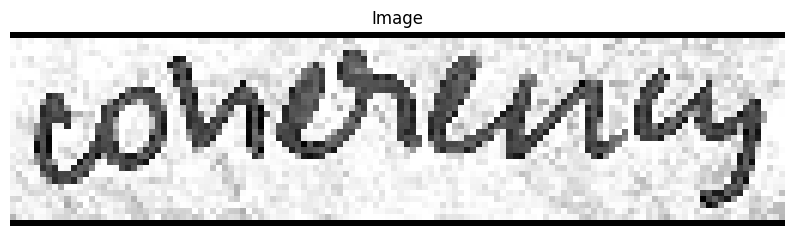

[2024/05/17 18:59:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017618417739868164
[2024/05/17 18:59:39] ppocr DEBUG: cls num  : 1, elapsed : 0.013038396835327148
[2024/05/17 18:59:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08421826362609863
Recognized text: Stons, Probability: 0.8056873083114624


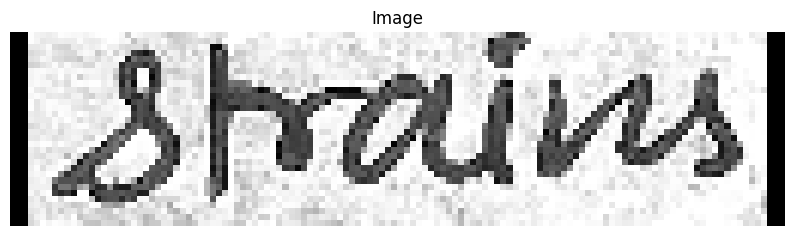

[2024/05/17 18:59:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025496482849121094
[2024/05/17 18:59:39] ppocr DEBUG: cls num  : 1, elapsed : 0.014584541320800781
[2024/05/17 18:59:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.087127685546875
Recognized text: are, Probability: 0.8575112223625183


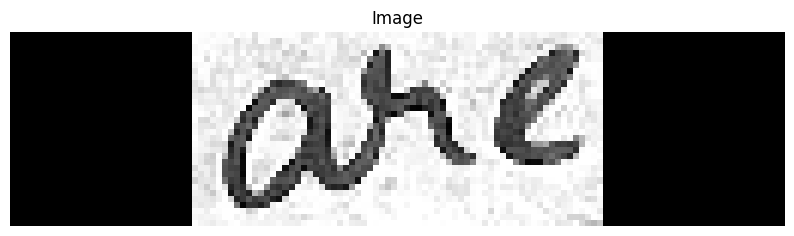

[2024/05/17 18:59:39] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020337581634521484
[2024/05/17 18:59:39] ppocr DEBUG: cls num  : 1, elapsed : 0.013761043548583984
[2024/05/17 18:59:39] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08150601387023926
Recognized text: eved, Probability: 0.8061823844909668


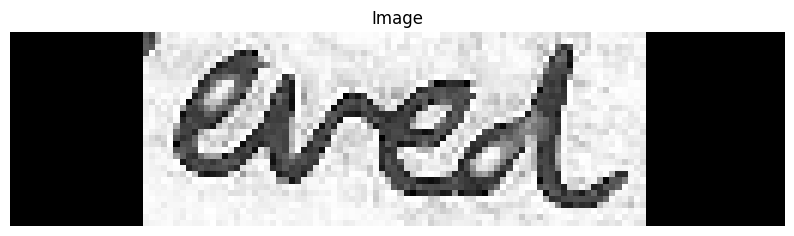

[2024/05/17 18:59:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018454790115356445
[2024/05/17 18:59:40] ppocr DEBUG: cls num  : 1, elapsed : 0.01256418228149414
[2024/05/17 18:59:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0839533805847168
Recognized text: cotall, Probability: 0.652401864528656


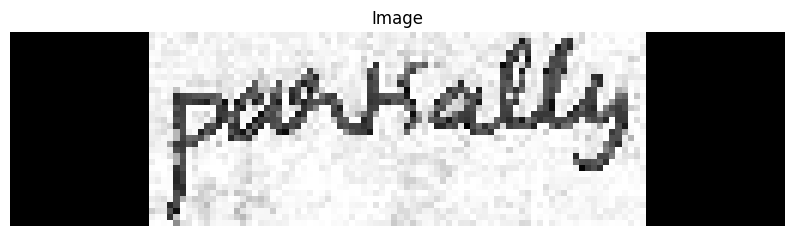

[2024/05/17 18:59:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.025287866592407227
[2024/05/17 18:59:40] ppocr DEBUG: cls num  : 1, elapsed : 0.014205455780029297
[2024/05/17 18:59:40] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0818028450012207
Recognized text: thriw, Probability: 0.9810537099838257


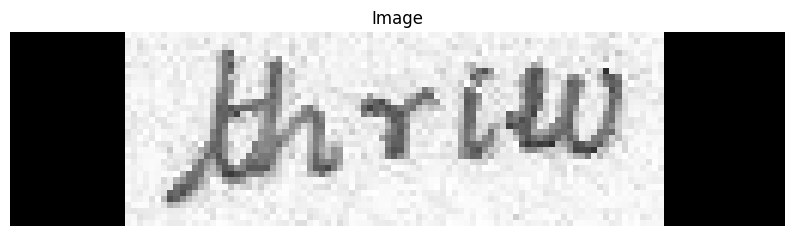

[2024/05/17 18:59:40] ppocr DEBUG: dt_boxes num : 0, elapsed : 0.020411968231201172
[2024/05/17 18:59:40] ppocr DEBUG: cls num  : 0, elapsed : 0
[2024/05/17 18:59:40] ppocr DEBUG: rec_res num  : 0, elapsed : 3.337860107421875e-06


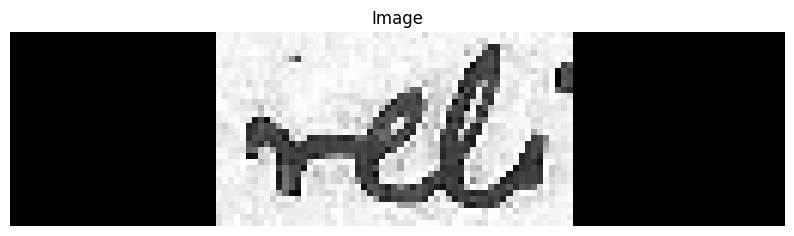

[2024/05/17 18:59:40] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0202791690826416
[2024/05/17 18:59:40] ppocr DEBUG: cls num  : 1, elapsed : 0.01512908935546875
[2024/05/17 18:59:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.0807042121887207
Recognized text: me, Probability: 0.9896836876869202


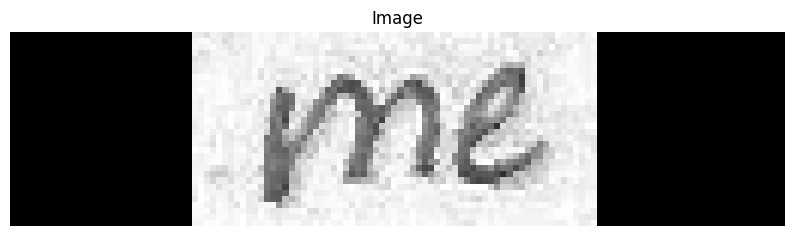

[2024/05/17 18:59:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022368192672729492
[2024/05/17 18:59:41] ppocr DEBUG: cls num  : 1, elapsed : 0.018508434295654297
[2024/05/17 18:59:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09288239479064941
Recognized text: shildowr, Probability: 0.8583054542541504


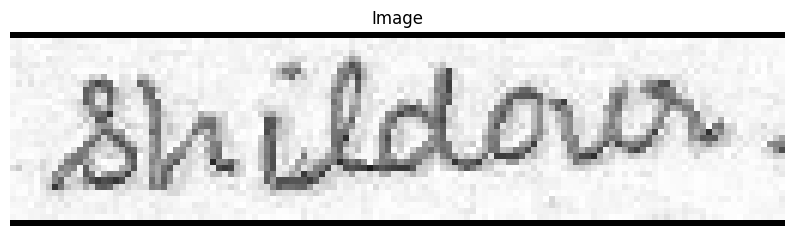

[2024/05/17 18:59:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018715858459472656
[2024/05/17 18:59:41] ppocr DEBUG: cls num  : 1, elapsed : 0.01298832893371582
[2024/05/17 18:59:41] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07929539680480957
Recognized text: over, Probability: 0.9713116884231567


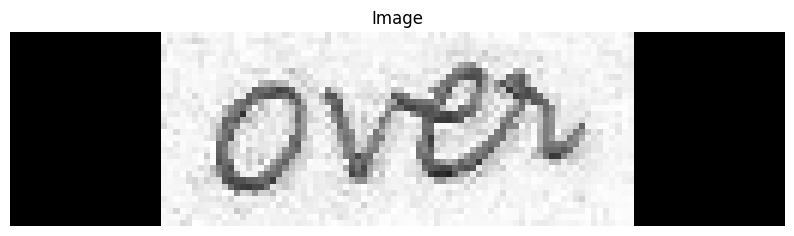

[2024/05/17 18:59:41] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018634796142578125
[2024/05/17 18:59:41] ppocr DEBUG: cls num  : 1, elapsed : 0.013238906860351562
[2024/05/17 18:59:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07734274864196777
Recognized text: farmer, Probability: 0.9035349488258362


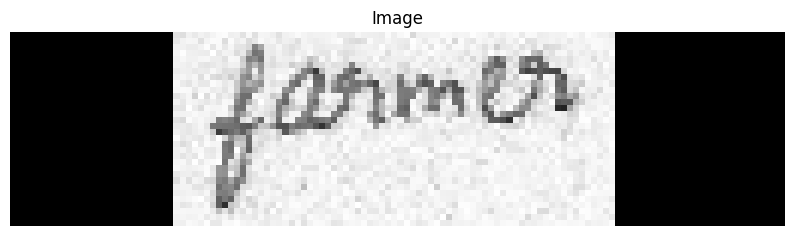

[2024/05/17 18:59:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.018011808395385742
[2024/05/17 18:59:42] ppocr DEBUG: cls num  : 1, elapsed : 0.013485908508300781
[2024/05/17 18:59:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07942032814025879
Recognized text: the, Probability: 0.9943479895591736


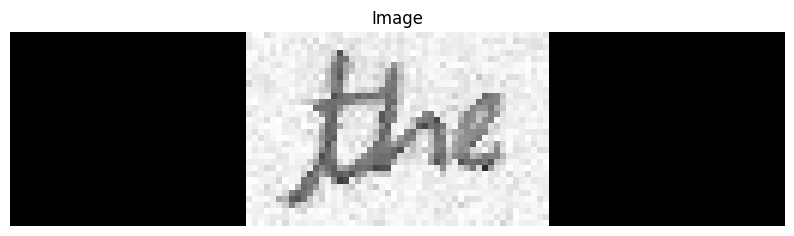

[2024/05/17 18:59:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017198801040649414
[2024/05/17 18:59:42] ppocr DEBUG: cls num  : 1, elapsed : 0.012600183486938477
[2024/05/17 18:59:42] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07648539543151855
Recognized text: my, Probability: 0.8772686719894409


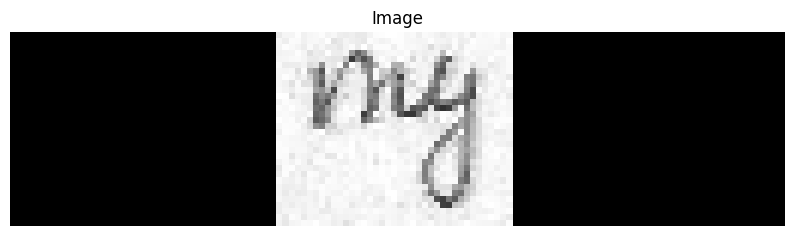

[2024/05/17 18:59:42] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.028391361236572266
[2024/05/17 18:59:42] ppocr DEBUG: cls num  : 1, elapsed : 0.024003267288208008
[2024/05/17 18:59:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08706188201904297
Recognized text: grabbed, Probability: 0.9501025080680847


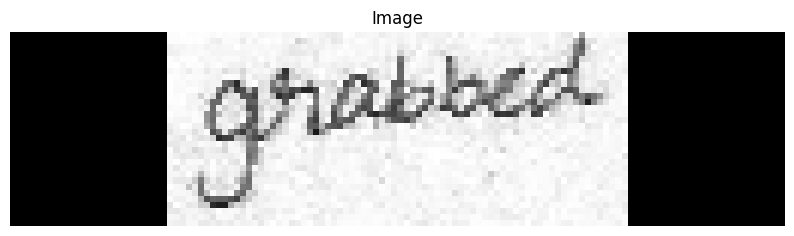

[2024/05/17 18:59:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020391464233398438
[2024/05/17 18:59:43] ppocr DEBUG: cls num  : 1, elapsed : 0.015219449996948242
[2024/05/17 18:59:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08482980728149414
Recognized text: me, Probability: 0.9946696758270264


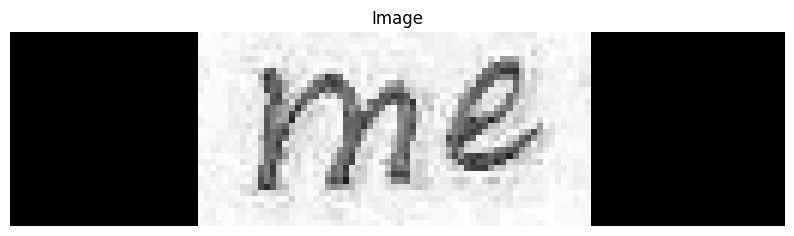

[2024/05/17 18:59:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019840717315673828
[2024/05/17 18:59:43] ppocr DEBUG: cls num  : 1, elapsed : 0.013895750045776367
[2024/05/17 18:59:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08183121681213379
Recognized text: hq, Probability: 0.8791692852973938


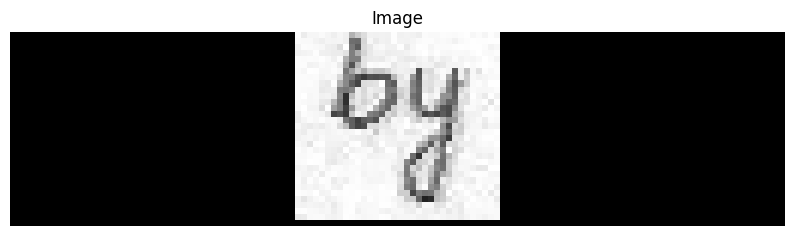

[2024/05/17 18:59:43] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019866228103637695
[2024/05/17 18:59:43] ppocr DEBUG: cls num  : 1, elapsed : 0.014748573303222656
[2024/05/17 18:59:43] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07960247993469238
Recognized text: toei, Probability: 0.9536789059638977


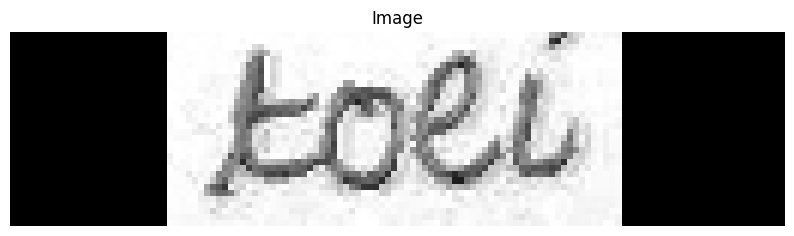

[2024/05/17 18:59:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02078104019165039
[2024/05/17 18:59:44] ppocr DEBUG: cls num  : 1, elapsed : 0.013489484786987305
[2024/05/17 18:59:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08180904388427734
Recognized text: and, Probability: 0.9018389582633972


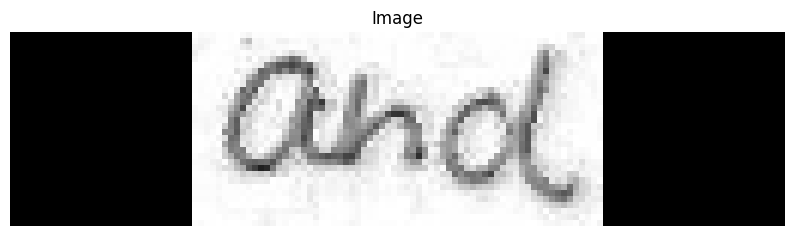

[2024/05/17 18:59:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02764415740966797
[2024/05/17 18:59:44] ppocr DEBUG: cls num  : 1, elapsed : 0.017023086547851562
[2024/05/17 18:59:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08747243881225586
Recognized text: T, Probability: 0.9936310648918152


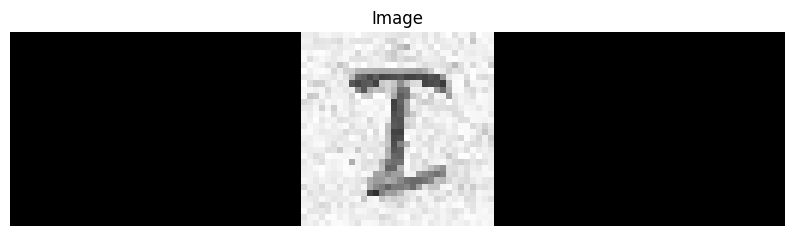

[2024/05/17 18:59:44] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02069830894470215
[2024/05/17 18:59:44] ppocr DEBUG: cls num  : 1, elapsed : 0.014807939529418945
[2024/05/17 18:59:44] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08212614059448242
Recognized text: uas, Probability: 0.5914520621299744


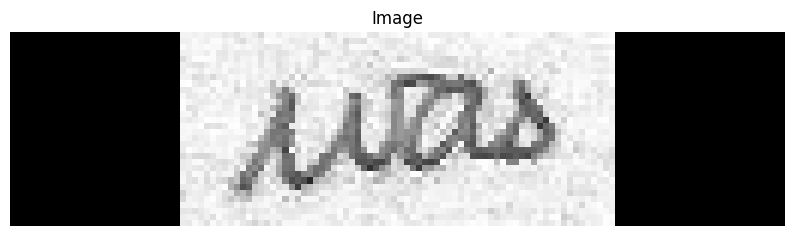

[2024/05/17 18:59:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.030519723892211914
[2024/05/17 18:59:45] ppocr DEBUG: cls num  : 1, elapsed : 0.020772933959960938
[2024/05/17 18:59:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08708977699279785
Recognized text: drafting, Probability: 0.884746789932251


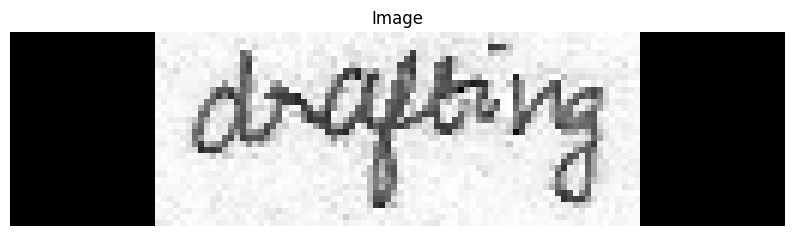

[2024/05/17 18:59:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020521163940429688
[2024/05/17 18:59:45] ppocr DEBUG: cls num  : 1, elapsed : 0.01125645637512207
[2024/05/17 18:59:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08311867713928223


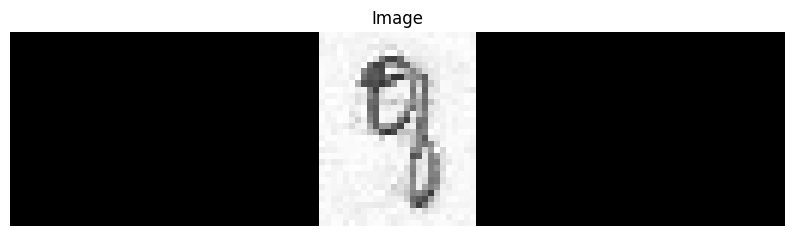

[2024/05/17 18:59:45] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.015276193618774414
[2024/05/17 18:59:45] ppocr DEBUG: cls num  : 1, elapsed : 0.0125885009765625
[2024/05/17 18:59:45] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07720112800598145
Recognized text: out, Probability: 0.8658924698829651


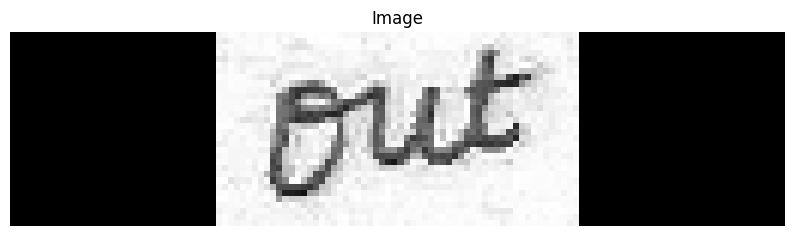

[2024/05/17 18:59:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016318798065185547
[2024/05/17 18:59:46] ppocr DEBUG: cls num  : 1, elapsed : 0.012748241424560547
[2024/05/17 18:59:46] ppocr DEBUG: rec_res num  : 1, elapsed : 0.09104037284851074
Recognized text: consieucners, Probability: 0.9173459410667419


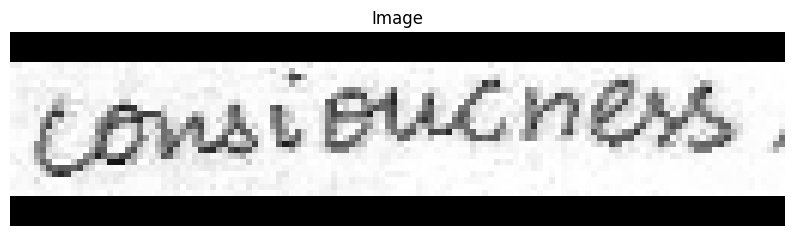

[2024/05/17 18:59:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01966118812561035
[2024/05/17 18:59:46] ppocr DEBUG: cls num  : 1, elapsed : 0.01255345344543457
[2024/05/17 18:59:46] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08397722244262695
Recognized text: Lirst, Probability: 0.7742387652397156


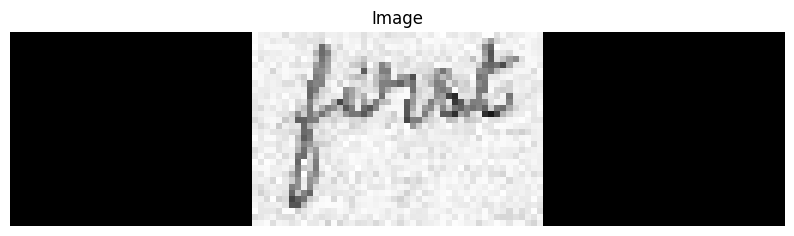

[2024/05/17 18:59:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.017253398895263672
[2024/05/17 18:59:46] ppocr DEBUG: cls num  : 1, elapsed : 0.01208639144897461
[2024/05/17 18:59:46] ppocr DEBUG: rec_res num  : 1, elapsed : 0.07652926445007324
Recognized text: the, Probability: 0.9937568306922913


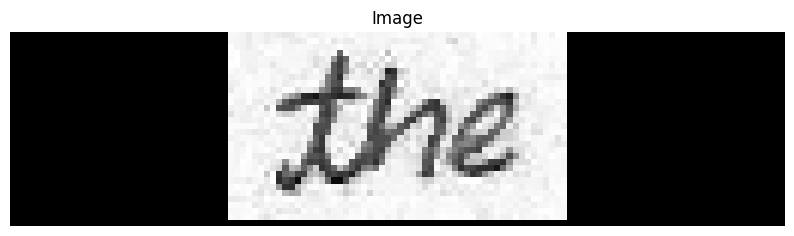

[2024/05/17 18:59:46] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.019336700439453125
[2024/05/17 18:59:47] ppocr DEBUG: cls num  : 1, elapsed : 0.01461172103881836
[2024/05/17 18:59:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08022880554199219
Recognized text: onto, Probability: 0.8552734851837158


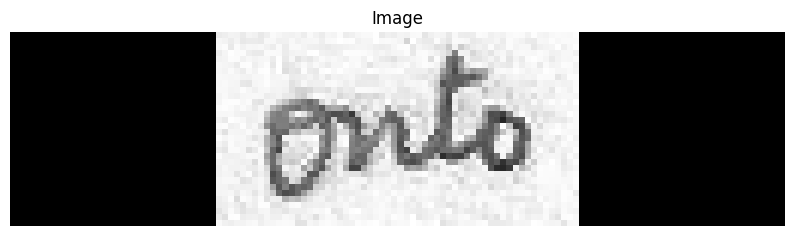

[2024/05/17 18:59:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.0214996337890625
[2024/05/17 18:59:47] ppocr DEBUG: cls num  : 1, elapsed : 0.014757394790649414
[2024/05/17 18:59:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08330130577087402


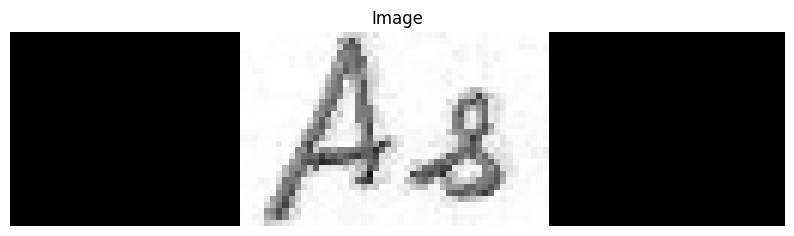

[2024/05/17 18:59:47] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.020971059799194336
[2024/05/17 18:59:47] ppocr DEBUG: cls num  : 1, elapsed : 0.015774011611938477
[2024/05/17 18:59:47] ppocr DEBUG: rec_res num  : 1, elapsed : 0.08205389976501465
Recognized text: kconerit, Probability: 0.8251912593841553


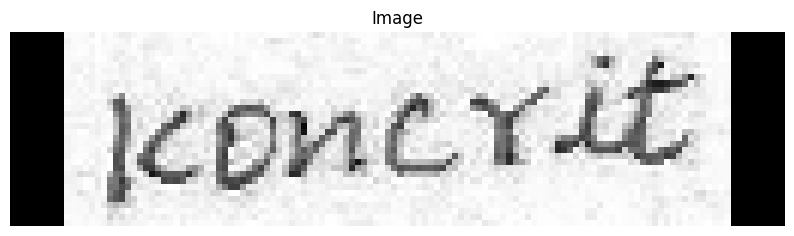

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR, draw_ocr

preprocessed_path = "/content/drive/MyDrive/HTR_Data/preprocessed"

def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            images.append((img_path, img))
    return images

preprocessed_images = load_images_from_folder(preprocessed_path)
ocr = PaddleOCR(use_angle_cls=True,lang='en',use_gpu=False,drop_score=0.3,det_db_unclip_ratio=3.0)

for img_path, img in preprocessed_images:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = ocr.ocr(img_rgb, cls=True)
    if result is not None:
        for line in result:
            if line is not None:
                for bbox, (text, prob) in line:
                    if any(char.isdigit() for char in text):
                        continue
                    print(f"Recognized text: {text}, Probability: {prob}")
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Image")
    plt.axis("off")
    plt.show()


# Final Code to Combine all the Functions

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_0.png


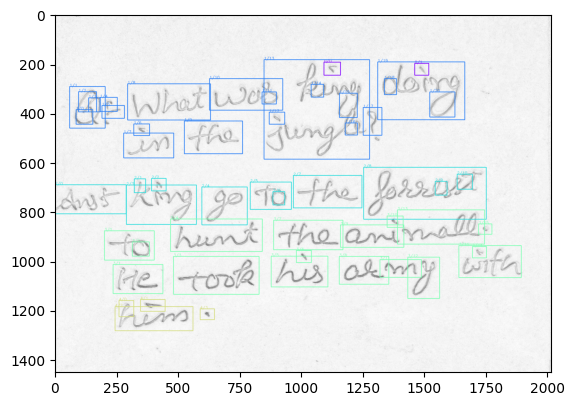

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_1.png


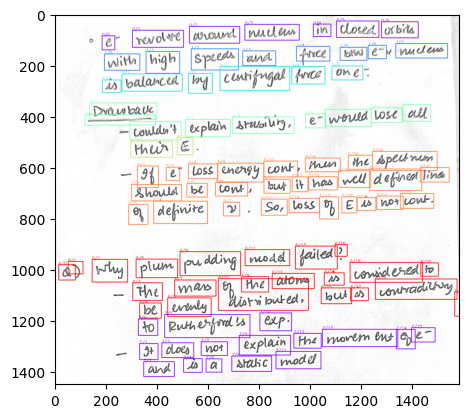

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_2.png


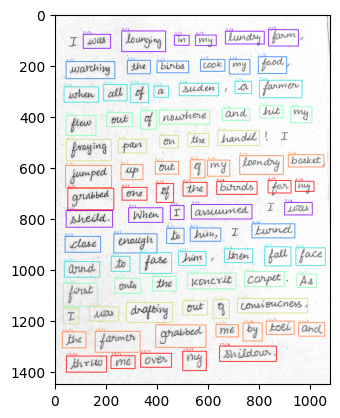

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_3.png


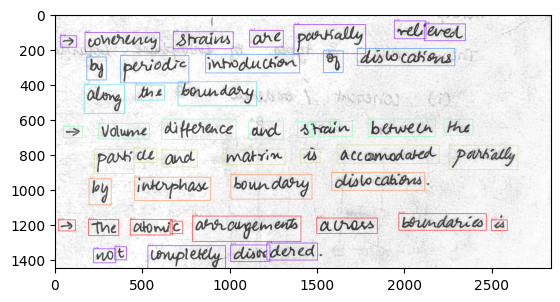

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_4.png


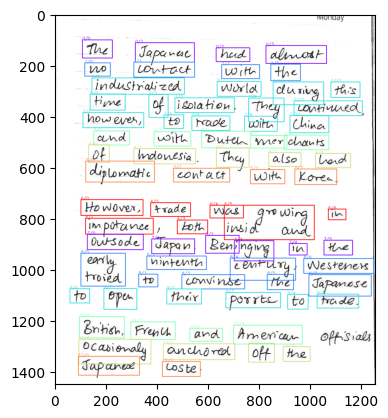

Processing file /content/drive/MyDrive/HTR_Data/Preprocess/preprocessed_5.png


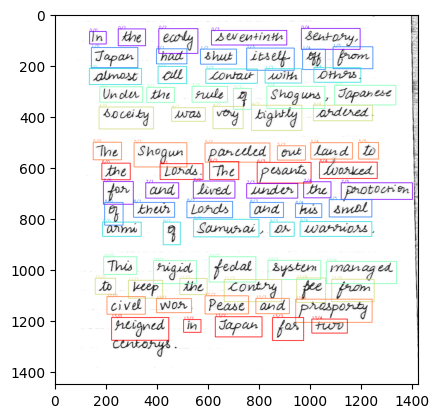

In [ ]:
import pickle

@dataclass
class BBox:
    x: int
    y: int
    w: int
    h: int

@dataclass
class DetectorRes:
    img: np.ndarray
    bbox: BBox

def detect(img: np.ndarray, kernel_size: int, sigma: float, theta: float, min_area: int, target_size: int) -> List[DetectorRes]:
    assert img.ndim == 2
    assert img.dtype == np.uint8
    kernel = _compute_kernel(kernel_size, sigma, theta)
    img_filtered = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE).astype(np.uint8)
    img_thres = 255 - cv2.threshold(img_filtered, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    res = []
    components = cv2.findContours(img_thres, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    for c in components:
        if cv2.contourArea(c) < min_area:
            continue
        x, y, w, h = cv2.boundingRect(c)
        padding = 11
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = w + 2 * padding
        h = h + 2 * padding
        crop = img[y:y + h, x:x + w]
        crop_h, crop_w = crop.shape
        max_dim = max(crop_h, crop_w, target_size)
        top_pad = (max_dim - crop_h) // 2
        bottom_pad = max_dim - crop_h - top_pad
        left_pad = (max_dim - crop_w) // 2
        right_pad = max_dim - crop_w - left_pad
        crop_padded = cv2.copyMakeBorder(crop, top_pad, bottom_pad, left_pad, right_pad, cv2.BORDER_CONSTANT, value=255)
        res.append(DetectorRes(crop_padded, BBox(x, y, w, h)))
    return res

def _compute_kernel(kernel_size: int, sigma: float, theta: float) -> np.ndarray:
    assert kernel_size % 2
    half_size = kernel_size // 2
    xs = ys = np.linspace(-half_size, half_size, kernel_size)
    x, y = np.meshgrid(xs, ys)
    sigma_y = sigma
    sigma_x = sigma_y * theta
    exp_term = np.exp(-x ** 2 / (2 * sigma_x) - y ** 2 / (2 * sigma_y))
    x_term = (x ** 2 - sigma_x ** 2) / (2 * np.math.pi * sigma_x ** 5 * sigma_y)
    y_term = (y ** 2 - sigma_y ** 2) / (2 * np.math.pi * sigma_y ** 5 * sigma_x)
    kernel = (x_term + y_term) * exp_term
    kernel = kernel / np.sum(kernel)
    return kernel

def prepare_img(img: np.ndarray, height: int) -> np.ndarray:
    assert img.ndim in (2, 3)
    assert height > 0
    assert img.dtype == np.uint8
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h = img.shape[0]
    factor = height / h
    return cv2.resize(img, dsize=None, fx=factor, fy=factor)

def _cluster_lines(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    num_bboxes = len(detections)
    dist_mat = np.ones((num_bboxes, num_bboxes))
    for i in range(num_bboxes):
        for j in range(i, num_bboxes):
            a = detections[i].bbox
            b = detections[j].bbox
            if a.y > b.y + b.h or b.y > a.y + a.h:
                continue
            intersection = min(a.y + a.h, b.y + b.h) - max(a.y, b.y)
            union = a.h + b.h - intersection
            iou = np.clip(intersection / union if union > 0 else 0, 0, 1)
            dist_mat[i, j] = dist_mat[j, i] = 1 - iou
    dbscan = DBSCAN(eps=max_dist, min_samples=min_words_per_line, metric='precomputed').fit(dist_mat)
    clustered = defaultdict(list)
    for i, cluster_id in enumerate(dbscan.labels_):
        if cluster_id == -1:
            continue
        clustered[cluster_id].append(detections[i])
    res = sorted(clustered.values(), key=lambda line: [det.bbox.y + det.bbox.h / 2 for det in line])
    return res

def sort_multiline(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    lines = _cluster_lines(detections, max_dist, min_words_per_line)
    res = []
    for line in lines:
        res += sort_line(line)
    return res

def sort_line(detections: List[DetectorRes]) -> List[List[DetectorRes]]:
    return [sorted(detections, key=lambda det: det.bbox.x + det.bbox.w / 2)]

list_img_names_serial = []
coordinates_dict = {}

def get_img_files(data_dir: Path) -> List[Path]:
    res = []
    for ext in ['*.png', '*.jpg', '*.jpeg']:
        res += list(data_dir.glob(ext))
    return res

def save_image_names_to_text_files(data_dir: Path, kernel_size: int, sigma: float, theta: float, min_area: int, img_height: int, target_size: int):
    for fn_img in get_img_files(data_dir):
        print(f'Processing file {fn_img}')
        img = prepare_img(cv2.imread(str(fn_img)), img_height)
        detections = detect(img, kernel_size=kernel_size, sigma=sigma, theta=theta, min_area=min_area, target_size=target_size)
        lines = sort_multiline(detections)
        # Creating annotated image
        annotated_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        num_colors = 7
        colors = plt.cm.get_cmap('rainbow', num_colors)
        base_name = os.path.splitext(os.path.basename(fn_img))[0]
        coordinates = []
        for line_idx, line in enumerate(lines):
            for word_idx, det in enumerate(line):
                xs = [det.bbox.x, det.bbox.x, det.bbox.x + det.bbox.w, det.bbox.x + det.bbox.w, det.bbox.x]
                ys = [det.bbox.y, det.bbox.y + det.bbox.h, det.bbox.y + det.bbox.h, det.bbox.y, det.bbox.y]
                color = tuple(int(255 * c) for c in colors(line_idx % num_colors)[:3])
                cv2.polylines(annotated_img, [np.array(list(zip(xs, ys)), dtype=np.int32)], isClosed=True, color=color, thickness=2)
                cv2.putText(annotated_img, f'{line_idx}/{word_idx}', (det.bbox.x, det.bbox.y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
                crop_img = det.img
                path = '/content/drive/MyDrive/HTR_Data/cropped'
                if not os.path.exists(path):
                    os.mkdir(path)
                    print("Directory Created")
                # Saving cropped image
                pil_crop_img = cv2.cvtColor(crop_img, cv2.COLOR_GRAY2RGB)
                pil_crop_img = im.fromarray(pil_crop_img)
                save_name = f"{base_name}_line{line_idx}_word{word_idx}.png"
                pil_crop_img.save(f"{path}/{save_name}", dpi=(500, 500))
                list_img_names_serial.append(save_name)
                coordinates.append((save_name, (det.bbox.x, det.bbox.y, det.bbox.x + det.bbox.w, det.bbox.y + det.bbox.h)))
        coordinates_dict[base_name] = coordinates

        with open("/content/drive/MyDrive/HTR_Data/cropped/coordinates.pkl", "wb") as f:
            pickle.dump(coordinates_dict, f)
        with open("/content/drive/MyDrive/HTR_Data/cropped/img_names_sequence.txt", "w") as textfile:
            for element in list_img_names_serial:
                textfile.write(element + "\n")
        # Saving annotated image
        annotated_path = '/content/drive/MyDrive/HTR_Data/Annotated'
        if not os.path.exists(annotated_path):
            os.mkdir(annotated_path)
            print("Annotated Directory Created")
        annotated_img_name = os.path.join(annotated_path, os.path.basename(fn_img))
        cv2.imwrite(annotated_img_name, annotated_img)
        plt.imshow(annotated_img)
        plt.show()

data_dir = Path('/content/drive/MyDrive/HTR_Data/Preprocess')
# Parameters
kernel_size = 33
sigma = 28
theta = 10
min_area = 420
img_height = 1450
target_size = 224

save_image_names_to_text_files(data_dir, kernel_size, sigma, theta, min_area, img_height, target_size)


[2024/05/17 19:08:02] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=4.0, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

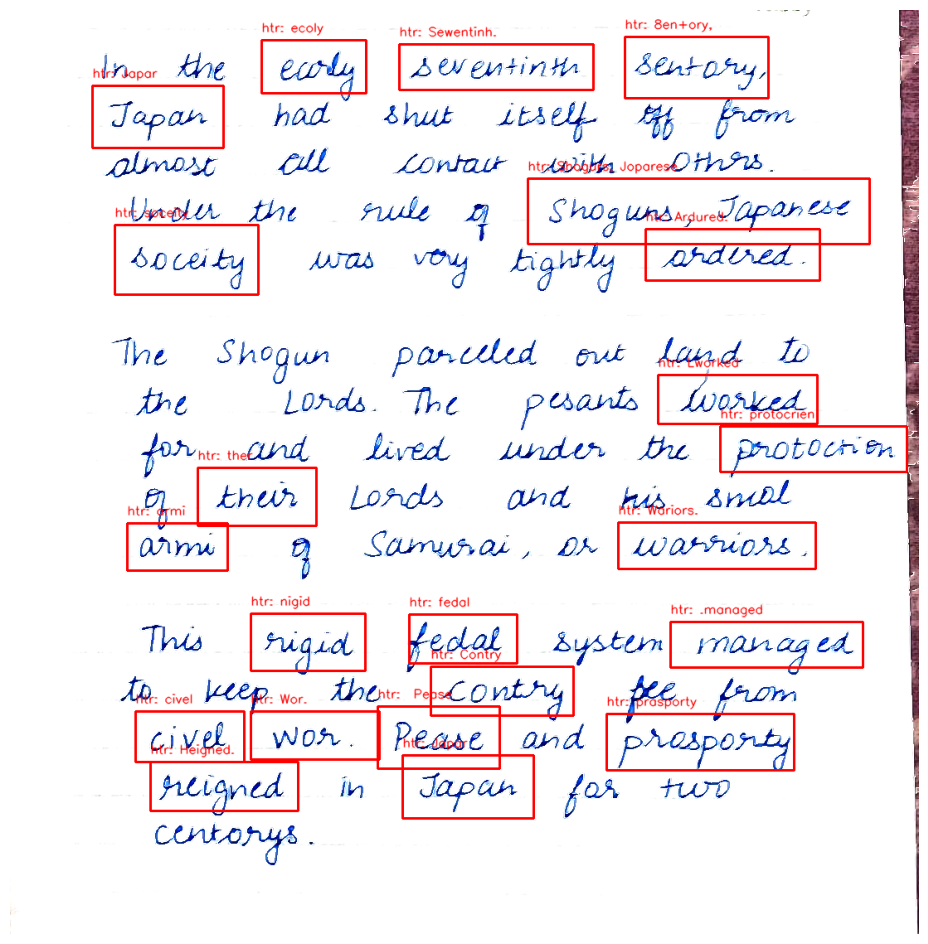

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from paddleocr import PaddleOCR
from symspellpy.symspellpy import SymSpell, Verbosity
import requests
from PIL import Image as im
from pathlib import Path
from collections import defaultdict
from dataclasses import dataclass
from sklearn.cluster import DBSCAN
from typing import List

sym_spell = SymSpell(max_dictionary_edit_distance=2, prefix_length=7)
dict_path = '/content/drive/MyDrive/HTR_Data/frequency_dictionary_en_82_765.txt'
bigram_path = '/content/drive/MyDrive/HTR_Data/frequency_bigramdictionary_en_243_342.txt'

if not os.path.exists(dict_path):
    print(f"Downloading {dict_path}...")
    url = 'https://raw.githubusercontent.com/wolfgarbe/SymSpell/master/SymSpell/frequency_dictionary_en_82_765.txt'
    r = requests.get(url)
    with open(dict_path, 'wb') as f:
        f.write(r.content)

if not os.path.exists(bigram_path):
    print(f"Downloading {bigram_path}...")
    url = 'https://raw.githubusercontent.com/wolfgarbe/SymSpell/master/SymSpell/frequency_bigramdictionary_en_243_342.txt'
    r = requests.get(url)
    with open(bigram_path, 'wb') as f:
        f.write(r.content)

sym_spell.load_dictionary(dict_path, term_index=0, count_index=1)
sym_spell.load_bigram_dictionary(bigram_path, term_index=0, count_index=2)

ocr=PaddleOCR(use_angle_cls=True,lang='en',use_gpu=False,drop_score=0.3,det_db_unclip_ratio=4.0)

def check_spelling(word):
    suggestions = sym_spell.lookup(word, Verbosity.CLOSEST, max_edit_distance=2)
    if len(suggestions) == 0:
        return False
    return word.lower() == suggestions[0].term.lower()

ignore_list = {'the', 'and', 'in', 'to', 'of', 'a', 'I', 'The', 'or', 'his', 'His', 'In'}

@dataclass
class BBox:
    x: int
    y: int
    w: int
    h: int

@dataclass
class DetectorRes:
    img: np.ndarray
    bbox: BBox

def detect(img: np.ndarray, kernel_size: int, sigma: float, theta: float, min_area: int) -> List[DetectorRes]:
    assert img.ndim == 2
    assert img.dtype == np.uint8
    kernel = _compute_kernel(kernel_size, sigma, theta)
    img_filtered = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE).astype(np.uint8)
    img_thres = 255 - cv2.threshold(img_filtered, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    res = []
    components = cv2.findContours(img_thres, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    for c in components:
        if cv2.contourArea(c) < min_area:
            continue
        x, y, w, h = cv2.boundingRect(c)
        padding = 11
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = w + 2 * padding
        h = h + 2 * padding
        crop = img[y:y + h, x:x + w]
        res.append(DetectorRes(crop, BBox(x, y, w, h)))
    return res

def _compute_kernel(kernel_size: int, sigma: float, theta: float) -> np.ndarray:
    assert kernel_size % 2
    half_size = kernel_size // 2
    xs = ys = np.linspace(-half_size, half_size, kernel_size)
    x, y = np.meshgrid(xs, ys)
    sigma_y = sigma
    sigma_x = sigma_y * theta
    exp_term = np.exp(-x ** 2 / (2 * sigma_x) - y ** 2 / (2 * sigma_y))
    x_term = (x ** 2 - sigma_x ** 2) / (2 * np.math.pi * sigma_x ** 5 * sigma_y)
    y_term = (y ** 2 - sigma_y ** 2) / (2 * np.math.pi * sigma_y ** 5 * sigma_x)
    kernel = (x_term + y_term) * exp_term
    kernel = kernel / np.sum(kernel)
    return kernel

def prepare_img(img: np.ndarray, height: int) -> np.ndarray:
    assert img.ndim in (2, 3)
    assert height > 0
    assert img.dtype == np.uint8
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h = img.shape[0]
    factor = height / h
    return cv2.resize(img, dsize=None, fx=factor, fy=factor)

def _cluster_lines(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    num_bboxes = len(detections)
    dist_mat = np.ones((num_bboxes, num_bboxes))
    for i in range(num_bboxes):
        for j in range(i, num_bboxes):
            a = detections[i].bbox
            b = detections[j].bbox
            if a.y > b.y + b.h or b.y > a.y + a.h:
                continue
            intersection = min(a.y + a.h, b.y + b.h) - max(a.y, b.y)
            union = a.h + b.h - intersection
            iou = np.clip(intersection / union if union > 0 else 0, 0, 1)
            dist_mat[i, j] = dist_mat[j, i] = 1 - iou
    dbscan = DBSCAN(eps=max_dist, min_samples=min_words_per_line, metric='precomputed').fit(dist_mat)

    clustered = defaultdict(list)
    for i, cluster_id in enumerate(dbscan.labels_):
        if cluster_id == -1:
            continue
        clustered[cluster_id].append(detections[i])
    res = sorted(clustered.values(), key=lambda line: [det.bbox.y + det.bbox.h / 2 for det in line])
    return res

def sort_multiline(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    lines = _cluster_lines(detections, max_dist, min_words_per_line)
    res = []
    for line in lines:
        res += sort_line(line)
    return res

def sort_line(detections: List[DetectorRes]) -> List[List[DetectorRes]]:
    return [sorted(detections, key=lambda det: det.bbox.x + det.bbox.w / 2)]

# Preprocessing functions
def automatic_color_correction(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    cl = clahe.apply(l)
    limg = cv2.merge((cl, a, b))
    final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    return final

def adjust_brightness_contrast(image, brightness=0, contrast=30):
    beta = brightness
    alpha = contrast / 127.0 + 1.0
    new_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
    return new_image

def edge_enhancement(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 250, 450)
    edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
    enhanced_image = cv2.add(edges, image)
    return enhanced_image

def process_image(image_path):
    image = cv2.imread(image_path)
    image = automatic_color_correction(image)
    image = adjust_brightness_contrast(image)
    image = edge_enhancement(image)
    ocr_result = ocr.ocr(image, cls=True)
    misspelled_words = []

    for line in ocr_result:
        for word_info in line:
            word = word_info[1][0]
            bbox = BBox(
                x=int(word_info[0][0][0]),
                y=int(word_info[0][0][1]),
                w=int(word_info[0][2][0]) - int(word_info[0][0][0]),
                h=int(word_info[0][2][1]) - int(word_info[0][0][1]))
            prob = word_info[1][1]
            if prob > 0.85 and not check_spelling(word) and word not in ignore_list:
                misspelled_words.append((word, bbox, prob))

    highlighted_image = highlight_misspelled_words(image, misspelled_words)
    save_path = os.path.join('./inference_results', 'highlighted_image.jpg')
    cv2.imwrite(save_path, highlighted_image)
    print(f"Processed image saved to {save_path}")
    display_word_results(ocr_result)
    plt.figure(figsize=(12, 12))
    plt.imshow(cv2.cvtColor(highlighted_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

def highlight_misspelled_words(image, misspelled_words):
    for word, bbox, prob in misspelled_words:
        x_min = bbox.x
        y_min = bbox.y
        x_max = bbox.x + bbox.w
        y_max = bbox.y + bbox.h
        if len(image.shape) == 2 or image.shape[2] == 1:
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 0, 255), 2)
        cv2.putText(image, f'htr: {word}', (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1, cv2.LINE_AA)
    return image

def display_word_results(ocr_result):
    for line in ocr_result:
        for word_info in line:
            word = word_info[1][0]
            prob = word_info[1][1]
            is_misspelled = prob > 0.85 and not check_spelling(word) and word not in ignore_list
            print(f"Word: {word}, Confidence: {prob:.2f}, Misspelled: {is_misspelled}")

# Process the image
input_image_path = '/content/drive/MyDrive/HTR_Data/Original/Ruled 3.jpg'
process_image(input_image_path)


## Evaluation

In [ ]:
!pip install jiwer

In [ ]:
import editdistance
from typing import List
from paddleocr import PaddleOCR
import os
import cv2
import numpy as np
from jiwer import wer, cer
import matplotlib.pyplot as plt

def calculate_wer(reference_texts, predicted_texts):
    total_wer = 0
    for ref, pred in zip(reference_texts, predicted_texts):
        total_wer += wer(ref, pred)
    return total_wer / len(reference_texts)

def calculate_cer(reference_texts, predicted_texts):
    total_cer = 0
    for ref, pred in zip(reference_texts, predicted_texts):
        total_cer += cer(ref, pred)
    return total_cer / len(reference_texts)

In [ ]:
def decode_ocr_results(ocr_results):
    decoded_texts = []
    for line in ocr_results:
        line_text = ' '.join([word_info[1][0] for word_info in line])
        decoded_texts.append(line_text)
    return ' '.join(decoded_texts)

def word_error_rate(ground_truth: str, prediction: str) -> float:
    ground_truth_words = ground_truth.split()
    prediction_words = prediction.split()
    return editdistance.eval(ground_truth_words, prediction_words) / len(ground_truth_words)

def character_error_rate(ground_truth: str, prediction: str) -> float:
    return editdistance.eval(ground_truth, prediction) / len(ground_truth)

Metrics for Decent Handwriting

[2024/05/18 03:25:08] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=4.0, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

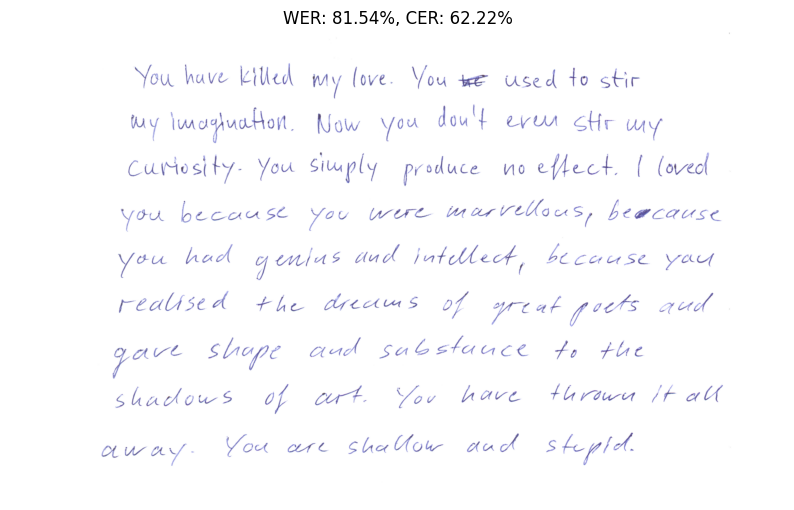

[2024/05/18 03:25:13] ppocr DEBUG: dt_boxes num : 17, elapsed : 0.3854033946990967
[2024/05/18 03:25:13] ppocr DEBUG: cls num  : 17, elapsed : 0.06157708168029785
[2024/05/18 03:25:15] ppocr DEBUG: rec_res num  : 17, elapsed : 1.1967644691467285
Ground Truth: While I gazed, this fissure rapidly widened - there came a fierce breath of the whirlwind - the entire orb of the satellite burst at once upon my sight - my brain reeled as I saw the mighty walls rushing asunder - there was a long tumultuous shouting sound like the voice of a thousand waters - and the deep and dank tarn at my feet closed sullenly and silently over the fragments of the "House of Usher."
OCR Text: While Iqated, us fisure rap|dy widued- there cauc a furce braHh of+uc wh1r|uud- +UL uHrL orb of +thc sa+uke bvrs+ a+ onCc upou wy slqut- uy brcun reled as 1 sw fhe y asuudcr-+hcrc wus hnysn Smm nlim d louy tuultous shouHuy Souud Ulce tue fect closed! A7+m)/s ynn Trayuncuts Salluly Over thc Jo 7sn0Hn 2yt Usher. 0
WER: 92.31

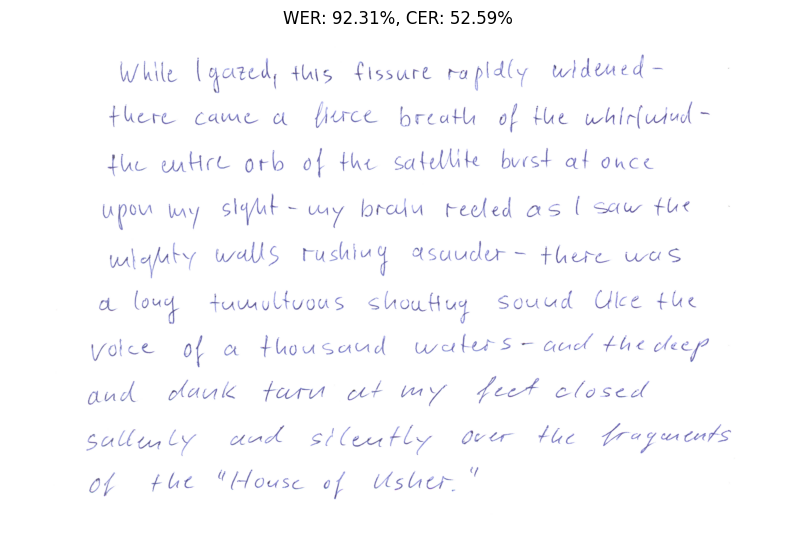

[2024/05/18 03:25:16] ppocr DEBUG: dt_boxes num : 6, elapsed : 0.39553403854370117
[2024/05/18 03:25:16] ppocr DEBUG: cls num  : 6, elapsed : 0.028368711471557617
[2024/05/18 03:25:18] ppocr DEBUG: rec_res num  : 6, elapsed : 1.1629414558410645
Ground Truth: When we look to the individuals of the same variety or sub-variety of our older cultivated plants and animals, one of the first points which strikes us, is, that they generally differ much more from each other, than do the individuals of any one species or variety in a state of nature.
OCR Text: Won we look+ th inividals of tho sowe voiety Ov sub-vaviety of ov old Cultivakd plants ov Qnimals,Or of th is oins whch shik us,is . Hhat they gervoalydilr mch move Rom each othw +hun do tho ind vidualr of any cne sprcis o. Variety ina sak of nawe ..
WER: 82.69%, CER: 27.62%



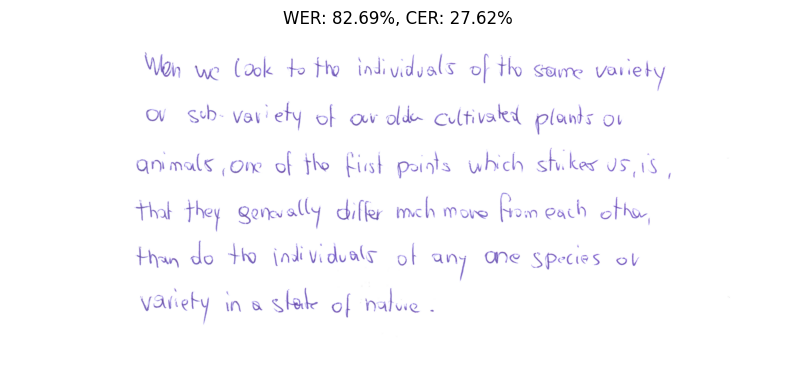

[2024/05/18 03:25:20] ppocr DEBUG: dt_boxes num : 7, elapsed : 0.8000757694244385
[2024/05/18 03:25:21] ppocr DEBUG: cls num  : 7, elapsed : 0.533726692199707
[2024/05/18 03:25:23] ppocr DEBUG: rec_res num  : 7, elapsed : 1.7556421756744385
Ground Truth: You have killed my love. You used to stir my imagination. Now you don't even stir my curiosity. You simply produce no effect. I loved you because you were marvellous, because you had genius and intellect, because you realised the dreams of great poets and gave shape and substance to the shadows of art. You have thrown it all away. You are shallow and stupid.
OCR Text: Yyou howe klla my ove.yo vsn +o stiv my Cui osity o sim re  efe ove yo becag yo wee marvelos browe you had gee? and ialelet ese yo oalie+ deamr o Sieat pols ond geie smp an sbsunce +oHe Shadowe of wl. you hawe +honn if ol oway. You aue shlon and shupid..
WER: 87.69%, CER: 42.78%



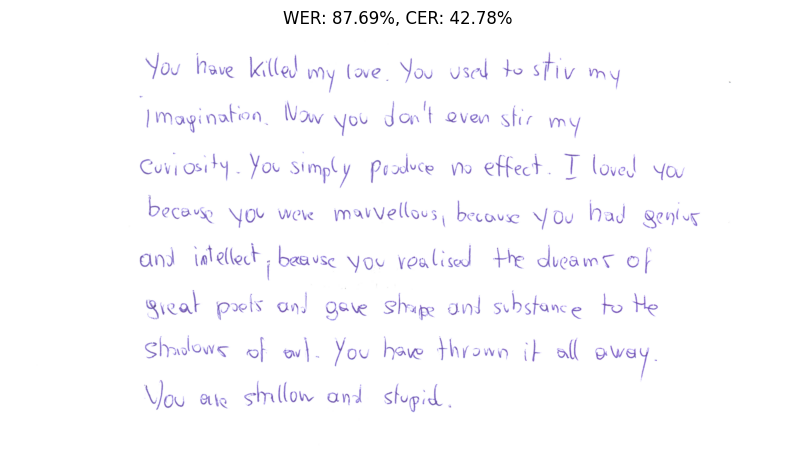

Final Average Word Error Rate (WER): 86.54%
Final Average Character Error Rate (CER): 47.48%
Word Error Rate (WER): 86.54%
Character Error Rate (CER): 47.48%


In [ ]:
import os
import cv2
import numpy as np
from paddleocr import PaddleOCR
from jiwer import wer, cer
import editdistance
from typing import List
import matplotlib.pyplot as plt

def calculate_wer(reference_texts, predicted_texts):
    total_wer = 0
    for ref, pred in zip(reference_texts, predicted_texts):
        total_wer += wer(ref, pred)
    return total_wer / len(reference_texts)

def calculate_cer(reference_texts, predicted_texts):
    total_cer = 0
    for ref, pred in zip(reference_texts, predicted_texts):
        total_cer += cer(ref, pred)
    return total_cer / len(reference_texts)

def decode_ocr_results(ocr_results):
    decoded_texts = []
    for line in ocr_results:
        line_text = ' '.join([word_info[1][0] for word_info in line])
        decoded_texts.append(line_text)
    return ' '.join(decoded_texts)

def word_error_rate(ground_truth: str, prediction: str) -> float:
    ground_truth_words = ground_truth.split()
    prediction_words = prediction.split()
    return editdistance.eval(ground_truth_words, prediction_words) / len(ground_truth_words)

def character_error_rate(ground_truth: str, prediction: str) -> float:
    return editdistance.eval(ground_truth, prediction) / len(ground_truth)

def evaluate_ocr(ocr: PaddleOCR, image_paths: List[str], ground_truth_texts: List[str]) -> (float, float):
    total_wer = 0
    total_cer = 0
    total_words = 0
    total_chars = 0
    predicted_texts = []
    individual_metrics = []
    for img_path, gt_text in zip(image_paths, ground_truth_texts):
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        result = ocr.ocr(image, cls=True)
        ocr_text = decode_ocr_results(result)
        predicted_texts.append(ocr_text)
        wer_value = word_error_rate(gt_text, ocr_text)
        cer_value = character_error_rate(gt_text, ocr_text)
        total_wer += wer_value * len(gt_text.split())
        total_cer += cer_value * len(gt_text)
        total_words += len(gt_text.split())
        total_chars += len(gt_text)
        individual_metrics.append((wer_value, cer_value))
        print(f"Ground Truth: {gt_text}")
        print(f"OCR Text: {ocr_text}")
        print(f"WER: {wer_value * 100:.2f}%, CER: {cer_value * 100:.2f}%\n")
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.title(f"WER: {wer_value * 100:.2f}%, CER: {cer_value * 100:.2f}%")
        plt.axis('off')
        plt.show()
    average_wer = total_wer / total_words
    average_cer = total_cer / total_chars
    print(f"Final Average Word Error Rate (WER): {average_wer * 100:.2f}%")
    print(f"Final Average Character Error Rate (CER): {average_cer * 100:.2f}%")
    return average_wer, average_cer

ocr = PaddleOCR(use_angle_cls=True, lang='en', use_gpu=False, drop_score=0.3, det_db_unclip_ratio=4.0)

eval_image_paths = ['/content/drive/MyDrive/HTR_Data/Eval/Good/0016-7.tif',
                    '/content/drive/MyDrive/HTR_Data/Eval/Good/0016-8.tif',
                    '/content/drive/MyDrive/HTR_Data/Eval/Good/0021-4.tif',
                    '/content/drive/MyDrive/HTR_Data/Eval/Good/0021-7.tif']

ground_truth_texts = ["You have killed my love. You used to stir my imagination. Now you don't even stir my curiosity. You simply produce no effect. I loved you because you were marvellous, because you had genius and intellect, because you realised the dreams of great poets and gave shape and substance to the shadows of art. You have thrown it all away. You are shallow and stupid.",
                      "While I gazed, this fissure rapidly widened - there came a fierce breath of the whirlwind - the entire orb of the satellite burst at once upon my sight - my brain reeled as I saw the mighty walls rushing asunder - there was a long tumultuous shouting sound like the voice of a thousand waters - and the deep and dank tarn at my feet closed sullenly and silently over the fragments of the \"House of Usher.\"",
                      "When we look to the individuals of the same variety or sub-variety of our older cultivated plants and animals, one of the first points which strikes us, is, that they generally differ much more from each other, than do the individuals of any one species or variety in a state of nature.",
                      "You have killed my love. You used to stir my imagination. Now you don't even stir my curiosity. You simply produce no effect. I loved you because you were marvellous, because you had genius and intellect, because you realised the dreams of great poets and gave shape and substance to the shadows of art. You have thrown it all away. You are shallow and stupid."]

wer_value, cer_value = evaluate_ocr(ocr, eval_image_paths, ground_truth_texts)
print(f"Word Error Rate (WER): {wer_value * 100:.2f}%")
print(f"Character Error Rate (CER): {cer_value * 100:.2f}%")


Metrics for bad handwriting

[2024/05/18 03:33:54] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=False, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=4.0, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='

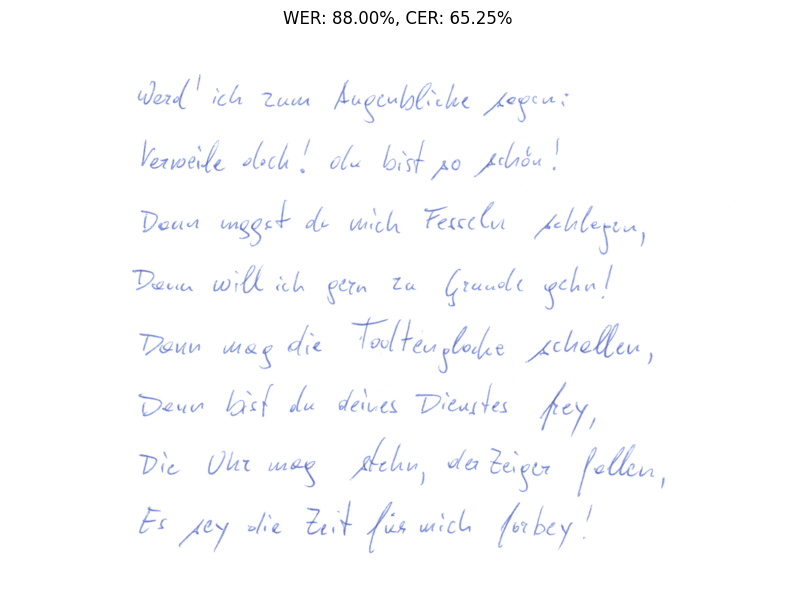

[2024/05/18 03:34:04] ppocr DEBUG: dt_boxes num : 8, elapsed : 0.3436758518218994
[2024/05/18 03:34:04] ppocr DEBUG: cls num  : 8, elapsed : 0.06506705284118652
[2024/05/18 03:34:05] ppocr DEBUG: rec_res num  : 8, elapsed : 0.5615777969360352
Ground Truth: And fortune, on his damned quarrel smiling, Show'd like a rebel's whore: but all's too weak: For brave Nomacs - well he deserves that name - Disdaining fortune, with his brandish'd steel, Which smoked with bloody execution, Like valour's minion carved out his passage Till he faced the slave;
OCR Text:  Sprhu, i1 i damu qrom 19my!mc V Jhao'd hiu a u's whor; but au' ho wok? Dsdainin'g n1wiHn hi bodjh'd hdj 1hqym7 X1 PnoyI yh prwU Lny Lu wowh mini01 cund ut hd pauey! TiU n Jauud yhu nlQmj
WER: 95.92%, CER: 64.38%



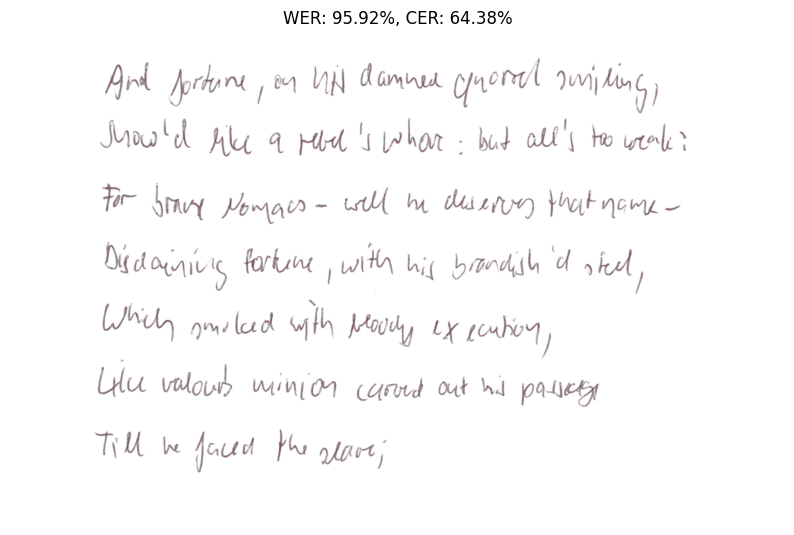

[2024/05/18 03:34:08] ppocr DEBUG: dt_boxes num : 16, elapsed : 0.7050187587738037
[2024/05/18 03:34:08] ppocr DEBUG: cls num  : 16, elapsed : 0.11528611183166504
[2024/05/18 03:34:09] ppocr DEBUG: rec_res num  : 16, elapsed : 1.085270643234253
Ground Truth: Imagine a vast sheet of paper on which straight Lines, Triangles, Squares, Pentagons. Hexagons, and other figures, instead of remaining fixed in their places, move freely about, on or in the surface, but without the power of rising above or sinking below it, very much like shadows - only hard and with luminous edges - and you will then have a pretty correct notion of my country and countrymen. Alas, a few years ago, I should have said "my universe": but now my mind has been opened to higher views of things.
OCR Text: Jnqgin a yaF g n he sn|S Ling Trarg! oysjand 0 igury) Injhai +uly Q}0ovF on or in the yg abou or j,nking f, 4ry mwr hle ndu nq owy ad nd  wy ou dn-ard jpwil  r 1 pnhy umt nohn y ny lmu=ly amd Lunhy nin. A 4w yuwn go,I 

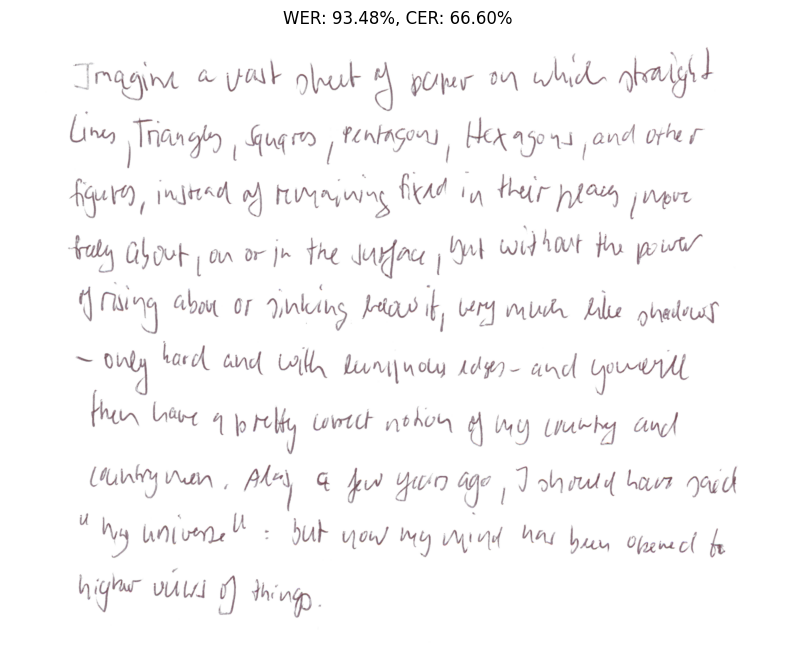

[2024/05/18 03:34:12] ppocr DEBUG: dt_boxes num : 8, elapsed : 0.3002040386199951
[2024/05/18 03:34:12] ppocr DEBUG: cls num  : 8, elapsed : 0.026073217391967773
[2024/05/18 03:34:13] ppocr DEBUG: rec_res num  : 8, elapsed : 0.4144313335418701
Ground Truth: Imagine a vast sheet of paper on which straight Lines, Triangles, Squares, Pentagons. Hexagons, and other figures, instead of remaining fixed in their places, move freely about, on or in the surface, but without the power of rising above or sinking below it, very much like shadows - only hard and with luminous edges - and you will then have a pretty correct notion of my country and countrymen. Alas, a few years ago, I should have said "my universe": but now my mind has been opened to higher views of things.
OCR Text:   Pentagon 4 pety comrech nho~d ry c I slould howe sorie! LuJ nou my nind ha ke. opened lo $ 5onm my hghw vious ef 1hingj
WER: 97.83%, CER: 83.20%



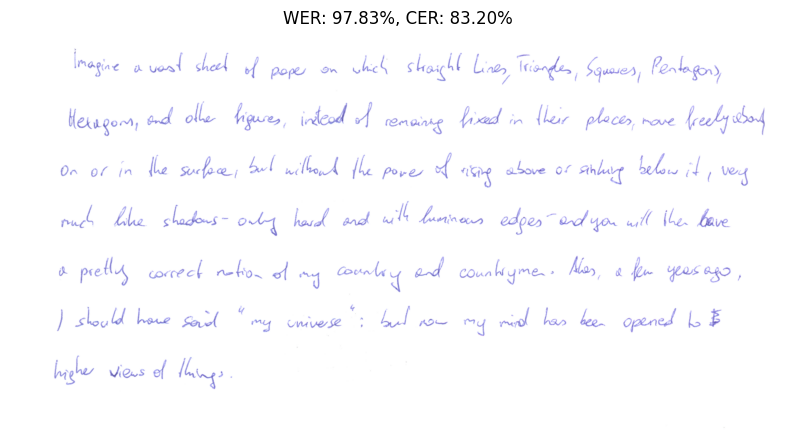

Final Average Word Error Rate (WER): 94.35%
Final Average Character Error Rate (CER): 71.28%
Word Error Rate (WER): 94.35%
Character Error Rate (CER): 71.28%


In [ ]:
import os
import cv2
import numpy as np
from paddleocr import PaddleOCR
from jiwer import wer, cer
import editdistance
from typing import List
import matplotlib.pyplot as plt

def calculate_wer(reference_texts, predicted_texts):
    total_wer = 0
    for ref, pred in zip(reference_texts, predicted_texts):
        total_wer += wer(ref, pred)
    return total_wer / len(reference_texts)

def calculate_cer(reference_texts, predicted_texts):
    total_cer = 0
    for ref, pred in zip(reference_texts, predicted_texts):
        total_cer += cer(ref, pred)
    return total_cer / len(reference_texts)

def decode_ocr_results(ocr_results):
    decoded_texts = []
    for line in ocr_results:
        line_text = ' '.join([word_info[1][0] for word_info in line])
        decoded_texts.append(line_text)
    return ' '.join(decoded_texts)

def word_error_rate(ground_truth: str, prediction: str) -> float:
    ground_truth_words = ground_truth.split()
    prediction_words = prediction.split()
    return editdistance.eval(ground_truth_words, prediction_words) / len(ground_truth_words)

def character_error_rate(ground_truth: str, prediction: str) -> float:
    return editdistance.eval(ground_truth, prediction) / len(ground_truth)

def evaluate_ocr(ocr: PaddleOCR, image_paths: List[str], ground_truth_texts: List[str]) -> (float, float):
    total_wer = 0
    total_cer = 0
    total_words = 0
    total_chars = 0
    predicted_texts = []
    individual_metrics = []
    for img_path, gt_text in zip(image_paths, ground_truth_texts):
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        result = ocr.ocr(image, cls=True)
        ocr_text = decode_ocr_results(result)
        predicted_texts.append(ocr_text)
        wer_value = word_error_rate(gt_text, ocr_text)
        cer_value = character_error_rate(gt_text, ocr_text)
        total_wer += wer_value * len(gt_text.split())
        total_cer += cer_value * len(gt_text)
        total_words += len(gt_text.split())
        total_chars += len(gt_text)
        individual_metrics.append((wer_value, cer_value))
        print(f"Ground Truth: {gt_text}")
        print(f"OCR Text: {ocr_text}")
        print(f"WER: {wer_value * 100:.2f}%, CER: {cer_value * 100:.2f}%\n")
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.title(f"WER: {wer_value * 100:.2f}%, CER: {cer_value * 100:.2f}%")
        plt.axis('off')
        plt.show()
    average_wer = total_wer / total_words
    average_cer = total_cer / total_chars
    print(f"Final Average Word Error Rate (WER): {average_wer * 100:.2f}%")
    print(f"Final Average Character Error Rate (CER): {average_cer * 100:.2f}%")
    return average_wer, average_cer

ocr = PaddleOCR(use_angle_cls=True, lang='en', use_gpu=False, drop_score=0.3, det_db_unclip_ratio=4.0)

eval_image_paths = ['/content/drive/MyDrive/HTR_Data/Eval/Bad/0002-6.tif',
                    '/content/drive/MyDrive/HTR_Data/Eval/Bad/0041-2.tif',
                    '/content/drive/MyDrive/HTR_Data/Eval/Bad/0041-1.tif',
                    '/content/drive/MyDrive/HTR_Data/Eval/Bad/0028-1.tif']

ground_truth_texts = ["Werd' ich zum Augenblicke sagen: Verweile doch! du bist so schön! Dann magst du mich in Fesseln schlagen, Dann will ich gern zu Grunde gehn! Dann mag die Todtenglocke schallen, Dann bist du deines Dienstes frey, Die Uhr mag stehn, der Zeiger fallen, Es sey die Zeit für mich vorbey!",
                      "And fortune, on his damned quarrel smiling, Show'd like a rebel's whore: but all's too weak: For brave Nomacs - well he deserves that name - Disdaining fortune, with his brandish'd steel, Which smoked with bloody execution, Like valour's minion carved out his passage Till he faced the slave;",
                      "Imagine a vast sheet of paper on which straight Lines, Triangles, Squares, Pentagons. Hexagons, and other figures, instead of remaining fixed in their places, move freely about, on or in the surface, but without the power of rising above or sinking below it, very much like shadows - only hard and with luminous edges - and you will then have a pretty correct notion of my country and countrymen. Alas, a few years ago, I should have said \"my universe\": but now my mind has been opened to higher views of things.",
                      "Imagine a vast sheet of paper on which straight Lines, Triangles, Squares, Pentagons. Hexagons, and other figures, instead of remaining fixed in their places, move freely about, on or in the surface, but without the power of rising above or sinking below it, very much like shadows - only hard and with luminous edges - and you will then have a pretty correct notion of my country and countrymen. Alas, a few years ago, I should have said \"my universe\": but now my mind has been opened to higher views of things."]

wer_value, cer_value = evaluate_ocr(ocr, eval_image_paths, ground_truth_texts)
print(f"Word Error Rate (WER): {wer_value * 100:.2f}%")
print(f"Character Error Rate (CER): {cer_value * 100:.2f}%")


###Word Detection on New Images

In [ ]:
import os
import cv2
import numpy as np
from typing import List
from PIL import Image as im
from pathlib import Path
import matplotlib.pyplot as plt
from dataclasses import dataclass, field
from collections import defaultdict
from sklearn.cluster import DBSCAN
from paddleocr import PaddleOCR

def load_images_from_folder(folder: str) -> List[np.ndarray]:
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
    return images

def enhance_img(image: np.ndarray) -> np.ndarray:
    def color_corr(image):
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        cl = clahe.apply(l)
        limg = cv2.merge((cl, a, b))
        final = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
        return final

    def fix_bright_cont(image, brightness=0, contrast=30):
        beta = brightness
        alpha = contrast / 127.0 + 1.0
        new_image = cv2.convertScaleAbs(image, alpha=alpha, beta=beta)
        return new_image

    def edge_enhance(image):
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        edges = cv2.Canny(gray, 250, 450)
        edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
        enhanced_image = cv2.addWeighted(image, 0.85, edges, 0.15, 0)
        return enhanced_image

    def fix_shadows(image):
        rgb_planes = cv2.split(image)
        result_planes = []
        for plane in rgb_planes:
            dilated_img = cv2.dilate(plane, np.ones((7, 7), np.uint8))
            bg_img = cv2.medianBlur(dilated_img, 21)
            diff_img = 255 - cv2.absdiff(plane, bg_img)
            result_planes.append(diff_img)
        result = cv2.merge(result_planes)
        return result

    def fix_sharp(image):
        kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
        sharpened = cv2.filter2D(image, -1, kernel)
        return sharpened

    # Resize image to a higher resolution
    high_res_image = cv2.resize(image, (image.shape[1] * 2, image.shape[0] * 2), interpolation=cv2.INTER_CUBIC)

    image = color_corr(high_res_image)
    image = fix_bright_cont(image)
    image = edge_enhance(image)
    image = fix_shadows(image)
    image = fix_sharp(image)
    return image


def preprocess_img(source: str, final: str):
    images = load_images_from_folder(source)
    preprocessed_images = [enhance_img(image) for image in images]
    save_images_to_folder(preprocessed_images, final, dpi=300)

def save_images_to_folder(images: List[np.ndarray], final: str, dpi=300):
    if not os.path.exists(final):
        os.makedirs(final)
    for i, image in enumerate(images):
        pil_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pil_image = im.fromarray(pil_image)
        pil_image.save(os.path.join(final, f"preprocessed_{i}.png"), dpi=(dpi, dpi))

source = '/content/drive/MyDrive/HTR_Data/Eval/Good'
final = '/content/drive/MyDrive/HTR_Data/Eval/preprocess'
preprocess_img(source, final)


Processing file /content/drive/MyDrive/HTR_Data/Eval/preprocess/preprocessed_0.png


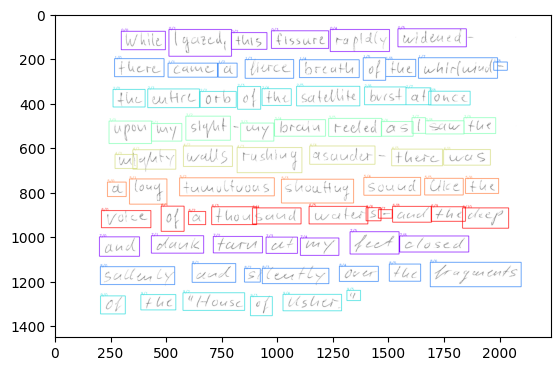

Processing file /content/drive/MyDrive/HTR_Data/Eval/preprocess/preprocessed_1.png


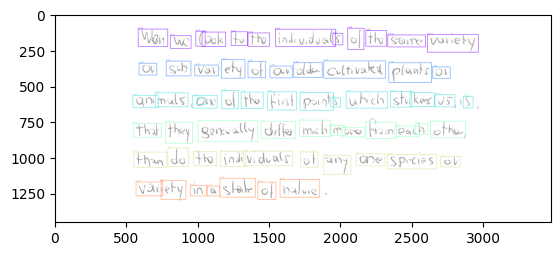

Processing file /content/drive/MyDrive/HTR_Data/Eval/preprocess/preprocessed_2.png


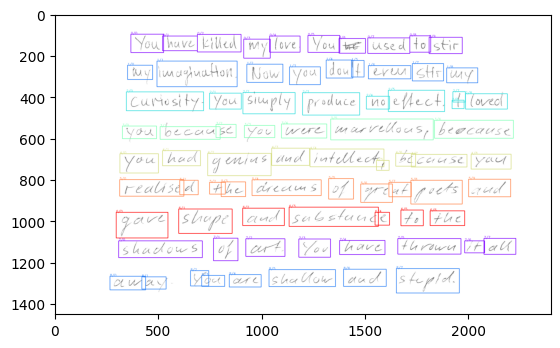

Processing file /content/drive/MyDrive/HTR_Data/Eval/preprocess/preprocessed_3.png


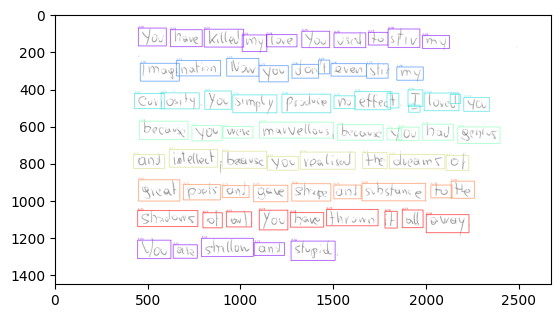

Processing file /content/drive/MyDrive/HTR_Data/Eval/preprocess/preprocessed_4.png


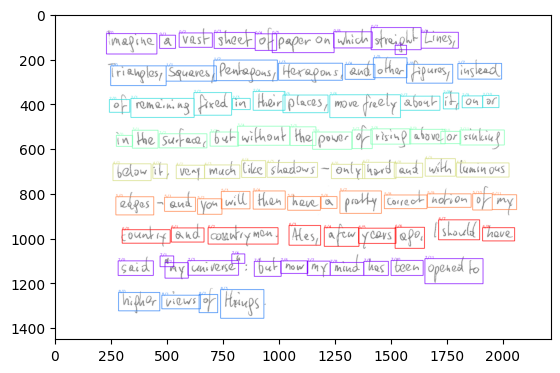

In [ ]:
@dataclass
class BBox:
    x: int
    y: int
    w: int
    h: int

@dataclass
class DetectorRes:
    img: np.ndarray
    bbox: BBox

def detect(img: np.ndarray, kernel_size: int, sigma: float, theta: float, min_area: int, target_height: int, target_width: int) -> List[DetectorRes]:
    assert img.ndim == 2
    assert img.dtype == np.uint8
    kernel = _compute_kernel(kernel_size, sigma, theta)
    img_filtered = cv2.filter2D(img, -1, kernel, borderType=cv2.BORDER_REPLICATE).astype(np.uint8)
    img_thres = 255 - cv2.threshold(img_filtered, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
    res = []
    components = cv2.findContours(img_thres, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)[0]
    for c in components:
        if cv2.contourArea(c) < min_area:
            continue
        x, y, w, h = cv2.boundingRect(c)
        padding = 11
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = w + 2 * padding
        h = h + 2 * padding
        crop = img[y:y + h, x:x + w]
        crop_padded = pad_image(crop, target_height, target_width)
        res.append(DetectorRes(crop_padded, BBox(x, y, w, h)))
    return res

def pad_image(img, target_height=512, target_width=512):
    h, w = img.shape[:2]
    pad_h = max((target_height - h) // 2, 0)
    pad_w = max((target_width - w) // 2, 0)
    padded_img = cv2.copyMakeBorder(img, pad_h, pad_h, pad_w, pad_w, cv2.BORDER_CONSTANT, value=[255, 255, 255])
    return padded_img

def _compute_kernel(kernel_size: int, sigma: float, theta: float) -> np.ndarray:
    assert kernel_size % 2
    half_size = kernel_size // 2
    xs = ys = np.linspace(-half_size, half_size, kernel_size)
    x, y = np.meshgrid(xs, ys)
    sigma_y = sigma
    sigma_x = sigma_y * theta
    exp_term = np.exp(-x ** 2 / (2 * sigma_x) - y ** 2 / (2 * sigma_y))
    x_term = (x ** 2 - sigma_x ** 2) / (2 * np.math.pi * sigma_x ** 5 * sigma_y)
    y_term = (y ** 2 - sigma_y ** 2) / (2 * np.math.pi * sigma_y ** 5 * sigma_x)
    kernel = (x_term + y_term) * exp_term
    kernel = kernel / np.sum(kernel)
    return kernel

def prepare_img(img: np.ndarray, height: int) -> np.ndarray:
    assert img.ndim in (2, 3)
    assert height > 0
    assert img.dtype == np.uint8
    if img.ndim == 3:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h = img.shape[0]
    factor = height / h
    return cv2.resize(img, dsize=None, fx=factor, fy=factor)

def _cluster_lines(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    num_bboxes = len(detections)
    dist_mat = np.ones((num_bboxes, num_bboxes))
    for i in range(num_bboxes):
        for j in range(i, num_bboxes):
            a = detections[i].bbox
            b = detections[j].bbox
            if a.y > b.y + b.h or b.y > a.y + a.h:
                continue
            intersection = min(a.y + a.h, b.y + b.h) - max(a.y, b.y)
            union = a.h + b.h - intersection
            iou = np.clip(intersection / union if union > 0 else 0, 0, 1)
            dist_mat[i, j] = dist_mat[j, i] = 1 - iou
    dbscan = DBSCAN(eps=max_dist, min_samples=min_words_per_line, metric='precomputed').fit(dist_mat)

    clustered = defaultdict(list)
    for i, cluster_id in enumerate(dbscan.labels_):
        if cluster_id == -1:
            continue
        clustered[cluster_id].append(detections[i])
    res = sorted(clustered.values(), key=lambda line: [det.bbox.y + det.bbox.h / 2 for det in line])
    return res

def sort_multiline(detections: List[DetectorRes], max_dist: float = 0.7, min_words_per_line: int = 2) -> List[List[DetectorRes]]:
    lines = _cluster_lines(detections, max_dist, min_words_per_line)
    res = []
    for line in lines:
        res += sort_line(line)
    return res

def sort_line(detections: List[DetectorRes]) -> List[List[DetectorRes]]:
    return [sorted(detections, key=lambda det: det.bbox.x + det.bbox.w / 2)]

def get_img_files(data_dir: Path) -> List[Path]:
    res = []
    for ext in ['*.png', '*.jpg', '*.jpeg']:
        res += list(data_dir.glob(ext))
    return res

def save_image_names_to_text_files(data_dir: Path, kernel_size: int, sigma: float, theta: float, min_area: int, img_height: int, target_height: int, target_width: int):
    list_img_names_serial = []
    for fn_img in get_img_files(data_dir):
        print(f'Processing file {fn_img}')
        img = prepare_img(cv2.imread(str(fn_img)), img_height)
        detections = detect(img, kernel_size=kernel_size, sigma=sigma, theta=theta, min_area=min_area, target_height=target_height, target_width=target_width)
        lines = sort_multiline(detections)
        annotated_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        num_colors = 7
        colors = plt.cm.get_cmap('rainbow', num_colors)
        for line_idx, line in enumerate(lines):
            for word_idx, det in enumerate(line):
                xs = [det.bbox.x, det.bbox.x, det.bbox.x + det.bbox.w, det.bbox.x + det.bbox.w, det.bbox.x]
                ys = [det.bbox.y, det.bbox.y + det.bbox.h, det.bbox.y + det.bbox.h, det.bbox.y, det.bbox.y]
                color = tuple(int(255 * c) for c in colors(line_idx % num_colors)[:3])
                cv2.polylines(annotated_img, [np.array(list(zip(xs, ys)), dtype=np.int32)], isClosed=True, color=color, thickness=2)
                cv2.putText(annotated_img, f'{line_idx}/{word_idx}', (det.bbox.x, det.bbox.y), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)
                crop_img = img[det.bbox.y:det.bbox.y + det.bbox.h, det.bbox.x:det.bbox.x + det.bbox.w]
                path = '/content/drive/MyDrive/HTR_Data/Eval/cropped'
                if not os.path.exists(path):
                    os.mkdir(path)
                    print("Directory Created")
                # Ensure high resolution for cropped images
                high_res_crop_img = cv2.resize(crop_img, (target_width, target_height), interpolation=cv2.INTER_CUBIC)
                pil_crop_img = cv2.cvtColor(high_res_crop_img, cv2.COLOR_GRAY2RGB)
                pil_crop_img = im.fromarray(pil_crop_img)
                pil_crop_img.save(f"{path}/line{line_idx}_word{word_idx}.jpg", dpi=(500, 500))
                full_img_path = f"line{line_idx}_word{word_idx}.jpg"
                list_img_names_serial.append(full_img_path)
                with open("/content/drive/MyDrive/HTR_Data/Eval/cropped/img_names_sequence.txt", "w") as textfile:
                    for element in list_img_names_serial:
                        textfile.write(element + "\n")
        # Saving annotated image
        annotated_path = '/content/drive/MyDrive/HTR_Data/Eval/Annotated'
        if not os.path.exists(annotated_path):
            os.mkdir(annotated_path)
            print("Annotated Directory Created")
        annotated_img_name = os.path.join(annotated_path, os.path.basename(fn_img))
        cv2.imwrite(annotated_img_name, annotated_img)
        plt.imshow(annotated_img)
        plt.show()

data_dir = Path('/content/drive/MyDrive/HTR_Data/Eval/preprocess')
kernel_size = 39
sigma = 40
theta = 23
min_area = 420
img_height = 1450
target_height = 512
target_width = 1536

save_image_names_to_text_files(data_dir, kernel_size, sigma, theta, min_area, img_height, target_height, target_width)